In [1]:
import torch

if torch.cuda.is_available():
    print(f"✅ GPU is available! - {torch.cuda.get_device_name(0)}")
    print(f"🔥 CUDA Version: {torch.version.cuda}")
    print(f"🛠️ GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("❌ GPU not detected! Running on CPU.")

✅ GPU is available! - NVIDIA GeForce RTX 3060
🔥 CUDA Version: 11.8
🛠️ GPU Memory: 12.88 GB


In [1]:
import os

drishti_root = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS"

for root, dirs, files in os.walk(drishti_root):
    level = root.replace(drishti_root, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files[:5]:  # limit to 5 files per folder
        print(f"{subindent}{f}")


Drishti-GS/
    Test-20211018T060000Z-001/
        Test/
            Images/
                glaucoma/
                    drishtiGS_001.png
                    drishtiGS_003.png
                    drishtiGS_005.png
                    drishtiGS_006.png
                    drishtiGS_011.png
                normal/
                    drishtiGS_007.png
                    drishtiGS_009.png
                    drishtiGS_013.png
                    drishtiGS_072.png
                    drishtiGS_078.png
            Test_GT/
                drishtiGS_001/
                    drishtiGS_001_cdrValues.txt
                    AvgBoundary/
                        drishtiGS_001_CupAvgBoundary.txt
                        drishtiGS_001_diskCenter.txt
                        drishtiGS_001_ODAvgBoundary.txt
                    SoftMap/
                        drishtiGS_001_cupsegSoftmap.png
                        drishtiGS_001_ODsegSoftmap.png
                drishtiGS_003/
                    dri

In [3]:
acrima_root = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima"

print("\n📁 ACRIMA Dataset Structure:\n")
for root, dirs, files in os.walk(acrima_root):
    level = root.replace(acrima_root, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files[:5]:  # Print only first 5 files per folder
        print(f"{subindent}{f}")



📁 ACRIMA Dataset Structure:

Acrima/
    test/
        Glaucoma/
            Im322_g_ACRIMA.jpg
            Im323_g_ACRIMA.jpg
            Im324_g_ACRIMA.jpg
            Im325_g_ACRIMA.jpg
            Im326_g_ACRIMA.jpg
        Non Glaucoma/
            Im013_ACRIMA.jpg
            Im014_ACRIMA.jpg
            Im015_ACRIMA.jpg
            Im016_ACRIMA.jpg
            Im017_ACRIMA.jpg
    train/
        Glaucoma/
            Im310_g_ACRIMA.jpg
            Im311_g_ACRIMA.jpg
            Im312_g_ACRIMA.jpg
            Im313_g_ACRIMA.jpg
            Im314_g_ACRIMA.jpg
        Non Glaucoma/
            Im001_ACRIMA.jpg
            Im002_ACRIMA.jpg
            Im003_ACRIMA.jpg
            Im004_ACRIMA.jpg
            Im005_ACRIMA.jpg


In [4]:
import os

origa_root = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1"

print("📁 ORIGA-1 Dataset Structure:\n")
for root, dirs, files in os.walk(origa_root):
    level = root.replace(origa_root, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in files[:5]:  # Limit to 5 files per folder for readability
        print(f"{subindent}{f}")


📁 ORIGA-1 Dataset Structure:

ORIGA-1/
    OrigaList.csv
    origa_info.csv
    Images/
        001.jpg
        002.jpg
        003.jpg
        004.jpg
        005.jpg
    Images_Cropped/
        001.jpg
        002.jpg
        003.jpg
        004.jpg
        005.jpg
    Images_Square/
        ._003.jpg
        001.jpg
        002.jpg
        003.jpg
        004.jpg
    Masks/
        001.png
        002.png
        003.png
        004.png
        005.png
    Masks_Cropped/
        001.png
        002.png
        003.png
        004.png
        005.png
    Masks_Square/
        ._005.png
        001.png
        002.png
        003.png
        004.png
    Semi-automatic-annotations/
        001.mat
        002.mat
        003.mat
        004.mat
        005.mat


In [5]:
import pandas as pd
import os

# Set paths
origa_root = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1"
csv_path = os.path.join(origa_root, "OrigaList.csv")
image_folder = os.path.join(origa_root, "Images_Square")
mask_folder = os.path.join(origa_root, "Masks_Square")

# Load original metadata
df = pd.read_csv(csv_path)

# Rename and add paths
df.rename(columns={"Filename": "Filename", "Glaucoma": "Label", "ExpCDR": "ExpCDR"}, inplace=True)
df["CDR_Norm"] = df["ExpCDR"] / df["ExpCDR"].max()

# Generate full image and mask paths
df["ImagePath"] = df["Filename"].apply(lambda x: os.path.join(image_folder, x))
df["MaskPath"] = df["Filename"].apply(lambda x: os.path.join(mask_folder, x.replace(".jpg", ".png")))

# Save cleaned metadata
output_path = os.path.join(origa_root, "origa_metadata.csv")
df.to_csv(output_path, index=False)

print("✅ origa_metadata.csv generated successfully!")


✅ origa_metadata.csv generated successfully!


In [6]:
import os
import shutil
import pandas as pd

acrima_root = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima"
output_dir = os.path.join(acrima_root, "images")  # flattened image folder
os.makedirs(output_dir, exist_ok=True)

metadata = []

# Loop over train and test sets
for split in ["train", "test"]:
    for label_folder in ["Glaucoma", "Non Glaucoma"]:
        folder_path = os.path.join(acrima_root, split, label_folder)
        if not os.path.exists(folder_path):
            continue

        label = label_folder.replace(" ", "")  # normalize label name

        for filename in os.listdir(folder_path):
            src_path = os.path.join(folder_path, filename)
            dst_path = os.path.join(output_dir, filename)

            # Copy image to flattened folder (skip if already exists)
            if not os.path.exists(dst_path):
                shutil.copy(src_path, dst_path)

            metadata.append({
                "Filename": filename,
                "Label": label,
                "Split": split,
                "ImagePath": dst_path
            })

# Save to CSV
df = pd.DataFrame(metadata)
output_csv = os.path.join(acrima_root, "acrima_metadata.csv")
df.to_csv(output_csv, index=False)

print("✅ acrima_metadata.csv created and images flattened!")


✅ acrima_metadata.csv created and images flattened!


In [7]:
import os
import pandas as pd

# Define root folders
drishti_root = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS"
test_img_dir = os.path.join(drishti_root, "Test-20211018T060000Z-001", "Test", "Images")
test_gt_dir = os.path.join(drishti_root, "Test-20211018T060000Z-001", "Test", "Test_GT")

metadata = []

for label_folder in ["glaucoma", "normal"]:
    label = "Glaucoma" if label_folder == "glaucoma" else "NonGlaucoma"
    img_dir = os.path.join(test_img_dir, label_folder)
    
    for filename in os.listdir(img_dir):
        if not filename.endswith(".png"):
            continue
        
        image_id = filename.replace(".png", "")
        image_path = os.path.join(img_dir, filename)

        gt_folder = os.path.join(test_gt_dir, image_id)
        cup_mask_path = os.path.join(gt_folder, "SoftMap", f"{image_id}_cupsegSoftmap.png")
        disc_mask_path = os.path.join(gt_folder, "SoftMap", f"{image_id}_ODsegSoftmap.png")
        cdr_value_file = os.path.join(gt_folder, f"{image_id}_cdrValues.txt")

        # Read CDR if file exists
        try:
            with open(cdr_value_file, 'r') as f:
                cdr = float(f.readline().strip())
        except:
            cdr = None

        metadata.append({
            "Filename": filename,
            "Label": label,
            "ImagePath": image_path,
            "CupMaskPath": cup_mask_path,
            "DiscMaskPath": disc_mask_path,
            "CDR": cdr
        })

# Save metadata
df = pd.DataFrame(metadata)
output_csv = os.path.join(drishti_root, "drishti_metadata.csv")
df.to_csv(output_csv, index=False)

print("✅ drishti_metadata.csv created successfully!")


✅ drishti_metadata.csv created successfully!


In [8]:
import pandas as pd
import numpy as np
from PIL import Image

# Load metadata
drishti_csv = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_metadata.csv"
df = pd.read_csv(drishti_csv)

def compute_cdr_from_masks(cup_path, disc_path):
    try:
        cup = np.array(Image.open(cup_path).convert('L'))
        disc = np.array(Image.open(disc_path).convert('L'))
        
        cup_area = np.sum(cup > 0)
        disc_area = np.sum(disc > 0)
        
        if disc_area == 0:
            return None
        return round(cup_area / disc_area, 4)
    except:
        return None

# Fill missing CDR values
df["CDR_Filled"] = df.apply(
    lambda row: row["CDR"] if not pd.isna(row["CDR"]) else compute_cdr_from_masks(row["CupMaskPath"], row["DiscMaskPath"]),
    axis=1
)

# Normalize CDR
df["CDR_Norm"] = df["CDR_Filled"] / df["CDR_Filled"].max()

# Save updated metadata
df.to_csv(drishti_csv, index=False)
print("✅ CDR values updated and normalized in drishti_metadata.csv")


✅ CDR values updated and normalized in drishti_metadata.csv


In [9]:
import torch
import torch.nn as nn
import torchvision.models as models

class ResNet50_FeatureExtractor(nn.Module):
    def __init__(self):
        super(ResNet50_FeatureExtractor, self).__init__()
        # Load pretrained ResNet50
        base_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.feature_extractor = nn.Sequential(*list(base_model.children())[:-1])  # Remove final FC layer

    def forward(self, x):
        with torch.no_grad():
            features = self.feature_extractor(x)  # Output shape: [B, 2048, 1, 1]
            features = features.view(features.size(0), -1)  # Flatten to [B, 2048]
        return features

# Instantiate model and move to GPU (if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet_model = ResNet50_FeatureExtractor().to(device)
resnet_model.eval()

print("✅ ResNet50 feature extractor initialized.")


✅ ResNet50 feature extractor initialized.


In [23]:
import pandas as pd
import numpy as np
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import torch

# 🔧 Common transforms for ResNet
img_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# 🔄 Custom dataset from metadata
class MetaImageDataset(Dataset):
    def __init__(self, df, image_col, label_col=None, transform=None):
        self.df = df
        self.image_col = image_col
        self.label_col = label_col
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.iloc[idx][self.image_col]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        if self.label_col:
            label = self.df.iloc[idx][self.label_col]
            return image, label
        else:
            return image

# ⚙️ Function to extract & save features
def extract_and_save_features(metadata_path, image_col, label_col, output_prefix):
    df = pd.read_csv(metadata_path)
    dataset = MetaImageDataset(df, image_col=image_col, label_col=label_col, transform=img_transform)
    loader = DataLoader(dataset, batch_size=32, shuffle=False)

    features = []
    labels = []

    label_map = {"Glaucoma": 1, "NonGlaucoma": 0}

    for batch in tqdm(loader, desc=f"Extracting {output_prefix} features"):
        # ✅ Safe unpacking of batch
        if isinstance(batch, (list, tuple)) and len(batch) == 2:
            inputs, lbls = batch
        else:
            inputs = batch
            lbls = [0] * inputs.size(0)

        inputs = inputs.to(device)
        outputs = resnet_model(inputs)
        features.append(outputs.cpu().numpy())

        # ✅ Safe label conversion
        if isinstance(lbls, torch.Tensor):
            labels.extend(lbls.cpu().numpy().tolist())
        elif isinstance(lbls, (list, tuple, pd.Series, np.ndarray)):
            labels.extend([
                label_map.get(str(l).strip(), 0)  # default to 0 if unknown
                for l in lbls
            ])
        else:
            l = lbls
            labels.extend([label_map.get(str(l).strip(), 0)])

    features = np.vstack(features)
    labels = np.array(labels)

    # Save features
    np.save(f"{output_prefix}_features.npy", features)
    np.save(f"{output_prefix}_labels.npy", labels)

    # Also save as CSV
    df_feat = pd.DataFrame(features)
    df_feat['Label'] = labels
    df_feat.to_csv(f"{output_prefix}_features.csv", index=False)

    print(f"✅ Saved: {output_prefix}_features.csv / .npy")



In [24]:
# ORIGA
extract_and_save_features(
    metadata_path=r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\origa_metadata.csv",
    image_col="ImagePath",
    label_col="Label",
    output_prefix="origa_resnet"
)

# ACRIMA
extract_and_save_features(
    metadata_path=r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata.csv",
    image_col="ImagePath",
    label_col="Label",
    output_prefix="acrima_resnet"
)

# DRISHTI
extract_and_save_features(
    metadata_path=r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_metadata.csv",
    image_col="ImagePath",
    label_col="Label",
    output_prefix="drishti_resnet"
)


Extracting origa_resnet features: 100%|██████████████████████████████████████████████████████████████| 21/21 [00:06<00:00,  3.46it/s]


✅ Saved: origa_resnet_features.csv / .npy


Extracting acrima_resnet features: 100%|█████████████████████████████████████████████████████████████| 23/23 [00:12<00:00,  1.77it/s]


✅ Saved: acrima_resnet_features.csv / .npy


Extracting drishti_resnet features: 100%|██████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.92s/it]


✅ Saved: drishti_resnet_features.csv / .npy


In [26]:
import pandas as pd
import numpy as np

# ✅ Load ResNet features (2048-dim + Label)
resnet_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")

# ✅ Load metadata (contains CDR_Norm column)
meta_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\origa_metadata.csv")

# ✅ Sanity check
assert len(resnet_df) == len(meta_df), "Mismatch in rows between ResNet features and metadata!"

# ✅ Add CDR_Norm to ResNet features
resnet_df["CDR_Norm"] = meta_df["CDR_Norm"]

# ✅ Save fused features to CSV
resnet_df.to_csv(r"D:\ProjectML2 - Glaucoma\origa_fused_features.csv", index=False)

print("✅ Saved: origa_fused_features.csv with ResNet + CDR_Norm")


✅ Saved: origa_fused_features.csv with ResNet + CDR_Norm


In [27]:
import pandas as pd
import numpy as np

# ✅ Load ResNet features
resnet_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")

# ✅ Load metadata (must contain CDR_Norm)
meta_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_metadata.csv")

# ✅ Check match
assert len(resnet_df) == len(meta_df), "Mismatch in sample count!"

# ✅ Add CDR_Norm to ResNet features
resnet_df["CDR_Norm"] = meta_df["CDR_Norm"]

# ✅ Save final fused file
resnet_df.to_csv(r"D:\ProjectML2 - Glaucoma\drishti_fused_features.csv", index=False)

print("✅ Saved: drishti_fused_features.csv with ResNet + CDR_Norm")


✅ Saved: drishti_fused_features.csv with ResNet + CDR_Norm


In [28]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# 📥 Load fused features
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_fused_features.csv")

# 📊 Features & Labels
X = df.drop("Label", axis=1)
y = df["Label"]

# 🔀 Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 🌲 Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
rf_preds = rf.predict(X_test)

print("\n📊 Random Forest Results:")
print(classification_report(y_test, rf_preds))
print(confusion_matrix(y_test, rf_preds))

# ⚡ XGBoost
xgb = XGBClassifier(n_estimators=100, learning_rate=0.1, use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb.fit(X_train, y_train)
xgb_preds = xgb.predict(X_test)

print("\n📊 XGBoost Results:")
print(classification_report(y_test, xgb_preds))
print(confusion_matrix(y_test, xgb_preds))



📊 Random Forest Results:
              precision    recall  f1-score   support

           0       0.76      0.98      0.85        96
           1       0.67      0.12      0.20        34

    accuracy                           0.75       130
   macro avg       0.71      0.55      0.53       130
weighted avg       0.73      0.75      0.68       130

[[94  2]
 [30  4]]


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [16:08:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



📊 XGBoost Results:
              precision    recall  f1-score   support

           0       0.82      0.90      0.86        96
           1       0.60      0.44      0.51        34

    accuracy                           0.78       130
   macro avg       0.71      0.67      0.68       130
weighted avg       0.76      0.78      0.76       130

[[86 10]
 [19 15]]


In [29]:
import numpy as np
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score

# 🎯 Get predicted probabilities from XGBoost
probs = xgb.predict_proba(X_test)[:, 1]  # probability of class 1 (Glaucoma)

# 🔍 Threshold sweep
thresholds = np.arange(0.1, 0.6, 0.05)

print("\n🔎 Threshold Tuning Results (for Glaucoma class):\n")
for thresh in thresholds:
    preds = (probs >= thresh).astype(int)
    
    acc = accuracy_score(y_test, preds)
    recall = recall_score(y_test, preds)
    precision = precision_score(y_test, preds)
    f1 = f1_score(y_test, preds)

    print(f"Threshold: {thresh:.2f} | Acc: {acc:.2f} | Prec: {precision:.2f} | Recall: {recall:.2f} | F1: {f1:.2f}")



🔎 Threshold Tuning Results (for Glaucoma class):

Threshold: 0.10 | Acc: 0.72 | Prec: 0.47 | Recall: 0.68 | F1: 0.55
Threshold: 0.15 | Acc: 0.75 | Prec: 0.51 | Recall: 0.65 | F1: 0.57
Threshold: 0.20 | Acc: 0.75 | Prec: 0.52 | Recall: 0.65 | F1: 0.58
Threshold: 0.25 | Acc: 0.78 | Prec: 0.57 | Recall: 0.59 | F1: 0.58
Threshold: 0.30 | Acc: 0.79 | Prec: 0.61 | Recall: 0.56 | F1: 0.58
Threshold: 0.35 | Acc: 0.79 | Prec: 0.61 | Recall: 0.56 | F1: 0.58
Threshold: 0.40 | Acc: 0.78 | Prec: 0.59 | Recall: 0.47 | F1: 0.52
Threshold: 0.45 | Acc: 0.78 | Prec: 0.59 | Recall: 0.47 | F1: 0.52
Threshold: 0.50 | Acc: 0.78 | Prec: 0.60 | Recall: 0.44 | F1: 0.51
Threshold: 0.55 | Acc: 0.78 | Prec: 0.61 | Recall: 0.41 | F1: 0.49


In [30]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# ✅ Define base learners
base_learners = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, learning_rate=0.1, eval_metric='logloss', random_state=42))
]

# ✅ Define meta-learner
meta_learner = LogisticRegression(max_iter=1000)

# ✅ Create Stacking Classifier
stacking_model = StackingClassifier(
    estimators=base_learners,
    final_estimator=meta_learner,
    cv=5
)

# ✅ Train
stacking_model.fit(X_train, y_train)

# ✅ Predict with stacking
stack_preds = stacking_model.predict(X_test)

# ✅ Evaluation
print("\n📊 Stacking Ensemble Results:")
print(classification_report(y_test, stack_preds))
print(confusion_matrix(y_test, stack_preds))



📊 Stacking Ensemble Results:
              precision    recall  f1-score   support

           0       0.81      0.92      0.86        96
           1       0.64      0.41      0.50        34

    accuracy                           0.78       130
   macro avg       0.73      0.66      0.68       130
weighted avg       0.77      0.78      0.77       130

[[88  8]
 [20 14]]


In [31]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# 🎯 Get probability predictions for class 1 (Glaucoma)
rf_probs = rf.predict_proba(X_test)[:, 1]
xgb_probs = xgb.predict_proba(X_test)[:, 1]

# 🗳 Average the probabilities (Soft Voting)
avg_probs = (rf_probs + xgb_probs) / 2

# 🔍 Apply best threshold
threshold = 0.20
voting_preds = (avg_probs >= threshold).astype(int)

# 📊 Evaluate
print("\n📊 Soft Voting Ensemble Results (Threshold = 0.20):")
print(classification_report(y_test, voting_preds))
print(confusion_matrix(y_test, voting_preds))



📊 Soft Voting Ensemble Results (Threshold = 0.20):
              precision    recall  f1-score   support

           0       0.85      0.67      0.75        96
           1       0.42      0.68      0.52        34

    accuracy                           0.67       130
   macro avg       0.64      0.67      0.63       130
weighted avg       0.74      0.67      0.69       130

[[64 32]
 [11 23]]


In [45]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import os
import cv2
from tqdm import tqdm

In [46]:
# ⚙️ Device config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [52]:
# 🔧 Custom Dataset
class ORIGADataset(Dataset):
    def __init__(self, csv_path, img_dir, transform=None):
        import pandas as pd
        self.data = pd.read_csv(csv_path)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.img_dir, row['ImagePath'])
        image = Image.open(img_path).convert("RGB")
        label = int(row['Label'])

        if self.transform:
            image = self.transform(image)

        return image, label


In [53]:
# 🔁 Transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [54]:
# 📂 Dataset paths
csv_path = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\origa_metadata.csv"
img_dir = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\Images_Square"


In [55]:
# 📦 DataLoader
dataset = ORIGADataset(csv_path, img_dir, transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# 🧠 Model definition
model = models.resnet50(pretrained=True)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 2)
model = model.to(device)

# ⚙️ Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [56]:
# 🔁 Training loop
for epoch in range(3):  # reduce epochs for test run
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(dataloader, desc=f"Epoch {epoch+1}/3"):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss/len(dataloader):.4f}")

Epoch 1/3: 100%|█████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:08<00:00,  2.39it/s]


Epoch 1, Loss: 0.5440


Epoch 2/3: 100%|█████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:07<00:00,  2.73it/s]


Epoch 2, Loss: 0.3020


Epoch 3/3: 100%|█████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:07<00:00,  2.66it/s]

Epoch 3, Loss: 0.1197


In [59]:
import os

# ✅ Ensure directory exists
save_dir = r"D:\ProjectML2 - Glaucoma\models"
os.makedirs(save_dir, exist_ok=True)

# 💾 Save the model
torch.save(model.state_dict(), os.path.join(save_dir, "resnet50_origa.pth"))


In [60]:
# 💾 Save trained model
torch.save(model.state_dict(), r"D:\ProjectML2 - Glaucoma\models\resnet50_origa.pth")


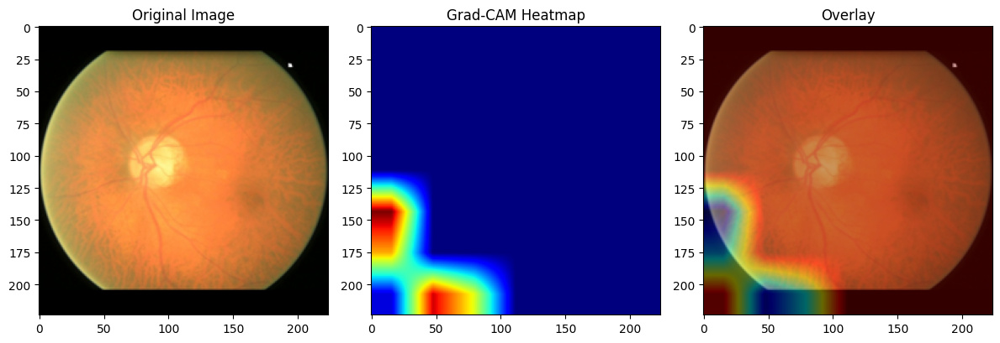

In [61]:
# 🔍 Grad-CAM Implementation
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer

        self.activations = None
        self.gradients = None

        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self, input_tensor, target_class):
        self.model.zero_grad()
        output = self.model(input_tensor)
        score = output[:, target_class].squeeze()
        score.backward()

        weights = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)

        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = F.interpolate(cam, size=input_tensor.shape[2:], mode='bilinear', align_corners=False)

        return cam.squeeze().cpu().numpy()

# 🧠 Load Trained Model for Grad-CAM
model.load_state_dict(torch.load(r"D:\ProjectML2 - Glaucoma\models\resnet50_origa.pth"))
model.eval()

# 🔍 Target the last conv block
target_layer = model.layer4[-1]
grad_cam = GradCAM(model, target_layer)

# 📷 Sample image path
image_path = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\Images_Square\003.jpg"
original_image = Image.open(image_path).convert("RGB")
input_tensor = transform(original_image).unsqueeze(0).to(device)
target_class = 1  # Glaucoma

# ⚡ Generate Grad-CAM
cam_map = grad_cam.generate(input_tensor, target_class)
original_np = np.array(original_image.resize((224, 224)))
heatmap = cv2.applyColorMap(np.uint8(255 * cam_map), cv2.COLORMAP_JET)
overlay = cv2.addWeighted(original_np, 0.6, heatmap, 0.4, 0)

# 📊 Display
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(original_np)
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(cam_map, cmap='jet')
plt.title("Grad-CAM Heatmap")

plt.subplot(1, 3, 3)
plt.imshow(overlay)
plt.title("Overlay")

plt.tight_layout()
plt.show()


In [62]:
# ✅ Batch Grad-CAM Generator for ORIGA Dataset

import os
import torch
import pandas as pd
import numpy as np
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm

# ✅ Load your trained ResNet50 model
import torchvision.models as models
import torch.nn as nn

model = models.resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(r"D:\ProjectML2 - Glaucoma\models\resnet50_origa.pth"))
model = model.to("cuda" if torch.cuda.is_available() else "cpu")
model.eval()

D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [63]:
# ✅ Grad-CAM class
def register_gradcam_hooks(model, target_layer):
    activations = {}
    gradients = {}

    def forward_hook(module, input, output):
        activations['value'] = output.detach()

    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0].detach()

    target_layer.register_forward_hook(forward_hook)
    target_layer.register_full_backward_hook(backward_hook)
    return activations, gradients


In [64]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.activations, self.gradients = register_gradcam_hooks(model, target_layer)
        self.target_layer = target_layer

    def generate(self, input_tensor, target_class):
        self.model.zero_grad()
        output = self.model(input_tensor)
        score = output[:, target_class].squeeze()
        score.backward()

        weights = self.gradients['value'].mean(dim=[2, 3], keepdim=True)
        cam = (weights * self.activations['value']).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = torch.nn.functional.interpolate(cam, size=input_tensor.shape[2:], mode='bilinear', align_corners=False)
        return cam.squeeze().cpu().numpy()

In [66]:
# ✅ Image Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [67]:
# ✅ Load metadata
meta_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\origa_metadata.csv")
glaucoma_df = meta_df[meta_df['Label'] == 1].sample(n=25, random_state=42)
normal_df = meta_df[meta_df['Label'] == 0].sample(n=25, random_state=42)
sample_df = pd.concat([glaucoma_df, normal_df]).reset_index(drop=True)

# ✅ Grad-CAM Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
target_layer = model.layer4[-1]
grad_cam = GradCAM(model, target_layer)

# ✅ Output directory
save_dir = r"D:\ProjectML2 - Glaucoma\outputs\gradcam_origa"
os.makedirs(save_dir, exist_ok=True)


In [68]:
# ✅ Batch generation loop
for i, row in tqdm(sample_df.iterrows(), total=len(sample_df)):
    img_path = row['ImagePath']
    label = int(row['Label'])
    image_name = os.path.basename(img_path)

    # Load and preprocess
    image = Image.open(img_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    # Grad-CAM
    cam_map = grad_cam.generate(input_tensor, target_class=label)

    # Overlay
    original_np = np.array(image.resize((224, 224)))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_map), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(original_np, 0.6, heatmap, 0.4, 0)

    # Save
    out_path = os.path.join(save_dir, f"gradcam_{label}_{image_name}.png")
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(original_np)
    axes[0].set_title("Original Image")
    axes[1].imshow(cam_map, cmap='jet')
    axes[1].set_title("Grad-CAM Heatmap")
    axes[2].imshow(overlay)
    axes[2].set_title("Overlay")
    for ax in axes:
        ax.axis("off")
    plt.tight_layout()
    plt.savefig(out_path)
    plt.close()

print("✅ Batch Grad-CAM generation complete!")

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:19<00:00,  2.57it/s]

✅ Batch Grad-CAM generation complete!


<Figure size 640x480 with 0 Axes>

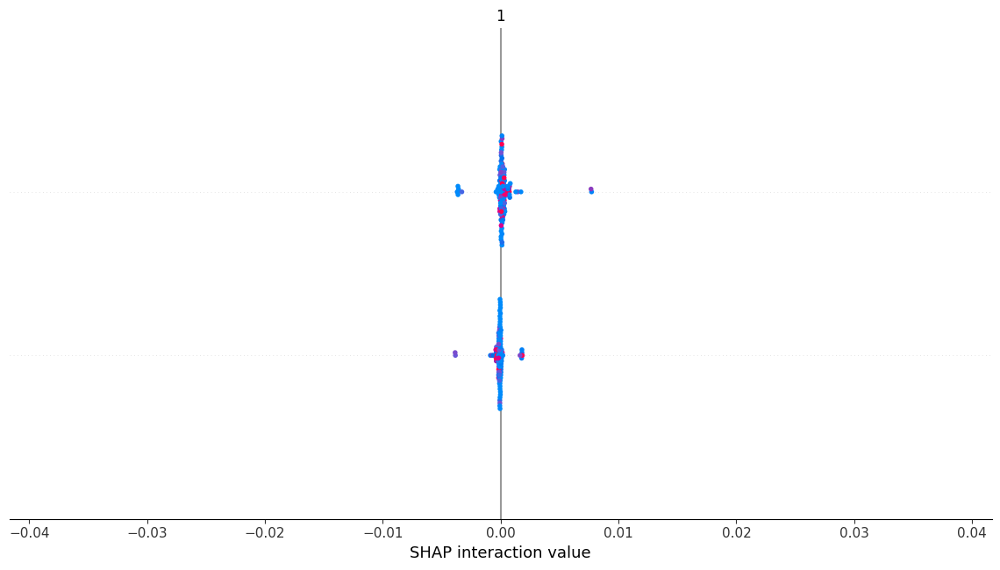

<Figure size 640x480 with 0 Axes>

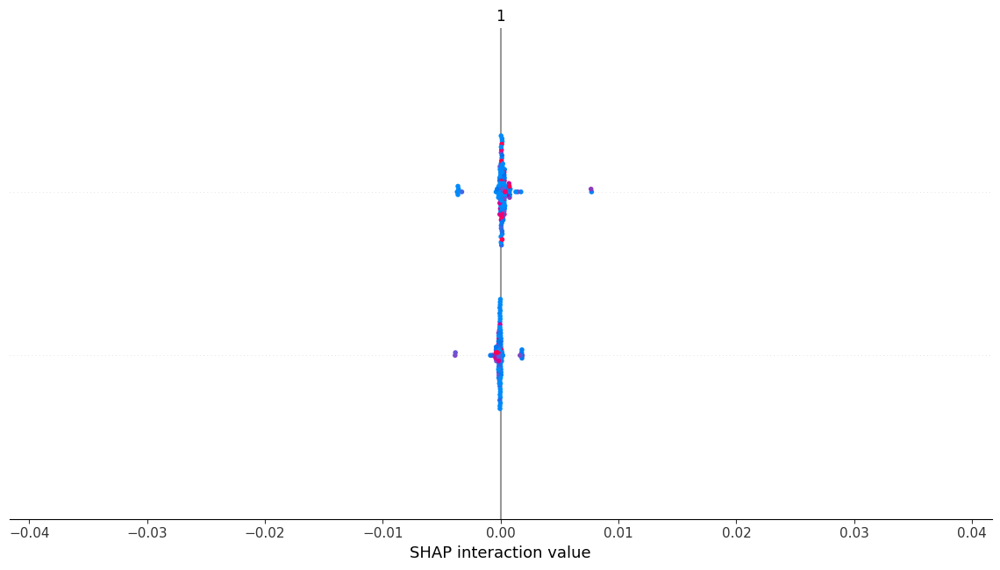

In [71]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# 📥 Load fused features (ResNet + CDR) from correct path
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_fused_features.csv")

# 🔁 Split features and labels
X = df.drop(columns=['Label'])
y = df['Label']

# 🧪 Train/test split (stratified)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.2, random_state=42
)

# 🌲 Train Random Forest (CPU)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 🔍 SHAP TreeExplainer
explainer = shap.TreeExplainer(model)
shap_values_all = explainer.shap_values(X_test)

# 🔑 Handle older vs. newer SHAP output formats
if isinstance(shap_values_all, list) and len(shap_values_all) > 1:
    # We have shap_values for each class, pick the Glaucoma class (1)
    shap_values_class_1 = shap_values_all[1]
else:
    # Single array (common in newer SHAP or for regression-like output)
    shap_values_class_1 = shap_values_all

# ⚠️ Optional: sanity check shapes
assert shap_values_class_1.shape[1] == X_test.shape[1], (
    f"Mismatch: SHAP values have {shap_values_class_1.shape[1]} features, "
    f"but X_test has {X_test.shape[1]} columns!"
)

# 📊 SHAP Summary Plot (Violin)
shap.summary_plot(shap_values_class_1, X_test, plot_type="violin", show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_violin.png")
plt.show()

# 📊 SHAP Summary Plot (Bar)
shap.summary_plot(shap_values_class_1, X_test, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_bar.png")
plt.show()


<Figure size 640x480 with 0 Axes>

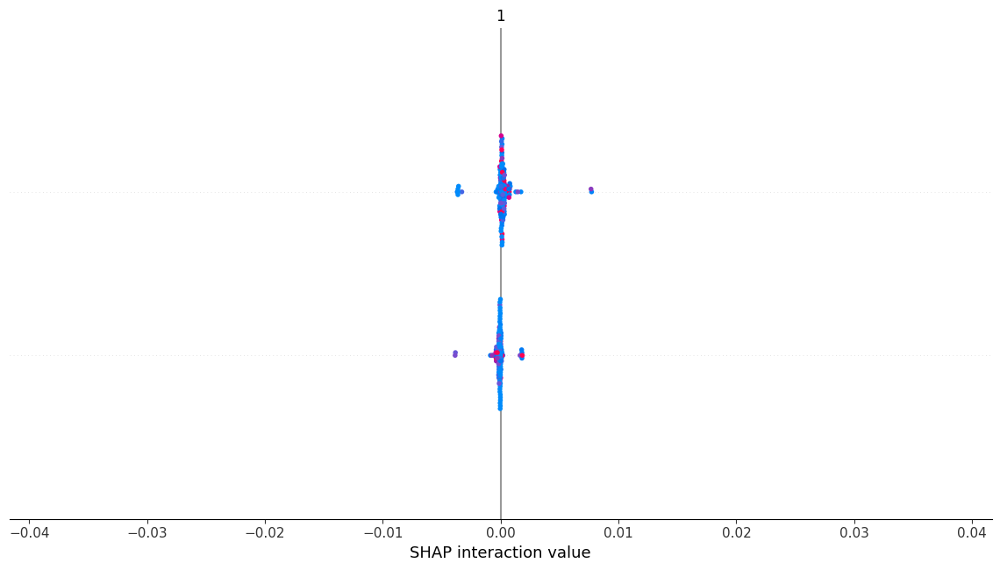

<Figure size 640x480 with 0 Axes>

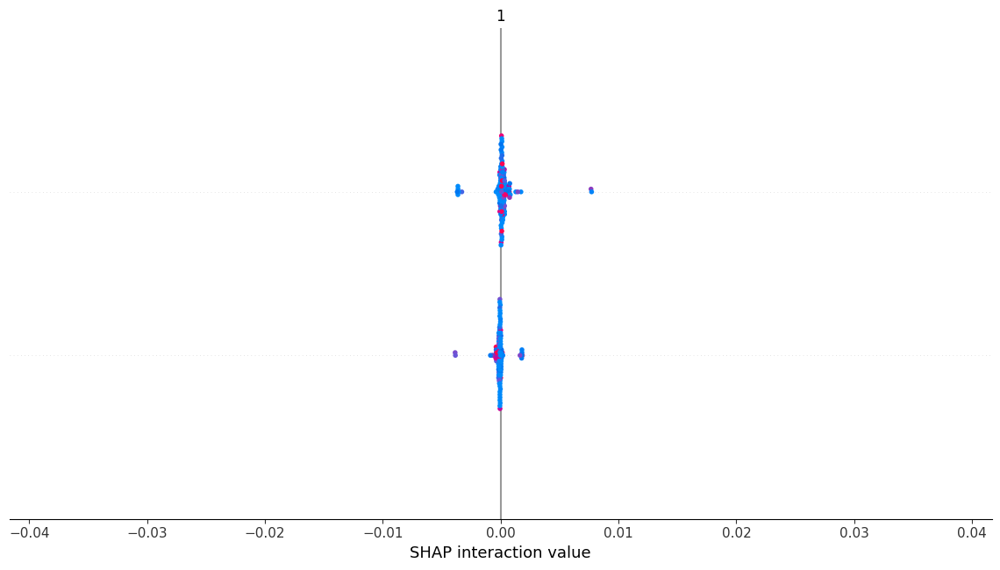

In [72]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# 1) Load fused features (ResNet + CDR)
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_fused_features.csv")

# 2) Split features & labels
X = df.drop(columns=['Label'])
y = df['Label']

# 3) Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 4) Train Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 5) SHAP Explainer
explainer = shap.TreeExplainer(model)
shap_values_all = explainer.shap_values(X_test)

# 6) Handle possible multiple arrays (old SHAP versions) vs. single array
if isinstance(shap_values_all, list) and len(shap_values_all) == 2:
    # pick the array for class '1' (Glaucoma)
    shap_values = shap_values_all[1]
else:
    # single array scenario
    shap_values = shap_values_all

# 7) Plot bar summary (top features)
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_bar.png")
plt.show()

# 8) Plot violin summary
shap.summary_plot(shap_values, X_test, plot_type="violin", show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_violin.png")
plt.show()


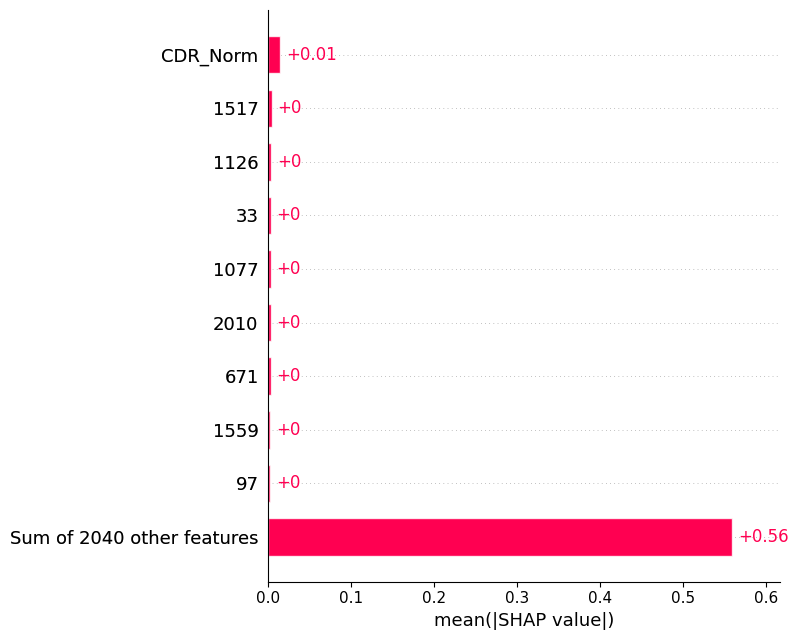

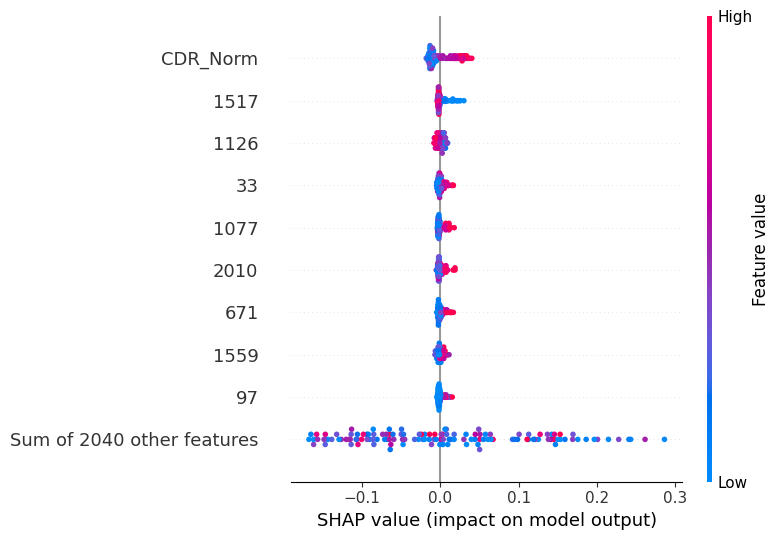

In [74]:
import shap
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# 1) Load fused features (ResNet + CDR)
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_fused_features.csv")

# 2) Separate features & label
X = df.drop(columns=['Label'])
y = df['Label']

# 3) Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 4) Train Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 5) Newer SHAP Explainer
explainer = shap.Explainer(model, X_train)

# 6) Compute SHAP values for the test set
shap_values = explainer(X_test)
# shape might be (n_samples, n_features, 2) for binary classification

# 7) If it's multiclass (binary is still considered multiclass with 2 outputs),
#    we pick the dimension for the "positive" class (class=1).
#    shap_values.values shape is (n_samples, n_features, n_classes).
if len(shap_values.values.shape) == 3 and shap_values.values.shape[2] == 2:
    # pick class 1 along the last dimension
    shap_values.values = shap_values.values[:, :, 1]
    # also adjust base_values to pick class 1
    shap_values.base_values = shap_values.base_values[:, 1]

# 8) Now we have a 2D array (n_samples, n_features). We can plot.

# 📊 Bar summary
shap.plots.bar(shap_values, show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_bar.png")
plt.show()

# 📊 Beeswarm (like violin) summary
shap.plots.beeswarm(shap_values, show=False)
plt.tight_layout()
plt.savefig("origa_rf_shap_beeswarm.png")
plt.show()


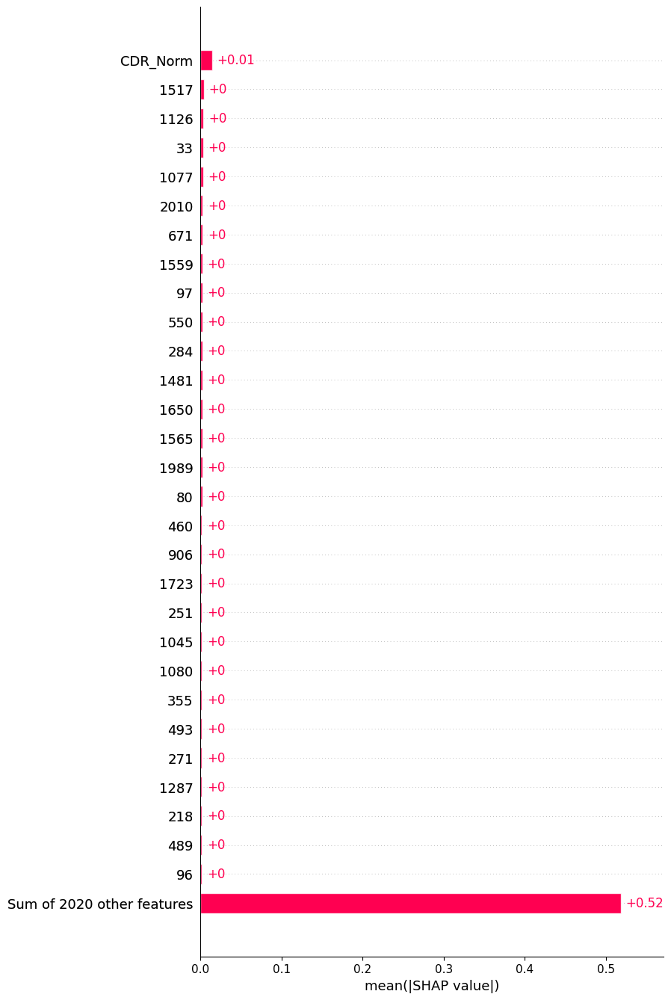

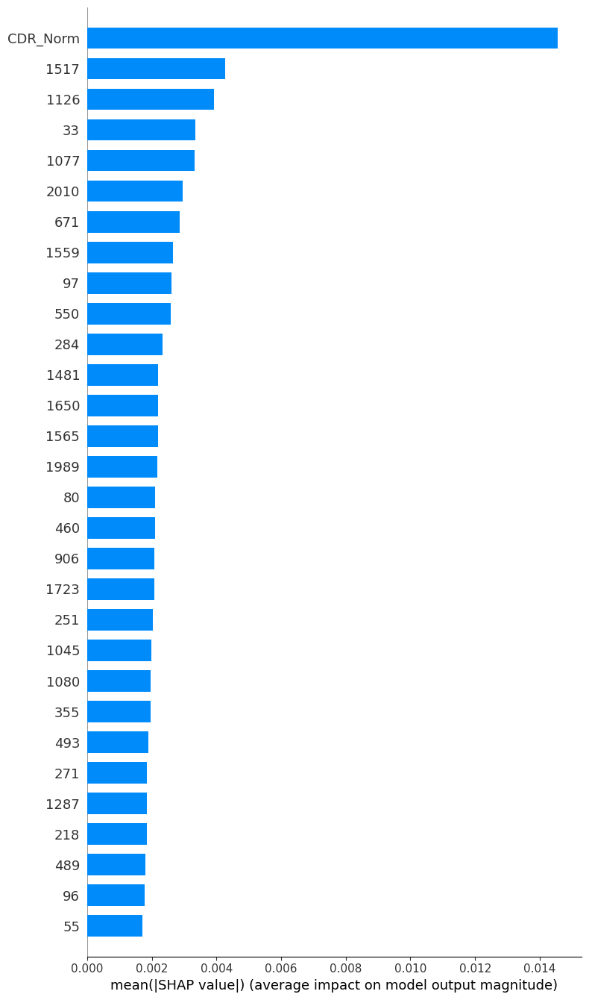

In [75]:
# If you're using shap.plots.bar with the new SHAP API:
shap.plots.bar(shap_values, max_display=30)

# or for the older summary_plot approach:
shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=30)


## ACRIMA

D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [17:07:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Classification Report for ACRIMA:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93        62
           1       0.94      0.96      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.94      0.94       141
weighted avg       0.94      0.94      0.94       141

Confusion Matrix for ACRIMA:
[[57  5]
 [ 3 76]]


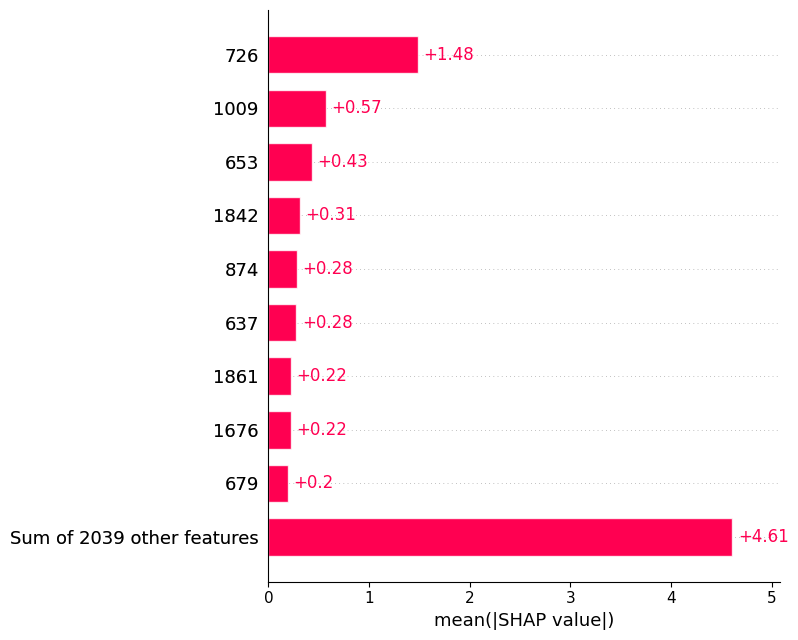

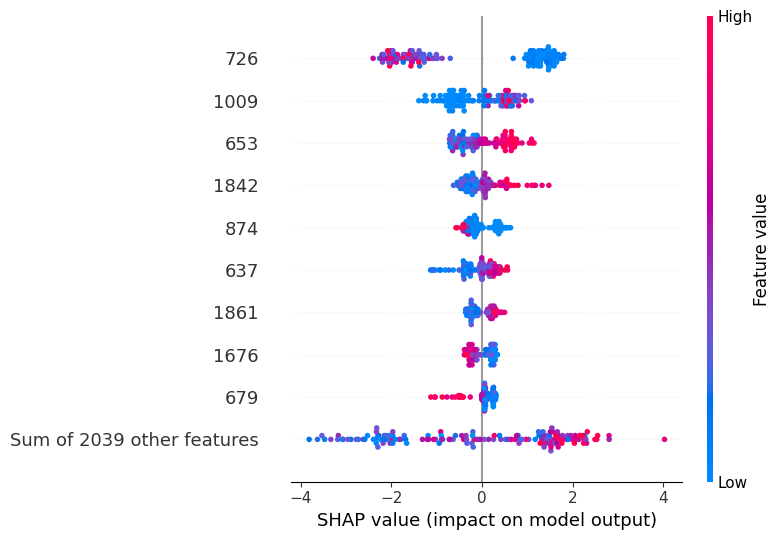

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import shap
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1) Load ACRIMA ResNet features CSV (adjust path if needed)
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")

# 2) Separate features and labels
# (Assuming your CSV includes the deep features columns and a 'Label' column)
X_acrima = df_acrima.drop(columns=['Label'])
y_acrima = df_acrima['Label']

# 3) Train-test split (stratified)
X_train_acrima, X_test_acrima, y_train_acrima, y_test_acrima = train_test_split(
    X_acrima, y_acrima, test_size=0.2, random_state=42, stratify=y_acrima
)

# 4) Train an XGBoost Classifier on ACRIMA
model_acrima = XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
model_acrima.fit(X_train_acrima, y_train_acrima)

# 5) Evaluate the model
y_pred_acrima = model_acrima.predict(X_test_acrima)
print("Classification Report for ACRIMA:")
print(classification_report(y_test_acrima, y_pred_acrima))
print("Confusion Matrix for ACRIMA:")
print(confusion_matrix(y_test_acrima, y_pred_acrima))

# 6) SHAP Analysis for ACRIMA using TreeExplainer
explainer_acrima = shap.Explainer(model_acrima, X_train_acrima)
shap_values_acrima = explainer_acrima(X_test_acrima)

# 7) Plot SHAP summary plot (bar and beeswarm)
shap.plots.bar(shap_values_acrima, show=False)
plt.tight_layout()
plt.savefig("acrima_xgb_shap_bar.png")
plt.show()

shap.plots.beeswarm(shap_values_acrima, show=False)
plt.tight_layout()
plt.savefig("acrima_xgb_shap_beeswarm.png")
plt.show()


In [77]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1) Load ORIGA ResNet-only features
df_origa_resnet = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")

X_origa = df_origa_resnet.drop(columns=['Label'])
y_origa = df_origa_resnet['Label']

# 2) Train/test split (just to see ORIGA performance)
X_train_o, X_val_o, y_train_o, y_val_o = train_test_split(
    X_origa, y_origa, test_size=0.2, stratify=y_origa, random_state=42
)

# 3) Train XGBoost on ORIGA
model_origa = xgb.XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
model_origa.fit(X_train_o, y_train_o)

# 4) Evaluate on ORIGA hold-out
pred_origa = model_origa.predict(X_val_o)
print("ORIGA Validation Report:")
print(classification_report(y_val_o, pred_origa))
print("Confusion Matrix (ORIGA Val):")
print(confusion_matrix(y_val_o, pred_origa))


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [17:13:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


ORIGA Validation Report:
              precision    recall  f1-score   support

           0       0.76      0.93      0.84        96
           1       0.46      0.18      0.26        34

    accuracy                           0.73       130
   macro avg       0.61      0.55      0.55       130
weighted avg       0.68      0.73      0.68       130

Confusion Matrix (ORIGA Val):
[[89  7]
 [28  6]]


In [78]:
# 5) Load ACRIMA ResNet-only features
df_acrima_resnet = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")

X_acrima = df_acrima_resnet.drop(columns=['Label'])
y_acrima = df_acrima_resnet['Label']

# 6) Evaluate the ORIGA model on ACRIMA
pred_acrima = model_origa.predict(X_acrima)
print("\nCross-Dataset: ORIGA-Trained Model on ACRIMA")
print(classification_report(y_acrima, pred_acrima))
print("Confusion Matrix (ACRIMA):")
print(confusion_matrix(y_acrima, pred_acrima))



Cross-Dataset: ORIGA-Trained Model on ACRIMA
              precision    recall  f1-score   support

           0       0.44      0.99      0.61       309
           1       0.60      0.01      0.01       396

    accuracy                           0.44       705
   macro avg       0.52      0.50      0.31       705
weighted avg       0.53      0.44      0.28       705

Confusion Matrix (ACRIMA):
[[307   2]
 [393   3]]


In [79]:
df_drishti_resnet = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")
X_drishti = df_drishti_resnet.drop(columns=['Label'])
y_drishti = df_drishti_resnet['Label']

pred_drishti = model_origa.predict(X_drishti)
print("\nCross-Dataset: ORIGA-Trained Model on Drishti")
print(classification_report(y_drishti, pred_drishti))
print("Confusion Matrix (Drishti):")
print(confusion_matrix(y_drishti, pred_drishti))



Cross-Dataset: ORIGA-Trained Model on Drishti
              precision    recall  f1-score   support

           0       0.28      1.00      0.44        13
           1       1.00      0.13      0.23        38

    accuracy                           0.35        51
   macro avg       0.64      0.57      0.34        51
weighted avg       0.82      0.35      0.29        51

Confusion Matrix (Drishti):
[[13  0]
 [33  5]]


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [17:14:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Drishti Model Report:
              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.89      1.00      0.94         8

    accuracy                           0.91        11
   macro avg       0.94      0.83      0.87        11
weighted avg       0.92      0.91      0.90        11

Confusion Matrix (Drishti):
[[2 1]
 [0 8]]


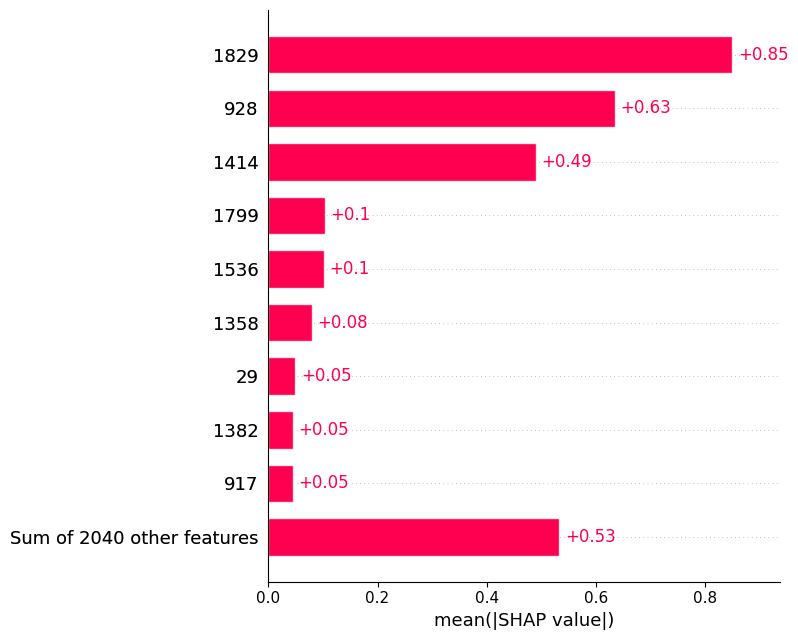

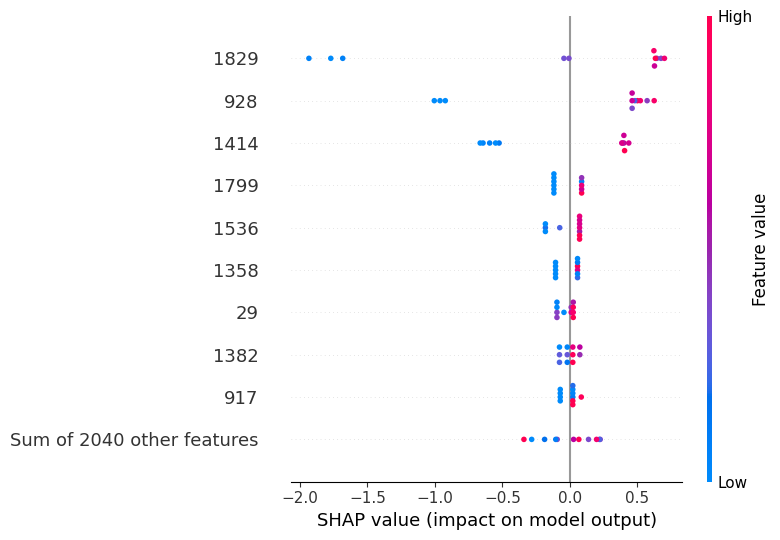

In [80]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import shap
import matplotlib.pyplot as plt

# 1) Load Drishti fused features
df_drishti_fused = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_fused_features.csv")

X_drishti_fused = df_drishti_fused.drop(columns=['Label'])
y_drishti_fused = df_drishti_fused['Label']

# 2) Train/test split
X_train_d, X_test_d, y_train_d, y_test_d = train_test_split(
    X_drishti_fused, y_drishti_fused, test_size=0.2, stratify=y_drishti_fused, random_state=42
)

# 3) XGBoost on Drishti
model_drishti = xgb.XGBClassifier(
    n_estimators=100,
    learning_rate=0.1,
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)
model_drishti.fit(X_train_d, y_train_d)

# 4) Evaluate
pred_drishti = model_drishti.predict(X_test_d)
print("Drishti Model Report:")
print(classification_report(y_test_d, pred_drishti))
print("Confusion Matrix (Drishti):")
print(confusion_matrix(y_test_d, pred_drishti))

# 5) SHAP Explanation
explainer_drishti = shap.Explainer(model_drishti, X_train_d)
shap_values_drishti = explainer_drishti(X_test_d)

# Bar plot
shap.plots.bar(shap_values_drishti, show=False)
plt.tight_layout()
plt.savefig("drishti_xgb_shap_bar.png")
plt.show()

# Beeswarm
shap.plots.beeswarm(shap_values_drishti, show=False)
plt.tight_layout()
plt.savefig("drishti_xgb_shap_beeswarm.png")
plt.show()


In [81]:
import pandas as pd

# Load ResNet-only features from each dataset
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")

# Optional: If any dataset lacks columns or has extra, align them:
common_cols = set(df_origa.columns).intersection(df_acrima.columns).intersection(df_drishti.columns)
df_origa = df_origa[list(common_cols)]
df_acrima = df_acrima[list(common_cols)]
df_drishti = df_drishti[list(common_cols)]

# Merge them (stack rows). 
# Optionally add a 'Domain' column to track which dataset each row came from.
df_origa['Domain'] = 'ORIGA'
df_acrima['Domain'] = 'ACRIMA'
df_drishti['Domain'] = 'DRISHTI'

df_merged = pd.concat([df_origa, df_acrima, df_drishti], axis=0).reset_index(drop=True)

# Save
df_merged.to_csv(r"D:\ProjectML2 - Glaucoma\merged_resnet_features.csv", index=False)
print("✅ Merged dataset shape:", df_merged.shape)


✅ Merged dataset shape: (1406, 2050)


In [82]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

df_merged = pd.read_csv(r"D:\ProjectML2 - Glaucoma\merged_resnet_features.csv")

# Split features and labels
X_merged = df_merged.drop(columns=['Label', 'Domain'])  # domain optional
y_merged = df_merged['Label']

# Train/test split. 
# Or you can do a multi-split approach, e.g., keep Drishti as external test
X_train, X_test, y_train, y_test = train_test_split(X_merged, y_merged, test_size=0.2, stratify=y_merged, random_state=42)

# Train XGBoost
model_merged = xgb.XGBClassifier(n_estimators=200, eval_metric='logloss', random_state=42)
model_merged.fit(X_train, y_train)

# Evaluate on the combined test
pred_test = model_merged.predict(X_test)
print("Combined Test Classification Report:")
print(classification_report(y_test, pred_test))
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred_test))

# Evaluate on each domain separately
for domain_name in ['ORIGA', 'ACRIMA', 'DRISHTI']:
    subset = df_merged[df_merged['Domain'] == domain_name]
    X_sub = subset.drop(columns=['Label', 'Domain'])
    y_sub = subset['Label']
    pred_sub = model_merged.predict(X_sub)
    print(f"\nResults on {domain_name} domain:")
    print(classification_report(y_sub, pred_sub))
    print(confusion_matrix(y_sub, pred_sub))


Combined Test Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.84      0.82       161
           1       0.77      0.70      0.74       121

    accuracy                           0.78       282
   macro avg       0.78      0.77      0.78       282
weighted avg       0.78      0.78      0.78       282

Confusion Matrix:
[[136  25]
 [ 36  85]]

Results on ORIGA domain:
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       482
           1       0.89      0.81      0.85       168

    accuracy                           0.93       650
   macro avg       0.92      0.89      0.90       650
weighted avg       0.93      0.93      0.92       650

[[466  16]
 [ 32 136]]

Results on ACRIMA domain:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       309
           1       0.98      0.99      0.98       396

    accuracy                

In [83]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# Load ACRIMA ResNet features
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
X = df_acrima.drop(columns=['Label'])
y = df_acrima['Label']

# Train/test split (stratified)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# Build a stacking ensemble with RF and XGBoost as base learners and Logistic Regression as meta-learner
base_learners = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, eval_metric='logloss', random_state=42))
]
stack_model = StackingClassifier(
    estimators=base_learners,
    final_estimator=LogisticRegression(max_iter=1000),
    cv=5
)
stack_model.fit(X_train, y_train)

# Evaluate default predictions
pred_default = stack_model.predict(X_test)
print("Stacking Ensemble (Default Threshold) on ACRIMA:")
print(classification_report(y_test, pred_default))
print("Confusion Matrix (Default):")
print(confusion_matrix(y_test, pred_default))

# Custom threshold tuning
probs = stack_model.predict_proba(X_test)[:, 1]
thresholds = np.arange(0.1, 0.9, 0.05)
best_f1, best_thresh = 0, 0.5

for t in thresholds:
    pred_custom = (probs >= t).astype(int)
    f1 = f1_score(y_test, pred_custom)
    if f1 > best_f1:
        best_f1 = f1
        best_thresh = t

print(f"\nBest Threshold: {best_thresh:.2f} with F1: {best_f1:.2f}")
pred_tuned = (probs >= best_thresh).astype(int)
print("Stacking Ensemble (Tuned Threshold) on ACRIMA:")
print(classification_report(y_test, pred_tuned))
print("Confusion Matrix (Tuned):")
print(confusion_matrix(y_test, pred_tuned))


Stacking Ensemble (Default Threshold) on ACRIMA:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93        62
           1       0.94      0.96      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.94      0.94       141
weighted avg       0.94      0.94      0.94       141

Confusion Matrix (Default):
[[57  5]
 [ 3 76]]

Best Threshold: 0.15 with F1: 0.95
Stacking Ensemble (Tuned Threshold) on ACRIMA:
              precision    recall  f1-score   support

           0       0.98      0.89      0.93        62
           1       0.92      0.99      0.95        79

    accuracy                           0.94       141
   macro avg       0.95      0.94      0.94       141
weighted avg       0.95      0.94      0.94       141

Confusion Matrix (Tuned):
[[55  7]
 [ 1 78]]


In [85]:
import matplotlib.pyplot as plt
import numpy as np

# Identify indices of misclassified samples
misclassified_indices = np.where(pred_tuned != y_test)[0]
print("Misclassified sample indices:", misclassified_indices)

# Check if the DataFrame has an 'ImagePath' column
if 'ImagePath' not in df_acrima.columns:
    print("Warning: 'ImagePath' column not found in the ACRIMA DataFrame. Cannot display images.")
else:
    # Display a few misclassified samples (up to 5)
    for idx in misclassified_indices[:5]:
        try:
            image_path = df_acrima.iloc[idx]['ImagePath']
            true_label = df_acrima.iloc[idx]['Label']
            pred_label = pred_tuned[idx]
            image = plt.imread(image_path)
            plt.imshow(image)
            plt.title(f"True: {true_label}, Predicted: {pred_label}")
            plt.axis("off")
            plt.show()
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")


Misclassified sample indices: [ 42  62  63  68  77 101 116 123]


In [87]:
import os
import pandas as pd

# Load the existing ACRIMA metadata CSV
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata.csv")

def build_image_path(row):
    base_dir = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima"
    split = str(row['Split']).strip()  # e.g., 'train' or 'test'
    # Determine the label folder. If Label is numeric, map 1->'Glaucoma', 0->'Non Glaucoma'
    label = row['Label']
    if isinstance(label, (int, float)):
        label_str = "Glaucoma" if label == 1 else "Non Glaucoma"
    else:
        label_str = str(label).strip()
    filename = str(row['Filename']).strip()
    # Construct the full image path:
    path = os.path.join(base_dir, split, label_str, filename)
    return path

# Check if the 'Filename' column exists
if 'Filename' in df.columns:
    df['ImagePath'] = df.apply(build_image_path, axis=1)
    print("Added 'ImagePath' column to the DataFrame.")
else:
    print("Column 'Filename' not found in the CSV. Please verify your metadata.")

# Save the updated CSV
updated_csv_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
df.to_csv(updated_csv_path, index=False)
print(f"Updated CSV saved to: {updated_csv_path}")


Added 'ImagePath' column to the DataFrame.
Updated CSV saved to: D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv


In [88]:
import pandas as pd
import os
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# 1) Load each dataset's ResNet-only features CSV
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")

# 2) Find common columns (assume all include 'Label' and similar deep feature columns)
common_cols = list(set(df_origa.columns).intersection(df_acrima.columns).intersection(df_drishti.columns))
print("Common columns:", common_cols)

# 3) Add a domain identifier to each DataFrame
df_origa['Domain'] = 'ORIGA'
df_acrima['Domain'] = 'ACRIMA'
df_drishti['Domain'] = 'DRISHTI'

# 4) Merge the datasets along rows (stacking them)
df_merged = pd.concat([
    df_origa[common_cols + ['Domain']],
    df_acrima[common_cols + ['Domain']],
    df_drishti[common_cols + ['Domain']]
], ignore_index=True)
print("Merged dataset shape:", df_merged.shape)

# 5) Save merged CSV (optional)
merged_csv_path = r"D:\ProjectML2 - Glaucoma\merged_resnet_features.csv"
df_merged.to_csv(merged_csv_path, index=False)
print(f"Merged CSV saved to: {merged_csv_path}")

# 6) Prepare features and labels for training (exclude 'Domain')
X_merged = df_merged.drop(columns=['Label', 'Domain'])
y_merged = df_merged['Label']

# 7) Train/test split on merged data (stratified)
X_train, X_test, y_train, y_test = train_test_split(
    X_merged, y_merged, test_size=0.2, stratify=y_merged, random_state=42
)

# 8) Train XGBoost classifier on the merged data
model_merged = xgb.XGBClassifier(n_estimators=200, eval_metric='logloss', random_state=42)
model_merged.fit(X_train, y_train)

# 9) Evaluate overall merged test performance
pred_merged = model_merged.predict(X_test)
print("Overall Merged Test Classification Report:")
print(classification_report(y_test, pred_merged))
print("Overall Confusion Matrix:")
print(confusion_matrix(y_test, pred_merged))

# 10) Evaluate performance on each domain separately
for domain in ['ORIGA', 'ACRIMA', 'DRISHTI']:
    subset = df_merged[df_merged['Domain'] == domain]
    X_subset = subset.drop(columns=['Label', 'Domain'])
    y_subset = subset['Label']
    pred_subset = model_merged.predict(X_subset)
    print(f"\nResults on {domain} domain:")
    print(classification_report(y_subset, pred_subset))
    print("Confusion Matrix:")
    print(confusion_matrix(y_subset, pred_subset))


Common columns: ['1693', '278', '1036', '1627', '1341', '1989', '532', '1824', '1481', '1649', '1738', '1420', '262', '721', '1105', '266', '403', '757', '1126', '1708', '115', '204', '1806', '663', '1821', '1119', '139', '1618', '423', '853', '730', '1134', '539', '1411', '1857', '269', '195', '389', '1521', '1797', '806', '550', '700', '378', '498', '734', '1349', '321', '91', '1387', '930', '1185', '1915', '1847', '472', '713', '486', '1465', '1171', '945', '1099', '1219', '764', '651', '1303', '482', '368', '1346', '248', '1582', '1090', '557', '553', '1076', '628', '300', '1815', '619', '1653', '827', '21', '1155', '563', '833', '1872', '656', '940', '2045', '1489', '1869', '893', '1379', '1256', '318', '1233', '274', '1701', '1288', '813', '1277', '1737', '182', '118', '315', '1512', '857', '1794', '811', '1399', '1605', '1953', '353', '1344', '597', '962', '1509', '80', '2007', '1840', '1017', '1178', '1333', '1831', '866', '4', '328', '1672', '1364', '1419', '1291', '1711', '91

In [89]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# Load ACRIMA ResNet features (pure image-based features)
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
X = df_acrima.drop(columns=['Label'])
y = df_acrima['Label']

# Train/test split (stratified)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Build stacking ensemble with RF and XGBoost base learners and LogisticRegression as meta-learner
base_learners = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, eval_metric='logloss', random_state=42))
]
stack_model = StackingClassifier(estimators=base_learners,
                                 final_estimator=LogisticRegression(max_iter=1000),
                                 cv=5)
stack_model.fit(X_train, y_train)

# Evaluate default predictions
pred_default = stack_model.predict(X_test)
print("Stacking Ensemble (Default Threshold) on ACRIMA:")
print(classification_report(y_test, pred_default))
print("Confusion Matrix (Default):")
print(confusion_matrix(y_test, pred_default))

# Threshold tuning on predicted probabilities for class 1
probs = stack_model.predict_proba(X_test)[:, 1]
thresholds = np.arange(0.1, 0.9, 0.05)
best_f1, best_thresh = 0, 0.5

for t in thresholds:
    pred_custom = (probs >= t).astype(int)
    current_f1 = f1_score(y_test, pred_custom)
    if current_f1 > best_f1:
        best_f1 = current_f1
        best_thresh = t

print(f"\nBest Threshold: {best_thresh:.2f} with F1: {best_f1:.2f}")
pred_tuned = (probs >= best_thresh).astype(int)
print("Stacking Ensemble (Tuned Threshold) on ACRIMA:")
print(classification_report(y_test, pred_tuned))
print("Confusion Matrix (Tuned):")
print(confusion_matrix(y_test, pred_tuned))


Stacking Ensemble (Default Threshold) on ACRIMA:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93        62
           1       0.94      0.96      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.94      0.94       141
weighted avg       0.94      0.94      0.94       141

Confusion Matrix (Default):
[[57  5]
 [ 3 76]]

Best Threshold: 0.15 with F1: 0.95
Stacking Ensemble (Tuned Threshold) on ACRIMA:
              precision    recall  f1-score   support

           0       0.98      0.89      0.93        62
           1       0.92      0.99      0.95        79

    accuracy                           0.94       141
   macro avg       0.95      0.94      0.94       141
weighted avg       0.95      0.94      0.94       141

Confusion Matrix (Tuned):
[[55  7]
 [ 1 78]]


Misclassified sample indices: [ 42  62  63  68  77 101 116 123]


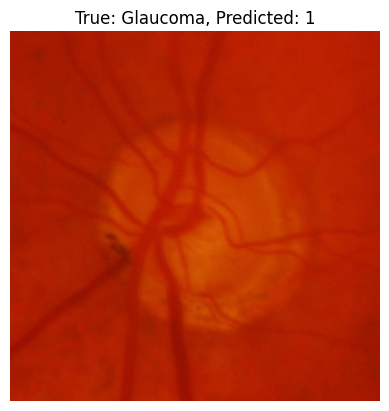

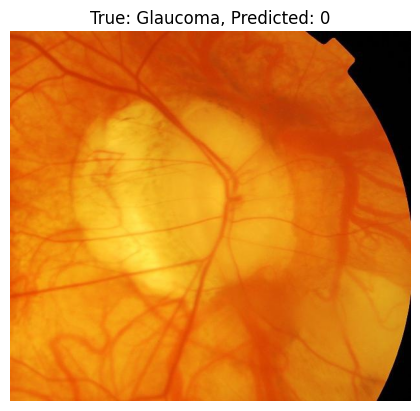

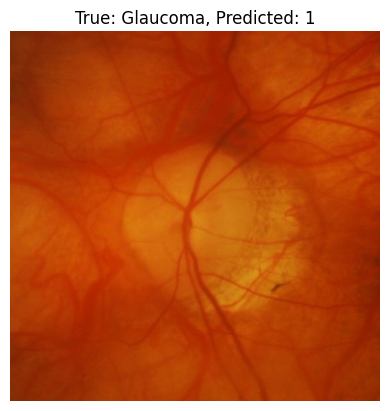

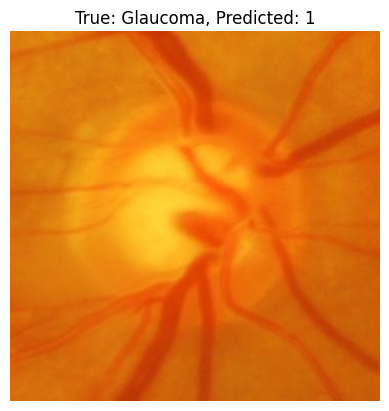

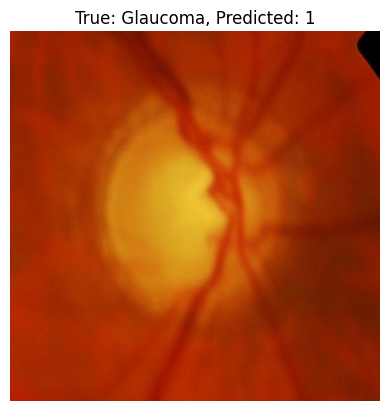

In [90]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load the updated ACRIMA metadata CSV
df_acrima_updated = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv")

# Identify misclassified sample indices (from the tuned predictions above)
misclassified_indices = np.where(pred_tuned != y_test)[0]
print("Misclassified sample indices:", misclassified_indices)

# Display up to 5 misclassified samples
for idx in misclassified_indices[:5]:
    try:
        image_path = df_acrima_updated.iloc[idx]['ImagePath']
        true_label = df_acrima_updated.iloc[idx]['Label']
        predicted_label = pred_tuned[idx]
        image = plt.imread(image_path)
        plt.imshow(image)
        plt.title(f"True: {true_label}, Predicted: {predicted_label}")
        plt.axis("off")
        plt.show()
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")


In [91]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix

# Load ORIGA ResNet features
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
X_origa = df_origa.drop(columns=['Label'])
y_origa = df_origa['Label']

# Apply PCA to reduce to 50 dimensions
pca = PCA(n_components=50, random_state=42)
X_origa_pca = pca.fit_transform(X_origa)

# Train/test split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(
    X_origa_pca, y_origa, test_size=0.2, stratify=y_origa, random_state=42
)

# Train XGBoost on PCA features
model_pca = xgb.XGBClassifier(n_estimators=100, eval_metric='logloss', random_state=42)
model_pca.fit(X_train_pca, y_train)

pred_pca = model_pca.predict(X_test_pca)
print("ORIGA (PCA) XGBoost Classification Report:")
print(classification_report(y_test, pred_pca))
print("Confusion Matrix (ORIGA PCA):")
print(confusion_matrix(y_test, pred_pca))


ORIGA (PCA) XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.92      0.83        96
           1       0.47      0.21      0.29        34

    accuracy                           0.73       130
   macro avg       0.62      0.56      0.56       130
weighted avg       0.69      0.73      0.69       130

Confusion Matrix (ORIGA PCA):
[[88  8]
 [27  7]]


In [92]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

# Load ACRIMA ResNet features
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
X_acrima = df_acrima.drop(columns=['Label'])
y_acrima = df_acrima['Label']

# Split ACRIMA data: a small subset for fine-tuning
X_acrima_fine, X_acrima_hold, y_acrima_fine, y_acrima_hold = train_test_split(
    X_acrima, y_acrima, test_size=0.8, stratify=y_acrima, random_state=42
)

# Assume model_origa (XGBoost) was trained on ORIGA resnet features
# For demonstration, train an ORIGA model first:
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
X_origa = df_origa.drop(columns=['Label'])
y_origa = df_origa['Label']
model_origa = xgb.XGBClassifier(n_estimators=100, eval_metric='logloss', random_state=42)
model_origa.fit(X_origa, y_origa)

# Fine-tune on ACRIMA (using a small subset)
# We continue training using the booster from model_origa
model_finetune = xgb.XGBClassifier(n_estimators=50, eval_metric='logloss', random_state=42)
model_finetune.fit(X_acrima_fine, y_acrima_fine, xgb_model=model_origa.get_booster())

# Evaluate the fine-tuned model on the hold-out ACRIMA set
pred_finetune = model_finetune.predict(X_acrima_hold)
print("Fine-Tuned Model on ACRIMA Data:")
print(classification_report(y_acrima_hold, pred_finetune))
print("Confusion Matrix (Fine-Tuned ACRIMA):")
print(confusion_matrix(y_acrima_hold, pred_finetune))


Fine-Tuned Model on ACRIMA Data:
              precision    recall  f1-score   support

           0       0.85      0.84      0.84       247
           1       0.88      0.88      0.88       317

    accuracy                           0.86       564
   macro avg       0.86      0.86      0.86       564
weighted avg       0.86      0.86      0.86       564

Confusion Matrix (Fine-Tuned ACRIMA):
[[207  40]
 [ 37 280]]


In [94]:
import numpy as np

def coral_align(Xs, Xt):
    """
    Aligns the distribution of Xs to match Xt using CORAL.
    Xs: [n_samples_source, n_features]
    Xt: [n_samples_target, n_features]
    
    Returns: Xs_aligned with distribution more similar to Xt
    """
    # 1) Compute covariance of source, target
    cov_src = np.cov(Xs, rowvar=False) + np.eye(Xs.shape[1])
    cov_tar = np.cov(Xt, rowvar=False) + np.eye(Xt.shape[1])
    
    # 2) Whitening source features
    U_src, S_src, _ = np.linalg.svd(cov_src)
    S_src_inv = np.diag(1.0 / np.sqrt(S_src))
    cov_src_whitening = (U_src).dot(S_src_inv).dot(U_src.T)
    Xs_whitened = (Xs - Xs.mean(0)).dot(cov_src_whitening)
    
    # 3) Re-coloring to match target covariance
    U_tar, S_tar, _ = np.linalg.svd(cov_tar)
    S_tar_sqrt = np.diag(np.sqrt(S_tar))
    cov_tar_coloring = U_tar.dot(S_tar_sqrt).dot(U_tar.T)
    Xs_aligned = Xs_whitened.dot(cov_tar_coloring) + Xt.mean(0)
    
    return Xs_aligned


In [95]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from xgboost import XGBClassifier

# 1) Load source (ORIGA) and target (ACRIMA) feature sets
df_origa = pd.read_csv("origa_resnet_features.csv")
df_acrima = pd.read_csv("acrima_resnet_features.csv")

Xs = df_origa.drop(columns=['Label']).values
ys = df_origa['Label'].values

Xt = df_acrima.drop(columns=['Label']).values
yt = df_acrima['Label'].values

# 2) Split your target domain into a small train/test for alignment & evaluation
Xt_train, Xt_test, yt_train, yt_test = train_test_split(Xt, yt, test_size=0.5, stratify=yt, random_state=42)

# 3) Align the ORIGA (source) features to the distribution of ACRIMA (target)
Xs_aligned = coral_align(Xs, Xt_train)

# 4) Train model on aligned source => Xs_aligned
model_coral = XGBClassifier(eval_metric='logloss', random_state=42)
model_coral.fit(Xs_aligned, ys)

# 5) Evaluate on actual ACRIMA test set (Xt_test)
pred_coral = model_coral.predict(Xt_test)
print("CORAL-Aligned (ORIGA->ACRIMA) Results:")
print(classification_report(yt_test, pred_coral))
print(confusion_matrix(yt_test, pred_coral))


CORAL-Aligned (ORIGA->ACRIMA) Results:
              precision    recall  f1-score   support

           0       0.44      1.00      0.62       155
           1       1.00      0.02      0.04       198

    accuracy                           0.45       353
   macro avg       0.72      0.51      0.33       353
weighted avg       0.76      0.45      0.29       353

[[155   0]
 [194   4]]


ORIGA Feature Shape: (650, 2048)
ACRIMA Feature Shape: (705, 2048)


In [97]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Load Source (ORIGA)
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
Xs_full = df_origa.drop(columns=["Label"]).values
ys_full = df_origa["Label"].values

# Load Target (ACRIMA)
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
Xt_full = df_acrima.drop(columns=["Label"]).values
yt_full = df_acrima["Label"].values

# Split ACRIMA into a train subset (for alignment + partial training) and test subset
Xt_train, Xt_test, yt_train, yt_test = train_test_split(
    Xt_full, yt_full, test_size=0.5, stratify=yt_full, random_state=42
)

print("Xs_full shape:", Xs_full.shape, "ys_full shape:", ys_full.shape)
print("Xt_train shape:", Xt_train.shape, "yt_train shape:", yt_train.shape)
print("Xt_test shape:", Xt_test.shape, "yt_test shape:", yt_test.shape)


Xs_full shape: (650, 2048) ys_full shape: (650,)
Xt_train shape: (352, 2048) yt_train shape: (352,)
Xt_test shape: (353, 2048) yt_test shape: (353,)


In [98]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA

# Number of principal components (tune as needed)
pca_dim = 256  
pca = PCA(n_components=pca_dim, random_state=42)

# 1) Fit PCA on the entire ORIGA dataset
Xs_pca = pca.fit_transform(Xs_full)  # shape: [650, 256]

# 2) Transform the ACRIMA train/test subsets with the same PCA
Xt_train_pca = pca.transform(Xt_train)  # shape: [352, 256]
Xt_test_pca = pca.transform(Xt_test)    # shape: [353, 256]

print("Xs_pca shape:", Xs_pca.shape)
print("Xt_train_pca shape:", Xt_train_pca.shape)
print("Xt_test_pca shape:", Xt_test_pca.shape)


Xs_pca shape: (650, 256)
Xt_train_pca shape: (352, 256)
Xt_test_pca shape: (353, 256)


In [99]:
import numpy as np

def coral_align(Xs, Xt):
    """
    Aligns the distribution of Xs to match Xt using CORAL 
    (after both have been dimension-reduced via PCA).
    
    Xs: [n_samples_source, dim]  (ORIGA)
    Xt: [n_samples_target, dim]  (ACRIMA train subset)
    
    Returns: Xs_aligned of same shape as Xs
    """
    # Add identity to avoid numeric issues
    cov_src = np.cov(Xs, rowvar=False) + np.eye(Xs.shape[1])
    cov_tar = np.cov(Xt, rowvar=False) + np.eye(Xt.shape[1])

    # SVD on source covariance
    U_src, S_src, _ = np.linalg.svd(cov_src)
    S_src_inv = np.diag(1.0 / np.sqrt(S_src))
    cov_src_whitening = U_src @ S_src_inv @ U_src.T

    # Whiten source
    Xs_whitened = (Xs - Xs.mean(axis=0)) @ cov_src_whitening

    # SVD on target covariance
    U_tar, S_tar, _ = np.linalg.svd(cov_tar)
    S_tar_sqrt = np.diag(np.sqrt(S_tar))
    cov_tar_coloring = U_tar @ S_tar_sqrt @ U_tar.T

    # Re-color to match target + shift to target mean
    Xs_aligned = Xs_whitened @ cov_tar_coloring + Xt.mean(axis=0)
    return Xs_aligned

# Align the source (ORIGA) PCA features to the distribution of ACRIMA train (Xt_train_pca)
Xs_coral = coral_align(Xs_pca, Xt_train_pca)
print("Xs_coral shape:", Xs_coral.shape)


Xs_coral shape: (650, 256)


In [100]:
import numpy as np

# Combine aligned source data (Xs_coral) and target training data (Xt_train_pca)
X_train_combined = np.vstack([Xs_coral, Xt_train_pca])
y_train_combined = np.concatenate([ys_full, yt_train])

print("X_train_combined shape:", X_train_combined.shape)
print("y_train_combined shape:", y_train_combined.shape)


X_train_combined shape: (1002, 256)
y_train_combined shape: (1002,)


In [101]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# 1) Train the model on combined data
model_coral = xgb.XGBClassifier(
    n_estimators=200,
    eval_metric='logloss',
    random_state=42
)
model_coral.fit(X_train_combined, y_train_combined)

# 2) Evaluate on target test set (Xt_test_pca) + y_test
#    This set is also in PCA space (256 dims)
pred_coral = model_coral.predict(Xt_test_pca)

print("CORAL + PCA + Combined Training Results on ACRIMA test:")
print(classification_report(yt_test, pred_coral))
print("Confusion Matrix:")
print(confusion_matrix(yt_test, pred_coral))

# (Optional) Probability-based threshold tuning
y_probs = model_coral.predict_proba(Xt_test_pca)[:, 1]
best_thresh = 0.5
best_f1 = 0
for t in [x/100 for x in range(5, 95, 5)]:  # e.g. from 0.05 to 0.9 in steps of 0.05
    preds_custom = (y_probs >= t).astype(int)
    f1 = f1_score(yt_test, preds_custom)
    if f1 > best_f1:
        best_f1 = f1
        best_thresh = t

print(f"\nBest threshold found: {best_thresh}, F1: {best_f1:.3f}")
pred_tuned = (y_probs >= best_thresh).astype(int)
print("Confusion Matrix (tuned):")
print(confusion_matrix(yt_test, pred_tuned))


CORAL + PCA + Combined Training Results on ACRIMA test:
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       155
           1       0.88      0.85      0.87       198

    accuracy                           0.85       353
   macro avg       0.85      0.85      0.85       353
weighted avg       0.85      0.85      0.85       353

Confusion Matrix:
[[133  22]
 [ 30 168]]

Best threshold found: 0.1, F1: 0.898
Confusion Matrix (tuned):
[[116  39]
 [  5 193]]


In [102]:
import numpy as np
import pandas as pd
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix, f1_score

# --- We'll assume you already have X_train_combined (aligned + PCA) and y_train_combined
# from the prior steps, and you also have Xt_test_pca, yt_test. ---

print("Before SMOTE:")
unique, counts = np.unique(y_train_combined, return_counts=True)
print(dict(zip(unique, counts)))  # e.g. {0: 500, 1: 502}

# 1) Apply SMOTE to oversample minority class
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_combined, y_train_combined)

print("After SMOTE:")
unique, counts = np.unique(y_train_smote, return_counts=True)
print(dict(zip(unique, counts)))

# 2) Train XGBoost on oversampled data
model_smote = xgb.XGBClassifier(
    n_estimators=200,
    eval_metric='logloss',
    random_state=42
)
model_smote.fit(X_train_smote, y_train_smote)

# 3) Evaluate on ACRIMA test (Xt_test_pca)
pred_smote = model_smote.predict(Xt_test_pca)
print("\nSMOTE-based Model on ACRIMA Test:")
print(classification_report(yt_test, pred_smote))
print(confusion_matrix(yt_test, pred_smote))

# 4) Optional: Threshold tuning
y_probs_smote = model_smote.predict_proba(Xt_test_pca)[:, 1]
best_thresh, best_f1 = 0.5, 0
for t in np.arange(0.05, 1.0, 0.05):
    preds_custom = (y_probs_smote >= t).astype(int)
    f1 = f1_score(yt_test, preds_custom)
    if f1 > best_f1:
        best_f1 = f1
        best_thresh = t

print(f"\nBest threshold found: {best_thresh}, F1: {best_f1:.3f}")
pred_tuned_smote = (y_probs_smote >= best_thresh).astype(int)
print("Confusion Matrix (tuned):")
print(confusion_matrix(yt_test, pred_tuned_smote))


Before SMOTE:
{np.int64(0): np.int64(636), np.int64(1): np.int64(366)}
After SMOTE:
{np.int64(0): np.int64(636), np.int64(1): np.int64(636)}

SMOTE-based Model on ACRIMA Test:
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       155
           1       0.93      0.90      0.92       198

    accuracy                           0.91       353
   macro avg       0.90      0.91      0.91       353
weighted avg       0.91      0.91      0.91       353

[[142  13]
 [ 20 178]]

Best threshold found: 0.4, F1: 0.917
Confusion Matrix (tuned):
[[138  17]
 [ 16 182]]


In [103]:
import numpy as np

alpha = 0.5
Xs_partial = (1 - alpha) * Xs_pca + alpha * Xs_coral

# Combine aligned partial with real target
X_train_partial = np.vstack([Xs_partial, Xt_train_pca])
y_train_partial = np.concatenate([ys_full, yt_train])

# (Optional) SMOTE
# from imblearn.over_sampling import SMOTE
# sm = SMOTE(random_state=42)
# X_train_partial, y_train_partial = sm.fit_resample(X_train_partial, y_train_partial)

# Train model
model_partial = xgb.XGBClassifier(n_estimators=200, eval_metric='logloss', random_state=42)
model_partial.fit(X_train_partial, y_train_partial)

# Evaluate
pred_partial = model_partial.predict(Xt_test_pca)
print("Partial CORAL Mixing Results (Alpha =", alpha, ")")
print(classification_report(yt_test, pred_partial))

# (Optional) threshold tuning...


Partial CORAL Mixing Results (Alpha = 0.5 )
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       155
           1       0.92      0.93      0.93       198

    accuracy                           0.92       353
   macro avg       0.91      0.91      0.91       353
weighted avg       0.91      0.92      0.91       353



In [104]:
# 1) Load Drishti
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")
X_drishti = df_drishti.drop(columns=['Label']).values
y_drishti = df_drishti['Label'].values

# 2) Transform with the same PCA used for ORIGA
X_drishti_pca = pca.transform(X_drishti)  # same PCA object

# 3) Evaluate your partial CORAL + SMOTE model
pred_drishti = model_partial.predict(X_drishti_pca)  # or model_smote, etc.
print("Cross-Dataset (Drishti) Results:")
print(classification_report(y_drishti, pred_drishti))


Cross-Dataset (Drishti) Results:
              precision    recall  f1-score   support

           0       0.30      0.23      0.26        13
           1       0.76      0.82      0.78        38

    accuracy                           0.67        51
   macro avg       0.53      0.52      0.52        51
weighted avg       0.64      0.67      0.65        51



In [105]:
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split

# Suppose model_partial is your trained partial CORAL model
# We'll fine-tune it on a portion of Drishti

# 1) Load Drishti
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")
X_drishti = df_drishti.drop(columns=['Label']).values
y_drishti = df_drishti['Label'].values

# 2) Apply the same PCA transform
X_drishti_pca = pca.transform(X_drishti)  # the same PCA fitted on ORIGA

# 3) Split Drishti into small fine-tune set + final test
X_d_train, X_d_test, y_d_train, y_d_test = train_test_split(
    X_drishti_pca, y_drishti, test_size=0.5, stratify=y_drishti, random_state=42
)

# 4) Partial Fine-Tune
model_finetune = xgb.XGBClassifier(n_estimators=50, eval_metric='logloss', random_state=42)

# Use the booster from model_partial
model_finetune.fit(X_d_train, y_d_train, xgb_model=model_partial.get_booster())

# 5) Evaluate on Drishti hold-out
pred_dr = model_finetune.predict(X_d_test)
print("Fine-Tuned Drishti Performance:")
print(classification_report(y_d_test, pred_dr))


Fine-Tuned Drishti Performance:
              precision    recall  f1-score   support

           0       0.80      0.57      0.67         7
           1       0.86      0.95      0.90        19

    accuracy                           0.85        26
   macro avg       0.83      0.76      0.78        26
weighted avg       0.84      0.85      0.84        26



In [106]:
import pandas as pd
import numpy as np

# Load ORIGA
df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
df_origa['Domain'] = 'ORIGA'

# Load ACRIMA
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
df_acrima['Domain'] = 'ACRIMA'

# Load Drishti
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")
df_drishti['Domain'] = 'DRISHTI'


In [107]:
# Find common feature columns across all three
common_cols = list(set(df_origa.columns) & set(df_acrima.columns) & set(df_drishti.columns))

# Typically includes [0..2047, 'Label'] plus now 'Domain'
df_origa = df_origa[common_cols + ['Domain']]
df_acrima = df_acrima[common_cols + ['Domain']]
df_drishti = df_drishti[common_cols + ['Domain']]

# Merge (stack rows)
df_merged = pd.concat([df_origa, df_acrima, df_drishti], ignore_index=True)
print("Merged shape:", df_merged.shape)


Merged shape: (1406, 2051)


In [108]:
from sklearn.decomposition import PCA

# Separate features & label/domain
X_all = df_merged.drop(columns=['Label','Domain']).values
y_all = df_merged['Label'].values
domain_all = df_merged['Domain'].values  # For domain-based splits/eval

# PCA
pca_dim = 256
pca = PCA(n_components=pca_dim, random_state=42)
X_pca_all = pca.fit_transform(X_all)

print("PCA-applied shape:", X_pca_all.shape)  # (total_samples, 256)


PCA-applied shape: (1406, 256)


In [113]:
print("df_origa columns:", df_origa.columns)
print("df_acrima columns:", df_acrima.columns)
print("df_drishti columns:", df_drishti.columns)

df_origa columns: Index(['1693', '278', '1036', '1627', '1341', '1989', '532', '1824', '1481',
       '1649',
       ...
       '189', '1383', '843', '1070', '1633', '860', '363', '54', '294',
       'Domain'],
      dtype='object', length=2051)
df_acrima columns: Index(['1693', '278', '1036', '1627', '1341', '1989', '532', '1824', '1481',
       '1649',
       ...
       '189', '1383', '843', '1070', '1633', '860', '363', '54', '294',
       'Domain'],
      dtype='object', length=2051)
df_drishti columns: Index(['1693', '278', '1036', '1627', '1341', '1989', '532', '1824', '1481',
       '1649',
       ...
       '189', '1383', '843', '1070', '1633', '860', '363', '54', '294',
       'Domain'],
      dtype='object', length=2051)


In [115]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import xgboost as xgb

########################################
# 1. Load & Merge ORIGA, ACRIMA, DRISHTI
########################################

df_origa = pd.read_csv(r"D:\ProjectML2 - Glaucoma\origa_resnet_features.csv")
df_acrima = pd.read_csv(r"D:\ProjectML2 - Glaucoma\acrima_resnet_features.csv")
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")

# Explicitly overwrite 'Domain' column and remove duplicates
if 'Domain' in df_origa.columns:
    df_origa = df_origa.drop(columns='Domain')  # Drop existing 'Domain'
df_origa['Domain'] = 'ORIGA'  # Add new 'Domain'

if 'Domain' in df_acrima.columns:
    df_acrima = df_acrima.drop(columns='Domain')
df_acrima['Domain'] = 'ACRIMA'

if 'Domain' in df_drishti.columns:
    df_drishti = df_drishti.drop(columns='Domain')
df_drishti['Domain'] = 'DRISHTI'

# Remove any duplicate columns (just in case)
df_origa = df_origa.loc[:, ~df_origa.columns.duplicated()]
df_acrima = df_acrima.loc[:, ~df_acrima.columns.duplicated()]
df_drishti = df_drishti.loc[:, ~df_drishti.columns.duplicated()]

# Find common feature columns: e.g., '0','1',...'2047','Label'
common_cols = list(
    set(df_origa.columns) &
    set(df_acrima.columns) &
    set(df_drishti.columns)
)

# Ensure 'Label' is included, exclude 'Domain' from common_cols
common_cols = [col for col in common_cols if col != 'Domain']
if 'Label' not in common_cols:
    common_cols.append('Label')

# Select only the common features + 'Domain'
df_origa = df_origa[common_cols + ['Domain']]
df_acrima = df_acrima[common_cols + ['Domain']]
df_drishti = df_drishti[common_cols + ['Domain']]

# Concatenate them into a single DataFrame
df_merged = pd.concat([df_origa, df_acrima, df_drishti], ignore_index=True)
print("Merged shape:", df_merged.shape)  # Should be (1406, 2050)

# Verify 'Domain' is a Series
print("df_merged['Domain'] shape:", df_merged['Domain'].shape)  # Should be (1406,)
print("df_merged['Domain'] head:\n", df_merged['Domain'].head())

###################################################
# 2. Separate Features, Label, Domain & Apply PCA
###################################################

# Extract labels (1D) and domain (1D) as arrays
y_all = df_merged['Label'].values          # shape (1406,)
domain_all = df_merged['Domain'].values    # shape (1406,)

# Drop Label & Domain to get numeric features
X_all = df_merged.drop(columns=['Label', 'Domain']).values  # shape (1406, 2048)

# Confirm shapes
print("X_all shape:", X_all.shape)         # (1406, 2048)
print("y_all shape:", y_all.shape)         # (1406,)
print("domain_all shape:", domain_all.shape)  # (1406,)

# Apply PCA to unify all data into a smaller latent space
pca_dim = 256
pca = PCA(n_components=pca_dim, random_state=42)
X_pca_all = pca.fit_transform(X_all)       # shape: (1406, 256)

print("X_pca_all shape:", X_pca_all.shape)

Merged shape: (1406, 2050)
df_merged['Domain'] shape: (1406,)
df_merged['Domain'] head:
 0    ORIGA
1    ORIGA
2    ORIGA
3    ORIGA
4    ORIGA
Name: Domain, dtype: object
X_all shape: (1406, 2048)
y_all shape: (1406,)
domain_all shape: (1406,)
X_pca_all shape: (1406, 256)


In [120]:
def get_domain_split(X_pca, domain_arr, y_arr, domain_name):
    idx = (domain_arr == domain_name)
    return X_pca[idx], y_arr[idx]

# Example usage:
X_origa_pca,   y_origa   = get_domain_split(X_pca_all, domain_all, y_all, 'ORIGA')
X_acrima_pca,  y_acrima  = get_domain_split(X_pca_all, domain_all, y_all, 'ACRIMA')
X_drishti_pca, y_drishti = get_domain_split(X_pca_all, domain_all, y_all, 'DRISHTI')


🔍 Processing: drishtiGS_012.png


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torch\nn\modules\module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_10716\3729189083.py:89: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  cam = np.maximum(cam, 0)


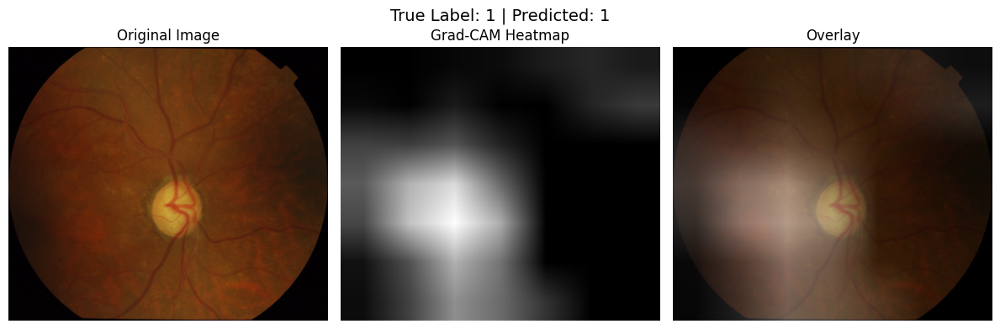

🔍 Processing: drishtiGS_004.png


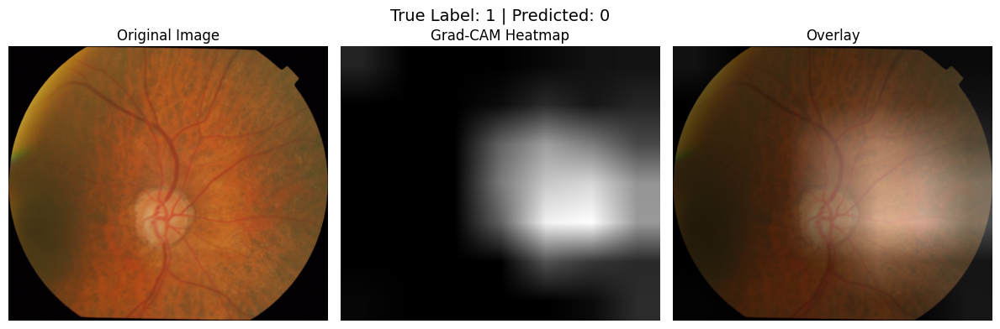

🔍 Processing: drishtiGS_003.png


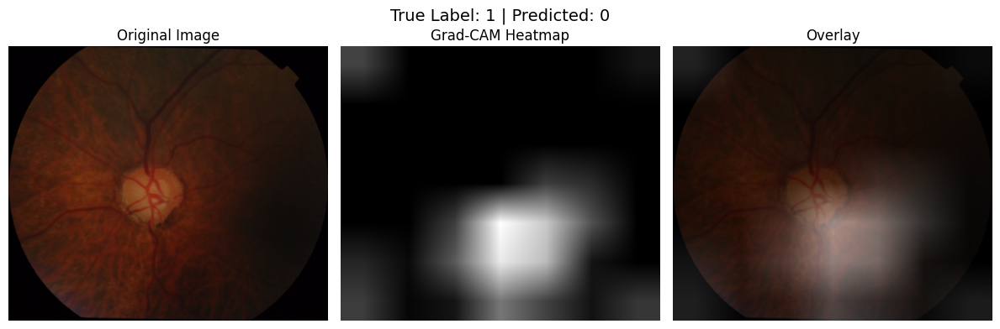

🔍 Processing: drishtiGS_062.png


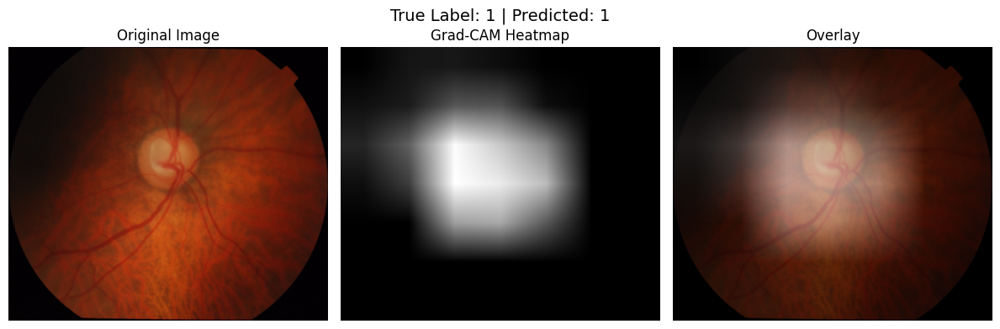

🔍 Processing: drishtiGS_052.png


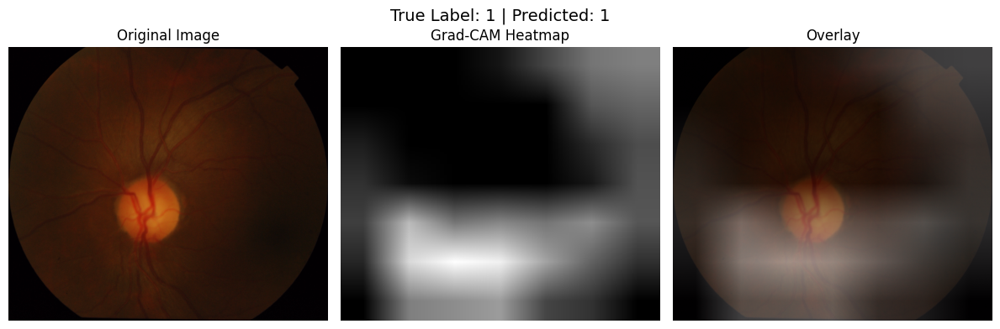

🔍 Processing: drishtiGS_094.png


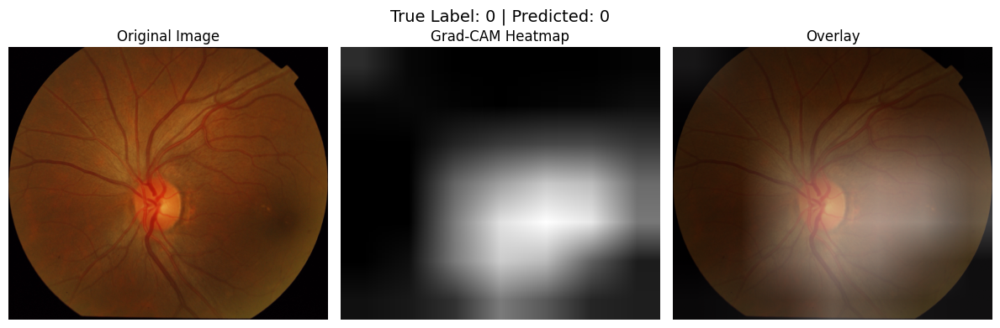

🔍 Processing: drishtiGS_096.png


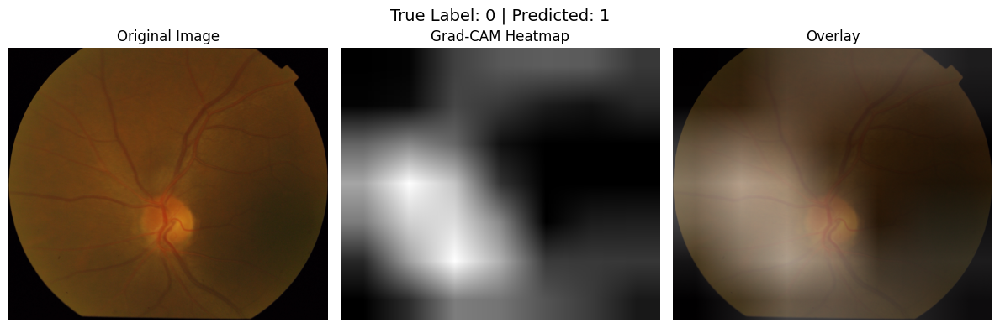

🔍 Processing: drishtiGS_100.png


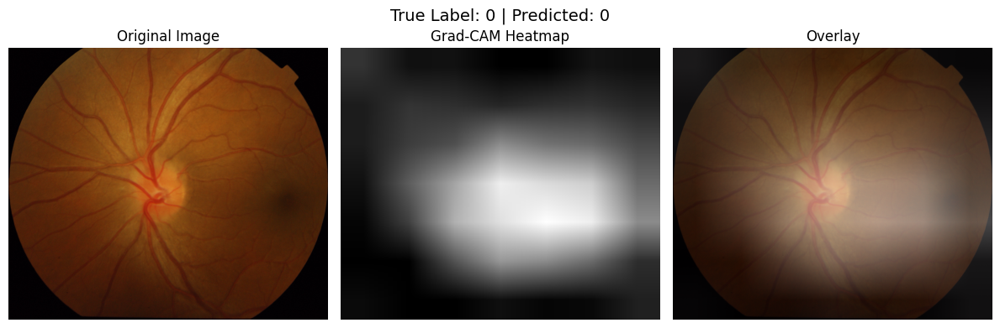

🔍 Processing: drishtiGS_036.png


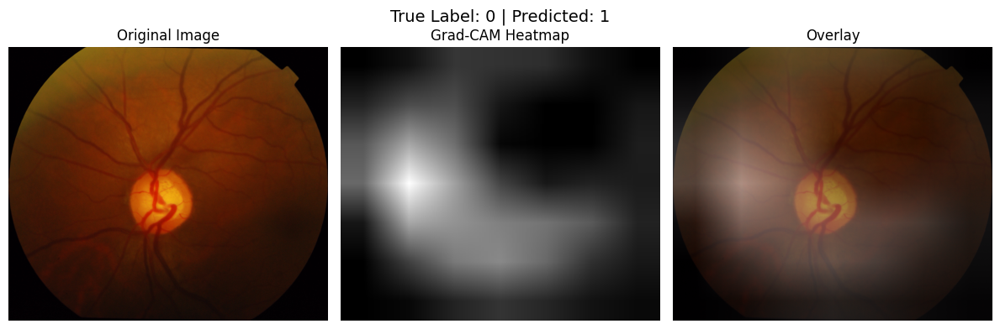

🔍 Processing: drishtiGS_047.png


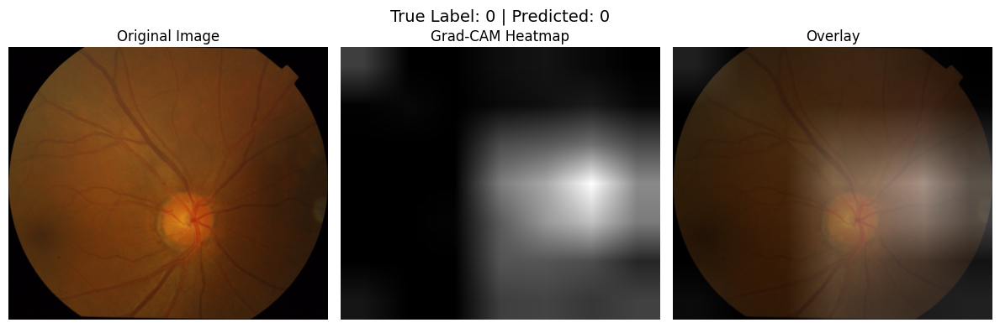

In [126]:
import os
import random
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torch import nn
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# --- Paths ---
base_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS"
model_path = r"D:\ProjectML2 - Glaucoma\models\resnet50_origa.pth"

# Paths to images
glaucoma_paths = [
    os.path.join(base_path, "Training-20211018T055246Z-001", "Training", "Images", "GLAUCOMA"),
    os.path.join(base_path, "Test-20211018T060000Z-001", "Test", "Images", "glaucoma")
]
normal_paths = [
    os.path.join(base_path, "Training-20211018T055246Z-001", "Training", "Images", "NORMAL"),
    os.path.join(base_path, "Test-20211018T060000Z-001", "Test", "Images", "normal")
]

# Collect image paths
def collect_images(folders):
    all_images = []
    for folder in folders:
        if os.path.exists(folder):
            for file in os.listdir(folder):
                if file.endswith(('.png', '.jpg', '.jpeg')):
                    all_images.append(os.path.join(folder, file))
    return all_images

glaucoma_images = collect_images(glaucoma_paths)
normal_images = collect_images(normal_paths)

# Sample up to 5 images each
sample_g = random.sample(glaucoma_images, min(5, len(glaucoma_images)))
sample_n = random.sample(normal_images, min(5, len(normal_images)))
sampled_images = [(img, 1) for img in sample_g] + [(img, 0) for img in sample_n]

# --- Load Model ---
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(model_path, map_location="cpu"))
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# --- Grad-CAM Hooks ---
activations = {}
gradients = {}

def save_activation(name):
    def hook(module, input, output):
        activations[name] = output
    return hook

def save_gradient(name):
    def hook(module, grad_in, grad_out):
        gradients[name] = grad_out[0]
    return hook

target_layer = model.layer4[-1]
target_layer.register_forward_hook(save_activation("value"))
target_layer.register_backward_hook(save_gradient("value"))

# --- Image Transform ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Grad-CAM Generator ---
def generate_gradcam(image_tensor, class_idx):
    model.zero_grad()
    output = model(image_tensor)
    target = output[0, class_idx]
    target.backward()

    act = activations["value"].detach().cpu().squeeze(0)
    grad = gradients["value"].detach().cpu().squeeze(0)

    weights = grad.mean(dim=(1, 2), keepdim=True)
    cam = (weights * act).sum(0)
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return cam.numpy()

# --- Visualize ---
def show_gradcam(image_path, label):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)

    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    cam = generate_gradcam(input_tensor, pred_class)
    cam = np.uint8(255 * cam)
    cam = np.stack([cam] * 3, axis=-1)
    cam = Image.fromarray(cam).resize(img.size, Image.BILINEAR)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(img)
    axs[0].set_title("Original Image")

    axs[1].imshow(cam)
    axs[1].set_title("Grad-CAM Heatmap")

    overlay = Image.blend(img, cam, alpha=0.5)
    axs[2].imshow(overlay)
    axs[2].set_title("Overlay")

    for ax in axs:
        ax.axis('off')
    plt.suptitle(f"True Label: {label} | Predicted: {pred_class}", fontsize=14)
    plt.tight_layout()
    plt.show()

# --- Run Grad-CAM on Samples ---
for img_path, label in sampled_images:
    print(f"🔍 Processing: {os.path.basename(img_path)}")
    show_gradcam(img_path, label)


In [128]:
import os
import random
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torch import nn
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# --- Paths ---
base_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS"
model_path = r"D:\ProjectML2 - Glaucoma\models\resnet50_origa.pth"

# Paths to images
glaucoma_paths = [
    os.path.join(base_path, "Training-20211018T055246Z-001", "Training", "Images", "GLAUCOMA"),
    os.path.join(base_path, "Test-20211018T060000Z-001", "Test", "Images", "glaucoma")
]
normal_paths = [
    os.path.join(base_path, "Training-20211018T055246Z-001", "Training", "Images", "NORMAL"),
    os.path.join(base_path, "Test-20211018T060000Z-001", "Test", "Images", "normal")
]

# Collect image paths
def collect_images(folders):
    all_images = []
    for folder in folders:
        if os.path.exists(folder):
            for file in os.listdir(folder):
                if file.endswith(('.png', '.jpg', '.jpeg')):
                    all_images.append(os.path.join(folder, file))
    return all_images

glaucoma_images = collect_images(glaucoma_paths)
normal_images = collect_images(normal_paths)

# Sample up to 5 images each
sample_g = random.sample(glaucoma_images, min(5, len(glaucoma_images)))
sample_n = random.sample(normal_images, min(5, len(normal_images)))
sampled_images = [(img, 1) for img in sample_g] + [(img, 0) for img in sample_n]

# --- Load Model ---
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(model_path, map_location="cpu"))
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# --- Grad-CAM Hooks ---
activations = {}
gradients = {}

def save_activation(name):
    def hook(module, input, output):
        activations[name] = output
    return hook

def save_gradient(name):
    def hook(module, grad_in, grad_out):
        gradients[name] = grad_out[0]
    return hook

target_layer = model.layer4[-1]
target_layer.register_forward_hook(save_activation("value"))
target_layer.register_backward_hook(save_gradient("value"))

# --- Image Transform ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Grad-CAM Generator ---
def generate_gradcam(image_tensor, class_idx):
    model.zero_grad()
    output = model(image_tensor)
    target = output[0, class_idx]
    target.backward()

    act = activations["value"].detach().cpu().squeeze(0)
    grad = gradients["value"].detach().cpu().squeeze(0)

    weights = grad.mean(dim=(1, 2), keepdim=True)
    cam = (weights * act).sum(0)
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return cam.numpy()

# --- Visualize ---
def show_gradcam(image_path, label):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0).to(device)

    output = model(input_tensor)
    pred_class = output.argmax(dim=1).item()

    cam = generate_gradcam(input_tensor, pred_class)
    cam = np.uint8(255 * cam)
    cam = np.stack([cam] * 3, axis=-1)
    cam = Image.fromarray(cam).resize(img.size, Image.BILINEAR)
    overlay = Image.blend(img, cam, alpha=0.5)

    # Save outputs
    base_filename = os.path.splitext(os.path.basename(image_path))[0]
    save_dir = os.path.join(base_path, "gradcam_outputs")
    os.makedirs(save_dir, exist_ok=True)

    img.save(os.path.join(save_dir, f"{base_filename}_original.png"))
    cam.save(os.path.join(save_dir, f"{base_filename}_heatmap.png"))
    overlay.save(os.path.join(save_dir, f"{base_filename}_overlay_pred{pred_class}_true{label}.png"))

    print(f"✅ Saved: {base_filename}_*.png")


# --- Run Grad-CAM on Samples ---
for img_path, label in sampled_images:
    print(f"🔍 Processing: {os.path.basename(img_path)}")
    show_gradcam(img_path, label)


🔍 Processing: drishtiGS_032.png


C:\Users\ASUS\AppData\Local\Temp\ipykernel_10716\98258068.py:89: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  cam = np.maximum(cam, 0)


✅ Saved: drishtiGS_032_*.png
🔍 Processing: drishtiGS_004.png
✅ Saved: drishtiGS_004_*.png
🔍 Processing: drishtiGS_070.png
✅ Saved: drishtiGS_070_*.png
🔍 Processing: drishtiGS_019.png
✅ Saved: drishtiGS_019_*.png
🔍 Processing: drishtiGS_065.png
✅ Saved: drishtiGS_065_*.png
🔍 Processing: drishtiGS_017.png
✅ Saved: drishtiGS_017_*.png
🔍 Processing: drishtiGS_036.png
✅ Saved: drishtiGS_036_*.png
🔍 Processing: drishtiGS_098.png
✅ Saved: drishtiGS_098_*.png
🔍 Processing: drishtiGS_095.png
✅ Saved: drishtiGS_095_*.png
🔍 Processing: drishtiGS_007.png
✅ Saved: drishtiGS_007_*.png


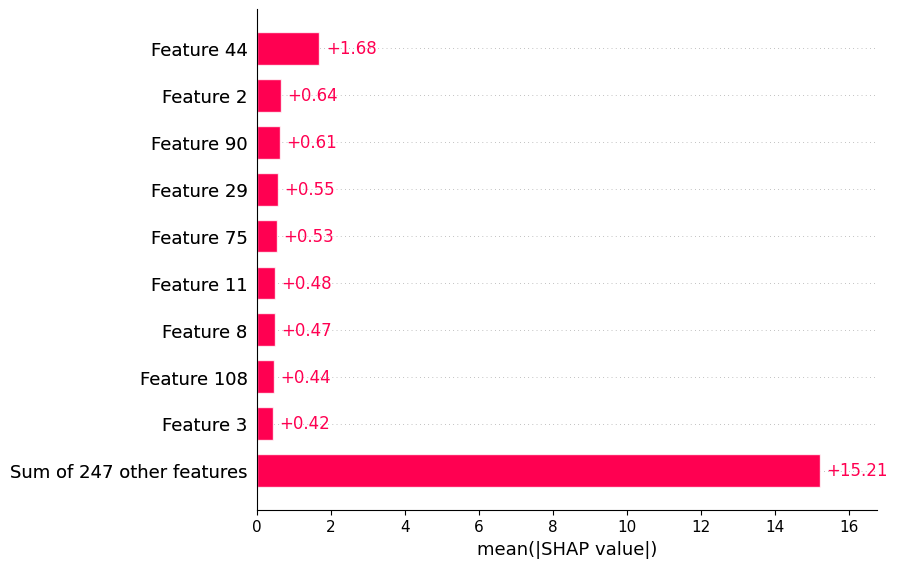

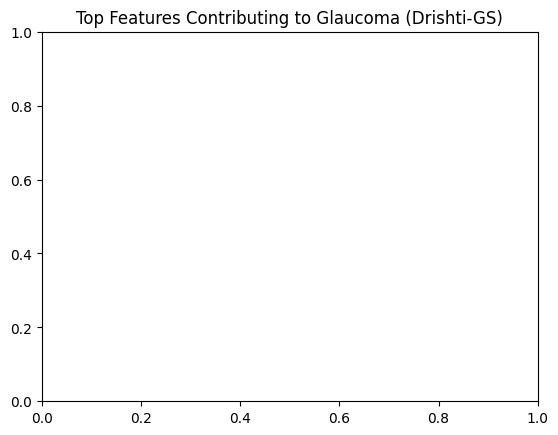

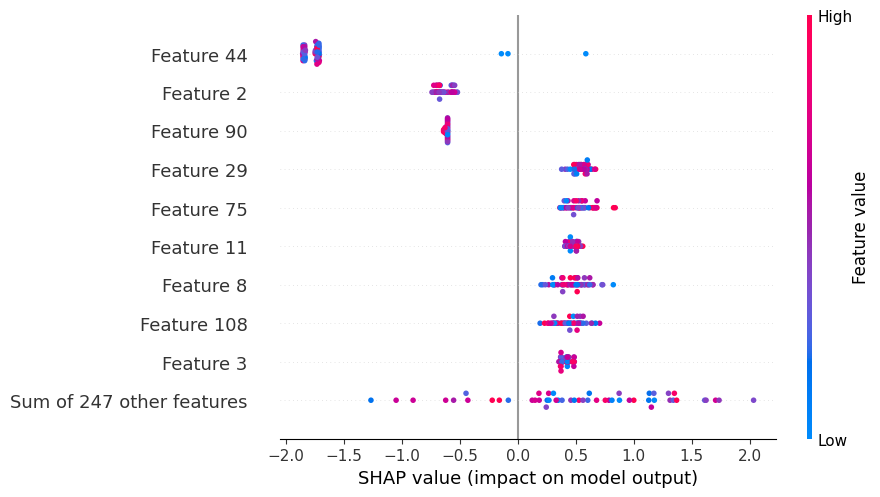

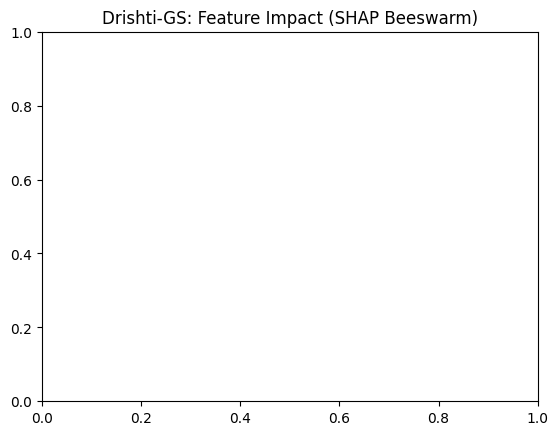

In [129]:
import shap
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# --- Load Drishti Features ---
df_drishti = pd.read_csv(r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv")
X_drishti = df_drishti.drop(columns=['Label']).values
y_drishti = df_drishti['Label'].values

# --- Apply PCA (same fitted object used for ORIGA/ACRIMA) ---
X_drishti_pca = pca.transform(X_drishti)

# --- Use your desired model ---
# model = model_partial
model = model_finetune

# --- SHAP Explainer ---
explainer = shap.Explainer(model)
shap_values = explainer(X_drishti_pca)

# --- SHAP Summary Bar Plot ---
shap.plots.bar(shap_values, max_display=10)
plt.title("Top Features Contributing to Glaucoma (Drishti-GS)", fontsize=12)
plt.show()

# --- SHAP Beeswarm Plot ---
shap.plots.beeswarm(shap_values, max_display=10)
plt.title("Drishti-GS: Feature Impact (SHAP Beeswarm)", fontsize=12)
plt.show()


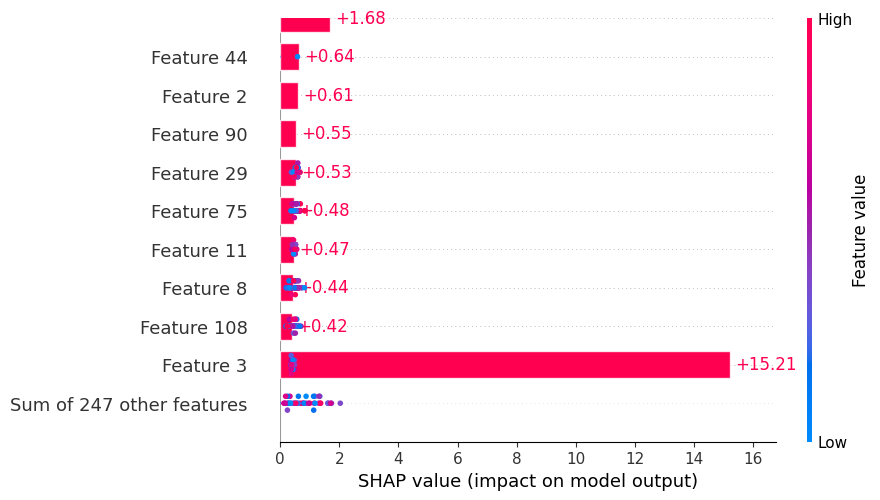

In [130]:
shap.plots.bar(shap_values, max_display=10, show=False)
plt.savefig("drishti_shap_bar.png")

shap.plots.beeswarm(shap_values, max_display=10, show=False)
plt.savefig("drishti_shap_beeswarm.png")


In [131]:
from sklearn.metrics import confusion_matrix

pred = model_finetune.predict(X_drishti_pca)
print(confusion_matrix(y_drishti, pred))

# Indices of misclassified samples
wrong_idxs = np.where(pred != y_drishti)[0]
print("Misclassified indices:", wrong_idxs)


[[ 3 10]
 [13 25]]
Misclassified indices: [ 3  9 11 12 17 23 25 28 30 32 34 36 37 40 42 43 44 45 46 47 48 49 50]


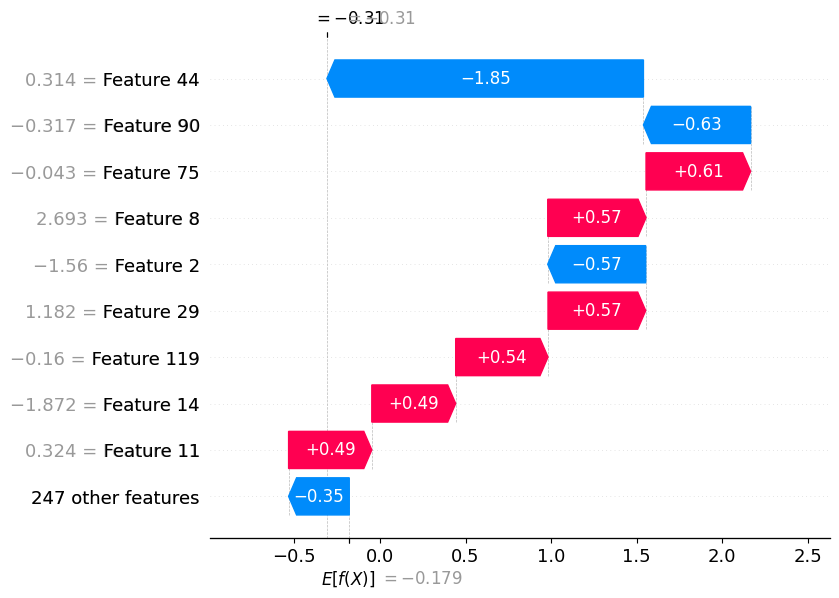

In [132]:
shap.plots.waterfall(shap_values[wrong_idxs[0]])


In [137]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

# Load the ACRIMA and ORIGA feature CSVs
df_origa = pd.read_csv("D:\\ProjectML2 - Glaucoma\\origa_resnet_features.csv")
df_acrima = pd.read_csv("D:\\ProjectML2 - Glaucoma\\acrima_resnet_features.csv")

# Extract features and labels
origa_features = df_origa.drop(columns=["Label"]).values
acrima_features = df_acrima.drop(columns=["Label"]).values

yt = df_origa["Label"].values
ys = df_acrima["Label"].values

# Fit PCA on ORIGA (target domain)
pca = PCA(n_components=100, random_state=42)
Xt_pca = pca.fit_transform(origa_features)
Xs_pca = pca.transform(acrima_features)

# CORAL function
def coral(source, target):
    cov_src = np.cov(source.T) + np.eye(source.shape[1])
    cov_tar = np.cov(target.T) + np.eye(target.shape[1])
    cov_src_inv_sqrt = np.linalg.inv(np.linalg.cholesky(cov_src)).T
    cov_tar_sqrt = np.linalg.cholesky(cov_tar)
    return (source @ cov_src_inv_sqrt) @ cov_tar_sqrt

Xs_coral = coral(Xs_pca, Xt_pca)


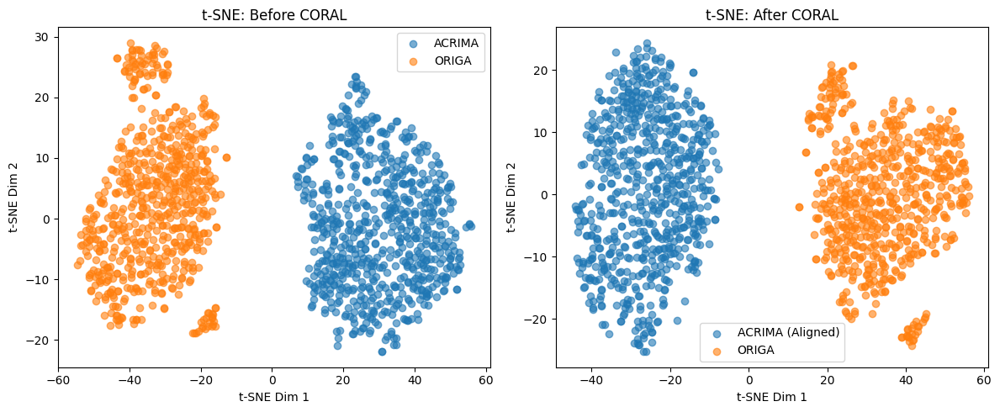

In [138]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Before CORAL: Combine ACRIMA + ORIGA
X_before = np.vstack([Xs_pca, Xt_pca])
y_before = np.array([0]*len(Xs_pca) + [1]*len(Xt_pca))  # 0 = ACRIMA, 1 = ORIGA

# After CORAL: Use CORAL-aligned ACRIMA + ORIGA
X_after = np.vstack([Xs_coral, Xt_pca])
y_after = y_before.copy()

# Fit t-SNE
tsne_before = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_before)
tsne_after = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_after)

# Plot
plt.figure(figsize=(12, 5))

# Before CORAL
plt.subplot(1, 2, 1)
plt.title("t-SNE: Before CORAL")
plt.scatter(tsne_before[y_before==0, 0], tsne_before[y_before==0, 1], label="ACRIMA", alpha=0.6)
plt.scatter(tsne_before[y_before==1, 0], tsne_before[y_before==1, 1], label="ORIGA", alpha=0.6)
plt.legend()
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")

# After CORAL
plt.subplot(1, 2, 2)
plt.title("t-SNE: After CORAL")
plt.scatter(tsne_after[y_after==0, 0], tsne_after[y_after==0, 1], label="ACRIMA (Aligned)", alpha=0.6)
plt.scatter(tsne_after[y_after==1, 0], tsne_after[y_after==1, 1], label="ORIGA", alpha=0.6)
plt.legend()
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")

plt.tight_layout()
plt.show()


In [139]:
import os
import cv2
import numpy as np
import pandas as pd

# Root path to Drishti-GS test set
root_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Test-20211018T060000Z-001\Test"
images_path = os.path.join(root_path, "Images", "glaucoma")  # You can also loop through normal/
gt_root = os.path.join(root_path, "Test_GT")

# List of image filenames
img_files = [f for f in os.listdir(images_path) if f.endswith(".png")]

cdr_data = []

def get_vertical_diameter(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        cnt = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(cnt)
        return h
    return 0

for filename in img_files:
    img_id = filename.split(".")[0]  # drishtiGS_001

    # Load cup and disc masks (SoftMap)
    cup_path = os.path.join(gt_root, img_id, "SoftMap", f"{img_id}_cupsegSoftmap.png")
    disc_path = os.path.join(gt_root, img_id, "SoftMap", f"{img_id}_ODsegSoftmap.png")

    if not os.path.exists(cup_path) or not os.path.exists(disc_path):
        continue

    cup_mask = cv2.imread(cup_path, cv2.IMREAD_GRAYSCALE)
    disc_mask = cv2.imread(disc_path, cv2.IMREAD_GRAYSCALE)

    # Threshold to binary
    _, cup_bin = cv2.threshold(cup_mask, 30, 255, cv2.THRESH_BINARY)
    _, disc_bin = cv2.threshold(disc_mask, 30, 255, cv2.THRESH_BINARY)

    cup_height = get_vertical_diameter(cup_bin)
    disc_height = get_vertical_diameter(disc_bin)

    cdr = round(cup_height / disc_height, 3) if disc_height > 0 else 0

    cdr_data.append({
        "Filename": filename,
        "CupHeight": cup_height,
        "DiscHeight": disc_height,
        "CDR": cdr
    })

# Save or use the DataFrame
cdr_df = pd.DataFrame(cdr_data)
cdr_df.to_csv("D:\\ProjectML2 - Glaucoma\\drishti_cdr_computed.csv", index=False)

cdr_df.head()


,Filename,CupHeight,DiscHeight,CDR
0,drishtiGS_001.png,433,509,0.851
1,drishtiGS_003.png,324,385,0.842
2,drishtiGS_005.png,469,530,0.885
3,drishtiGS_006.png,344,437,0.787
4,drishtiGS_011.png,311,362,0.859


In [141]:
features_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\drishti_resnet_features.csv")
print(features_df.columns)


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2039', '2040', '2041', '2042', '2043', '2044', '2045', '2046', '2047',
       'Label'],
      dtype='object', length=2049)


In [142]:
import os

# Folder from which you extracted features (make sure it's the same set)
image_dir = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Test-20211018T060000Z-001\Test\Images\glaucoma"

# Get sorted list of filenames (should match feature extraction order)
filenames = sorted([f for f in os.listdir(image_dir) if f.endswith(".png")])

# Check length matches number of rows
print("Filenames:", len(filenames))
print("Features:", len(features_df))


Filenames: 38
Features: 51


In [144]:
# Load both glaucoma and normal filenames
image_dir = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Test-20211018T060000Z-001\Test\Images"
glaucoma_files = sorted(os.listdir(os.path.join(image_dir, "glaucoma")))
normal_files = sorted(os.listdir(os.path.join(image_dir, "normal")))

# Combine filenames in same order used during ResNet feature extraction
filenames = glaucoma_files + normal_files  # Assuming you extracted in this order

# Check match
print("Total image filenames:", len(filenames))
print("Total feature rows:", len(features_df))


Total image filenames: 51
Total feature rows: 51


In [153]:
import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import pandas as pd
from tqdm import tqdm
import numpy as np

# ====== Paths ======
glaucoma_dir = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Test-20211018T060000Z-001\Test\Images\glaucoma"
normal_dir   = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Test-20211018T060000Z-001\Test\Images\normal"

# ====== Device ======
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ====== Image Preprocessing ======
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # Imagenet standards
        std=[0.229, 0.224, 0.225]
    )
])

# ====== Load Pretrained ResNet50 (remove classifier) ======
resnet = models.resnet50(weights='IMAGENET1K_V1')
resnet = nn.Sequential(*list(resnet.children())[:-1])  # Remove final FC
resnet.eval().to(device)

# ====== Helper Function ======
def extract_features(image_path):
    img = Image.open(image_path).convert("RGB")
    img_tensor = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        features = resnet(img_tensor).squeeze().cpu().numpy()
    return features

# ====== Loop through images ======
all_data = []

# Glaucoma = 1
for fname in tqdm(sorted(os.listdir(glaucoma_dir)), desc="Processing Glaucoma"):
    fpath = os.path.join(glaucoma_dir, fname)
    features = extract_features(fpath)
    all_data.append({
        **{f"f{i}": feat for i, feat in enumerate(features)},
        "Label": 1,
        "Filename": fname
    })

# Normal = 0
for fname in tqdm(sorted(os.listdir(normal_dir)), desc="Processing Normal"):
    fpath = os.path.join(normal_dir, fname)
    features = extract_features(fpath)
    all_data.append({
        **{f"f{i}": feat for i, feat in enumerate(features)},
        "Label": 0,
        "Filename": fname
    })

# ====== Save as CSV ======
df = pd.DataFrame(all_data)
save_path = r"D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv"
df.to_csv(save_path, index=False)

print(f"\n✅ Saved ResNet features to: {save_path}")


Processing Normal: 100%|█████████████████████████████████████████████████████████████████████████████| 13/13 [00:01<00:00,  8.89it/s]



✅ Saved ResNet features to: D:\ProjectML2 - Glaucoma\drishti_resnet_features.csv


In [155]:
import numpy as np

print("Full class distribution:", np.bincount(y))
print("Train class counts:", np.bincount(y_train))
print("Test class counts:", np.bincount(y_test))


Full class distribution: [ 0 38]
Train class counts: [ 0 30]
Test class counts: [0 8]


In [156]:
print(merged_df["Label"].unique())

[1]


In [157]:
features_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\drishti_resnet_features.csv")


In [158]:
# Recreate the label directly from filename path
features_df["Label"] = features_df["Filename"].apply(lambda x: 1 if "glaucoma" in x.lower() else 0)


In [159]:
cdr_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\drishti_cdr_computed.csv")

# Merge on filename
merged_df = pd.merge(features_df, cdr_df, on="Filename")

# Check new label distribution
print("Final class distribution:", merged_df["Label"].value_counts())


Final class distribution: Label
0    38
Name: count, dtype: int64


In [160]:
# Reload everything from scratch
features_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\drishti_resnet_features.csv")
cdr_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\drishti_cdr_computed.csv")

# Rebuild labels from filename path
features_df["Label"] = features_df["Filename"].apply(
    lambda x: 1 if "drishtiGS_" in x and x in cdr_df["Filename"].values else 0
)

# Merge safely without overwriting Label
merged_df = features_df.merge(cdr_df[['Filename', 'CDR']], on="Filename", how="left")

# Fill missing CDRs with -1 or NaN (you can choose to drop them)
merged_df["CDR"] = merged_df["CDR"].fillna(-1)

# Final check
print("Class distribution:", merged_df["Label"].value_counts())
print("Missing CDRs:", (merged_df["CDR"] == -1).sum())


Class distribution: Label
1    38
0    13
Name: count, dtype: int64
Missing CDRs: 13


In [162]:
import numpy as np
print("Class distribution after filtering:", np.bincount(y))


Class distribution after filtering: [ 0 38]


In [163]:
# Rebuild features and labels
X = merged_df.drop(columns=["Label", "Filename"]).copy()
y = merged_df["Label"].values

# Fill missing CDRs (which were -1 after merge)
X["CDR"] = X["CDR"].replace(-1, X["CDR"].mean())  # or .fillna(0)

# Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    X.values, y, test_size=0.2, stratify=y, random_state=42
)

# Train model
from xgboost import XGBClassifier
model = XGBClassifier(random_state=42)
model.fit(X_train, y_train)

# Evaluate
from sklearn.metrics import accuracy_score, classification_report
y_pred = model.predict(X_test)
print("✅ Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


✅ Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00         8

    accuracy                           1.00        11
   macro avg       1.00      1.00      1.00        11
weighted avg       1.00      1.00      1.00        11



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


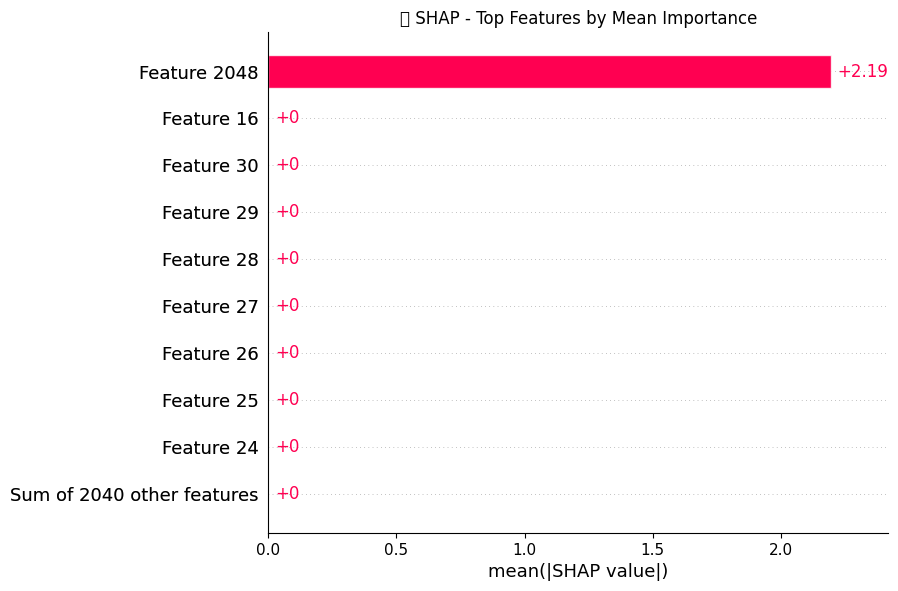

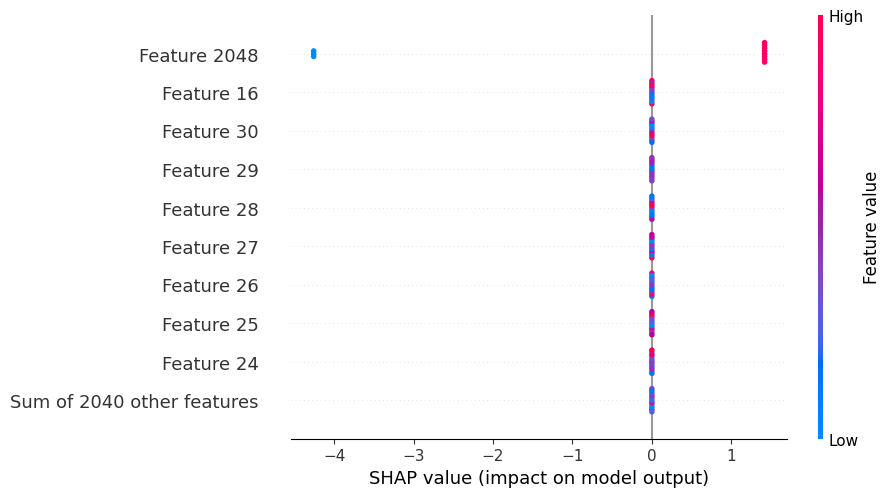

In [164]:
import shap
import matplotlib.pyplot as plt

# Initialize SHAP explainer
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values
shap_values = explainer(X_test)

# Plot feature importance (bar)
plt.title("🔍 SHAP - Top Features by Mean Importance")
shap.plots.bar(shap_values, max_display=10)
plt.show()

# Optional: Detailed summary plot (beeswarm)
shap.plots.beeswarm(shap_values, max_display=10)


## DANN (Deep-Adversarial Neural Network)

In [171]:
import torch
import torch.nn as nn

# Feature Extractor: Linear MLP for 2048D ResNet features
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim=2048, hidden_dim=512):
        super(FeatureExtractor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),   # ← safer than BatchNorm
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)


# Label Predictor
class LabelPredictor(nn.Module):
    def __init__(self, input_dim=512, num_classes=2):
        super(LabelPredictor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, num_classes)
        )

    def forward(self, x):
        return self.net(x)

# Domain Classifier
class DomainClassifier(nn.Module):
    def __init__(self, input_dim=512):
        super(DomainClassifier, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )

    def forward(self, x):
        return self.net(x)


In [172]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

# Replace this with your own ResNet feature arrays
Xs = torch.tensor(acrima_features, dtype=torch.float32)
ys = torch.tensor(y_acrima, dtype=torch.long)
Xt = torch.tensor(origa_features, dtype=torch.float32)
yt = torch.zeros(Xt.shape[0]).long()  # dummy target labels

domain_source = torch.zeros(Xs.shape[0]).long()
domain_target = torch.ones(Xt.shape[0]).long()

# Dataloaders with drop_last=True
source_loader = DataLoader(TensorDataset(Xs, ys, domain_source), batch_size=4, shuffle=True, drop_last=True)
target_loader = DataLoader(TensorDataset(Xt, domain_target), batch_size=4, shuffle=True, drop_last=True)

# Gradient Reversal
def gradient_reversal(x, alpha=1.0):
    return x * -alpha

# Reuse previous LabelPredictor and DomainClassifier classes
feature_extractor = FeatureExtractor().to(device)
label_predictor = LabelPredictor().to(device)
domain_classifier = DomainClassifier().to(device)

optimizer_F = optim.Adam(feature_extractor.parameters(), lr=1e-4)
optimizer_C = optim.Adam(label_predictor.parameters(), lr=1e-4)
optimizer_D = optim.Adam(domain_classifier.parameters(), lr=1e-4)

class_criterion = nn.CrossEntropyLoss()
domain_criterion = nn.CrossEntropyLoss()

# 🔁 Training loop
num_epochs = 20
for epoch in range(num_epochs):
    feature_extractor.train()
    label_predictor.train()
    domain_classifier.train()

    total_cls_loss, total_dom_loss = 0, 0
    target_iter = iter(target_loader)

    for xs, ys_cls, ds_label in source_loader:
        try:
            xt, dt_label = next(target_iter)
        except StopIteration:
            target_iter = iter(target_loader)
            xt, dt_label = next(target_iter)

        xs, ys_cls, ds_label = xs.to(device), ys_cls.to(device), ds_label.to(device)
        xt, dt_label = xt.to(device), dt_label.to(device)

        # Forward pass
        feat_s = feature_extractor(xs)
        feat_t = feature_extractor(xt)

        # Label classification loss
        pred_cls = label_predictor(feat_s)
        loss_cls = class_criterion(pred_cls, ys_cls)

        # Domain classification loss (with gradient reversal)
        feat_all = torch.cat([feat_s, feat_t], dim=0)
        feat_all_reversed = gradient_reversal(feat_all)
        dom_labels = torch.cat([ds_label, dt_label], dim=0)
        pred_dom = domain_classifier(feat_all_reversed)
        loss_dom = domain_criterion(pred_dom, dom_labels)

        # Total loss
        total_loss = loss_cls + loss_dom

        # Backprop
        optimizer_F.zero_grad()
        optimizer_C.zero_grad()
        optimizer_D.zero_grad()
        total_loss.backward()
        optimizer_F.step()
        optimizer_C.step()
        optimizer_D.step()

        total_cls_loss += loss_cls.item()
        total_dom_loss += loss_dom.item()

    print(f"[Epoch {epoch+1}/{num_epochs}] ✅ Class Loss: {total_cls_loss:.4f} | 🌍 Domain Loss: {total_dom_loss:.4f}")


[Epoch 1/20] ✅ Class Loss: 55.8120 | 🌍 Domain Loss: 10.9427
[Epoch 2/20] ✅ Class Loss: 25.1097 | 🌍 Domain Loss: 0.3060
[Epoch 3/20] ✅ Class Loss: 9.4865 | 🌍 Domain Loss: 0.0801
[Epoch 4/20] ✅ Class Loss: 4.0514 | 🌍 Domain Loss: 0.0357
[Epoch 5/20] ✅ Class Loss: 1.5171 | 🌍 Domain Loss: 0.0181
[Epoch 6/20] ✅ Class Loss: 0.5842 | 🌍 Domain Loss: 0.0092
[Epoch 7/20] ✅ Class Loss: 0.3381 | 🌍 Domain Loss: 0.0058
[Epoch 8/20] ✅ Class Loss: 0.2311 | 🌍 Domain Loss: 0.0041
[Epoch 9/20] ✅ Class Loss: 0.1644 | 🌍 Domain Loss: 0.0031
[Epoch 10/20] ✅ Class Loss: 0.1243 | 🌍 Domain Loss: 0.0022
[Epoch 11/20] ✅ Class Loss: 0.0956 | 🌍 Domain Loss: 0.0017
[Epoch 12/20] ✅ Class Loss: 0.0757 | 🌍 Domain Loss: 0.0014
[Epoch 13/20] ✅ Class Loss: 0.0597 | 🌍 Domain Loss: 0.0011
[Epoch 14/20] ✅ Class Loss: 0.0487 | 🌍 Domain Loss: 0.0009
[Epoch 15/20] ✅ Class Loss: 0.0400 | 🌍 Domain Loss: 0.0008
[Epoch 16/20] ✅ Class Loss: 0.0335 | 🌍 Domain Loss: 0.0006
[Epoch 17/20] ✅ Class Loss: 0.0280 | 🌍 Domain Loss: 0.0005
[Ep

In [173]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Set models to eval mode
feature_extractor.eval()
label_predictor.eval()

# Extract ORIGA features
Xt = torch.tensor(origa_features, dtype=torch.float32).to(device)
yt_true = torch.tensor(y_origa, dtype=torch.long).to(device)

# Run inference
with torch.no_grad():
    feat_t = feature_extractor(Xt)
    preds = label_predictor(feat_t)
    y_pred = torch.argmax(preds, dim=1)

# Metrics
print("✅ Accuracy on ORIGA:", accuracy_score(yt_true.cpu(), y_pred.cpu()))
print("\n🧾 Classification Report:\n", classification_report(yt_true.cpu(), y_pred.cpu()))
print("📊 Confusion Matrix:\n", confusion_matrix(yt_true.cpu(), y_pred.cpu()))


✅ Accuracy on ORIGA: 0.2723076923076923

🧾 Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.02      0.04       482
           1       0.26      0.99      0.41       168

    accuracy                           0.27       650
   macro avg       0.55      0.51      0.23       650
weighted avg       0.69      0.27      0.14       650

📊 Confusion Matrix:
 [[ 11 471]
 [  2 166]]


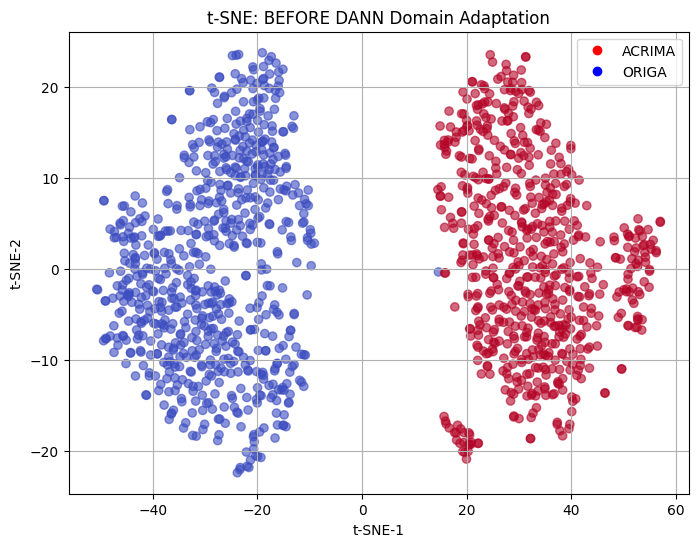

In [174]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Raw input features (before DANN): acrima_features & origa_features
Xs_raw = np.array(acrima_features)
Xt_raw = np.array(origa_features)

X_all = np.vstack([Xs_raw, Xt_raw])
domain_labels = np.array([0]*len(Xs_raw) + [1]*len(Xt_raw))  # 0 = ACRIMA, 1 = ORIGA

tsne_raw = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne_raw = tsne_raw.fit_transform(X_all)

plt.figure(figsize=(8, 6))
plt.title("t-SNE: BEFORE DANN Domain Adaptation")
plt.scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], c=domain_labels, cmap='coolwarm', alpha=0.6)
plt.xlabel("t-SNE-1")
plt.ylabel("t-SNE-2")
plt.legend(handles=[
    plt.Line2D([], [], color='red', marker='o', linestyle='None', label='ACRIMA'),
    plt.Line2D([], [], color='blue', marker='o', linestyle='None', label='ORIGA')
])
plt.grid(True)
plt.show()


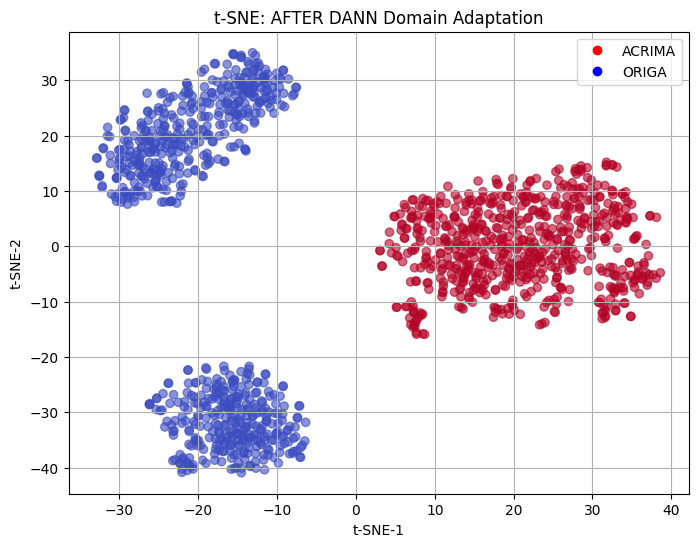

In [175]:
# Use trained feature_extractor to get aligned features
feature_extractor.eval()
Xs_aligned = feature_extractor(torch.tensor(acrima_features, dtype=torch.float32).to(device)).cpu().detach().numpy()
Xt_aligned = feature_extractor(torch.tensor(origa_features, dtype=torch.float32).to(device)).cpu().detach().numpy()

X_all_aligned = np.vstack([Xs_aligned, Xt_aligned])
domain_labels = np.array([0]*len(Xs_aligned) + [1]*len(Xt_aligned))

tsne_aligned = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne_aligned = tsne_aligned.fit_transform(X_all_aligned)

plt.figure(figsize=(8, 6))
plt.title("t-SNE: AFTER DANN Domain Adaptation")
plt.scatter(X_tsne_aligned[:, 0], X_tsne_aligned[:, 1], c=domain_labels, cmap='coolwarm', alpha=0.6)
plt.xlabel("t-SNE-1")
plt.ylabel("t-SNE-2")
plt.legend(handles=[
    plt.Line2D([], [], color='red', marker='o', linestyle='None', label='ACRIMA'),
    plt.Line2D([], [], color='blue', marker='o', linestyle='None', label='ORIGA')
])
plt.grid(True)
plt.show()


In [176]:
import torch

# Total
total = 482 + 168

# Inverse frequency
weight_0 = total / (2 * 482)
weight_1 = total / (2 * 168)

class_weights = torch.tensor([weight_0, weight_1], dtype=torch.float32).to(device)

# Use in loss
label_criterion = nn.CrossEntropyLoss(weight=class_weights)


In [181]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ----------- DANN Components -----------

# Gradient Reversal Layer
class GradientReversal(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.lambda_, None

# Feature Extractor
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim=2048):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.2)
        )

    def forward(self, x):
        return self.net(x)

# Label Predictor
class LabelPredictor(nn.Module):
    def __init__(self, input_dim=512):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )

    def forward(self, x):
        return self.net(x)

# Domain Classifier
class DomainClassifier(nn.Module):
    def __init__(self, input_dim=512):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )

    def forward(self, x, lambda_):
        x = GradientReversal.apply(x, lambda_)
        return self.net(x)

# ----------- Dataset Preparation -----------

# Ensure tensors are float32
Xs_tensor = torch.tensor(Xs, dtype=torch.float32)
ys_tensor = torch.tensor(ys, dtype=torch.long)

Xt_tensor = torch.tensor(Xt, dtype=torch.float32)
# dummy target labels for Xt
dt_labels_tensor = torch.zeros(len(Xt_tensor), dtype=torch.long)

# DataLoaders
batch_size = 32
source_loader = DataLoader(TensorDataset(Xs_tensor, ys_tensor), batch_size=batch_size, shuffle=True, drop_last=True)
target_loader = DataLoader(TensorDataset(Xt_tensor, dt_labels_tensor), batch_size=batch_size, shuffle=True, drop_last=True)

# ----------- Model Init -----------

feature_extractor = FeatureExtractor().to(device)
label_predictor = LabelPredictor().to(device)
domain_classifier = DomainClassifier().to(device)

label_criterion = nn.CrossEntropyLoss()
domain_criterion = nn.CrossEntropyLoss()

optimizer_F = optim.Adam(feature_extractor.parameters(), lr=1e-4)
optimizer_L = optim.Adam(label_predictor.parameters(), lr=1e-4)
optimizer_D = optim.Adam(domain_classifier.parameters(), lr=1e-4)

# ----------- DANN Training -----------

epochs = 20
for epoch in range(epochs):
    feature_extractor.train()
    label_predictor.train()
    domain_classifier.train()

    total_class_loss = 0
    total_domain_loss = 0

    for (xs, ys_batch), (xt, _) in zip(source_loader, target_loader):
        xs, ys_batch = xs.to(device), ys_batch.to(device)
        xt = xt.to(device)

        # Extract features
        feat_s = feature_extractor(xs)
        feat_t = feature_extractor(xt)

        # Label prediction loss (source only)
        class_output = label_predictor(feat_s)
        label_loss = label_criterion(class_output, ys_batch)

        # Domain classification loss (both domains)
        domain_input = torch.cat([feat_s, feat_t], dim=0)
        domain_labels = torch.cat([
            torch.zeros(len(feat_s), dtype=torch.long),
            torch.ones(len(feat_t), dtype=torch.long)
        ]).to(device)

        domain_pred = domain_classifier(domain_input, lambda_=1.0)
        domain_loss = domain_criterion(domain_pred, domain_labels)

        # Backward pass
        optimizer_F.zero_grad()
        optimizer_L.zero_grad()
        optimizer_D.zero_grad()

        total_loss = label_loss + domain_loss
        total_loss.backward()

        optimizer_F.step()
        optimizer_L.step()
        optimizer_D.step()

        total_class_loss += label_loss.item()
        total_domain_loss += domain_loss.item()

    print(f"[Epoch {epoch+1}/{epochs}] ✅ Class Loss: {total_class_loss:.4f} | 🌍 Domain Loss: {total_domain_loss:.4f}")


C:\Users\ASUS\AppData\Local\Temp\ipykernel_10716\3992531545.py:68: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Xs_tensor = torch.tensor(Xs, dtype=torch.float32)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_10716\3992531545.py:69: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ys_tensor = torch.tensor(ys, dtype=torch.long)
C:\Users\ASUS\AppData\Local\Temp\ipykernel_10716\3992531545.py:71: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Xt_tensor = torch.tensor(Xt, dtype=torch.float32)


[Epoch 1/20] ✅ Class Loss: 11.1888 | 🌍 Domain Loss: 14.3327
[Epoch 2/20] ✅ Class Loss: 6.7210 | 🌍 Domain Loss: 15.0699
[Epoch 3/20] ✅ Class Loss: 4.7077 | 🌍 Domain Loss: 15.5654
[Epoch 4/20] ✅ Class Loss: 3.4247 | 🌍 Domain Loss: 15.7070
[Epoch 5/20] ✅ Class Loss: 2.7648 | 🌍 Domain Loss: 15.4859
[Epoch 6/20] ✅ Class Loss: 1.9827 | 🌍 Domain Loss: 15.0512
[Epoch 7/20] ✅ Class Loss: 1.6230 | 🌍 Domain Loss: 14.5983
[Epoch 8/20] ✅ Class Loss: 1.2761 | 🌍 Domain Loss: 14.1779
[Epoch 9/20] ✅ Class Loss: 1.0972 | 🌍 Domain Loss: 14.0097
[Epoch 10/20] ✅ Class Loss: 1.0778 | 🌍 Domain Loss: 14.1508
[Epoch 11/20] ✅ Class Loss: 0.9774 | 🌍 Domain Loss: 14.4220
[Epoch 12/20] ✅ Class Loss: 0.6549 | 🌍 Domain Loss: 14.7113
[Epoch 13/20] ✅ Class Loss: 0.6222 | 🌍 Domain Loss: 14.9924
[Epoch 14/20] ✅ Class Loss: 0.6636 | 🌍 Domain Loss: 15.0114
[Epoch 15/20] ✅ Class Loss: 0.5821 | 🌍 Domain Loss: 14.7676
[Epoch 16/20] ✅ Class Loss: 0.5049 | 🌍 Domain Loss: 14.4752
[Epoch 17/20] ✅ Class Loss: 0.3451 | 🌍 Domain Lo

In [185]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from sklearn.utils.class_weight import compute_class_weight

# ✅ Compute class weights from ORIGA target labels
classes = np.array([0, 1])
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_origa)
class_weights = torch.tensor(weights, dtype=torch.float32).to(device)

# ✅ Define loss functions
label_criterion = nn.CrossEntropyLoss(weight=class_weights)
domain_criterion = nn.CrossEntropyLoss()

# ✅ Optimizer
optimizer = optim.Adam(
    list(feature_extractor.parameters()) + 
    list(label_predictor.parameters()) + 
    list(domain_classifier.parameters()), 
    lr=1e-4
)

# ✅ Training loop
for epoch in range(1, 21):
    feature_extractor.train()
    label_predictor.train()
    domain_classifier.train()

    total_class_loss = 0
    total_domain_loss = 0

    for (xs_batch, ys_batch), (xt_batch, _) in zip(source_loader, target_loader):
        xs_batch, ys_batch = xs_batch.to(device), ys_batch.to(device)
        xt_batch = xt_batch.to(device)

        # Step 0: Calculate λ for gradient reversal
        p = epoch / 20  # Progress ratio
        lambda_ = 2. / (1. + np.exp(-10 * p)) - 1  # S-shaped schedule

        # Domain labels for domain classifier
        domain_s = torch.zeros(xs_batch.size(0)).long().to(device)
        domain_t = torch.ones(xt_batch.size(0)).long().to(device)

        # Step 1: Feature Extraction
        feat_s = feature_extractor(xs_batch)
        feat_t = feature_extractor(xt_batch)

        # Step 2: Label Prediction on source
        class_output = label_predictor(feat_s)
        loss_label = label_criterion(class_output, ys_batch)

        # Step 3: Domain Prediction on both
        feat = torch.cat([feat_s, feat_t], dim=0)
        domain_output = domain_classifier(feat, lambda_)  # ✅ Uses λ now
        domain_labels = torch.cat([domain_s, domain_t], dim=0)
        loss_domain = domain_criterion(domain_output, domain_labels)

        # Step 4: Total Loss
        total_loss = loss_label + loss_domain

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        total_class_loss += loss_label.item()
        total_domain_loss += loss_domain.item()

    print(f"[Epoch {epoch}/20] ✅ Class Loss: {total_class_loss:.4f} | 🌍 Domain Loss: {total_domain_loss:.4f}")


[Epoch 1/20] ✅ Class Loss: 0.1012 | 🌍 Domain Loss: 14.8336
[Epoch 2/20] ✅ Class Loss: 0.0592 | 🌍 Domain Loss: 15.2349
[Epoch 3/20] ✅ Class Loss: 0.0502 | 🌍 Domain Loss: 15.2946
[Epoch 4/20] ✅ Class Loss: 0.1206 | 🌍 Domain Loss: 14.9687
[Epoch 5/20] ✅ Class Loss: 0.0821 | 🌍 Domain Loss: 14.5646
[Epoch 6/20] ✅ Class Loss: 0.1304 | 🌍 Domain Loss: 14.3383
[Epoch 7/20] ✅ Class Loss: 0.0825 | 🌍 Domain Loss: 14.3137
[Epoch 8/20] ✅ Class Loss: 0.1166 | 🌍 Domain Loss: 14.5961
[Epoch 9/20] ✅ Class Loss: 0.0829 | 🌍 Domain Loss: 14.6624
[Epoch 10/20] ✅ Class Loss: 0.0701 | 🌍 Domain Loss: 14.5226
[Epoch 11/20] ✅ Class Loss: 0.2570 | 🌍 Domain Loss: 14.2816
[Epoch 12/20] ✅ Class Loss: 0.0644 | 🌍 Domain Loss: 14.1975
[Epoch 13/20] ✅ Class Loss: 0.0606 | 🌍 Domain Loss: 14.2052
[Epoch 14/20] ✅ Class Loss: 0.0276 | 🌍 Domain Loss: 14.3153
[Epoch 15/20] ✅ Class Loss: 0.0271 | 🌍 Domain Loss: 14.4202
[Epoch 16/20] ✅ Class Loss: 0.0204 | 🌍 Domain Loss: 14.3325
[Epoch 17/20] ✅ Class Loss: 0.0378 | 🌍 Domain Los

In [186]:
feature_extractor.eval()
label_predictor.eval()

with torch.no_grad():
    feats_origa = feature_extractor(Xt_tensor)
    preds_origa = label_predictor(feats_origa)
    preds_origa_cls = preds_origa.argmax(dim=1).cpu().numpy()

print("✅ Accuracy on ORIGA:", accuracy_score(y_origa, preds_origa_cls))
print("\n🧾 Classification Report:\n", classification_report(y_origa, preds_origa_cls))
print("\n📊 Confusion Matrix:\n", confusion_matrix(y_origa, preds_origa_cls))


✅ Accuracy on ORIGA: 0.34307692307692306

🧾 Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.13      0.23       482
           1       0.28      0.95      0.43       168

    accuracy                           0.34       650
   macro avg       0.58      0.54      0.33       650
weighted avg       0.72      0.34      0.28       650


📊 Confusion Matrix:
 [[ 64 418]
 [  9 159]]


[Epoch 1/20] Class Loss: 3.8518 | Domain Loss: 18.8610
[Epoch 2/20] Class Loss: 2.1958 | Domain Loss: 28.1657
[Epoch 3/20] Class Loss: 1.8567 | Domain Loss: 27.8723
[Epoch 4/20] Class Loss: 1.7786 | Domain Loss: 20.9192
[Epoch 5/20] Class Loss: 1.5713 | Domain Loss: 15.8844
[Epoch 6/20] Class Loss: 1.4945 | Domain Loss: 14.8632
[Epoch 7/20] Class Loss: 1.5357 | Domain Loss: 13.5312
[Epoch 8/20] Class Loss: 1.4667 | Domain Loss: 12.9167
[Epoch 9/20] Class Loss: 1.4079 | Domain Loss: 13.0569
[Epoch 10/20] Class Loss: 1.4226 | Domain Loss: 12.7768
[Epoch 11/20] Class Loss: 1.3519 | Domain Loss: 12.7682
[Epoch 12/20] Class Loss: 1.3764 | Domain Loss: 12.6022
[Epoch 13/20] Class Loss: 1.3419 | Domain Loss: 12.0176
[Epoch 14/20] Class Loss: 1.1157 | Domain Loss: 11.9045
[Epoch 15/20] Class Loss: 1.1531 | Domain Loss: 12.2518
[Epoch 16/20] Class Loss: 1.3098 | Domain Loss: 12.5745
[Epoch 17/20] Class Loss: 1.2003 | Domain Loss: 12.9345
[Epoch 18/20] Class Loss: 1.2346 | Domain Loss: 11.6205
[

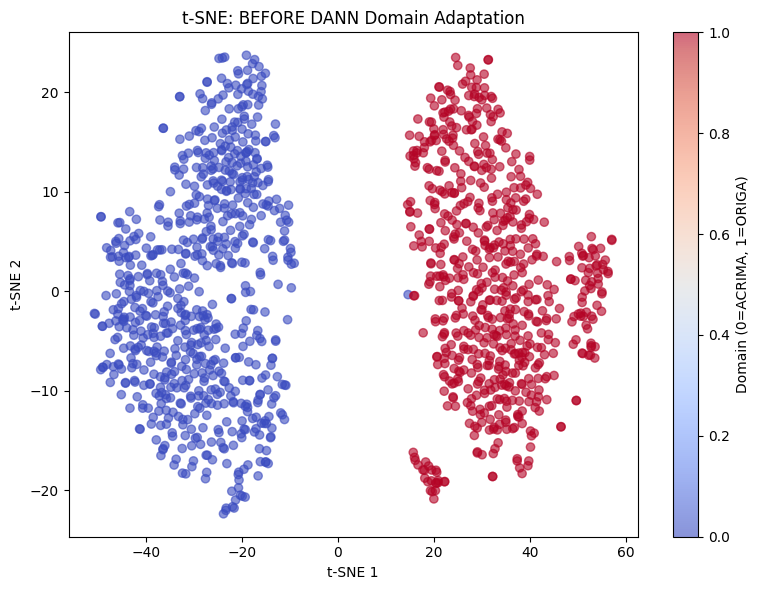

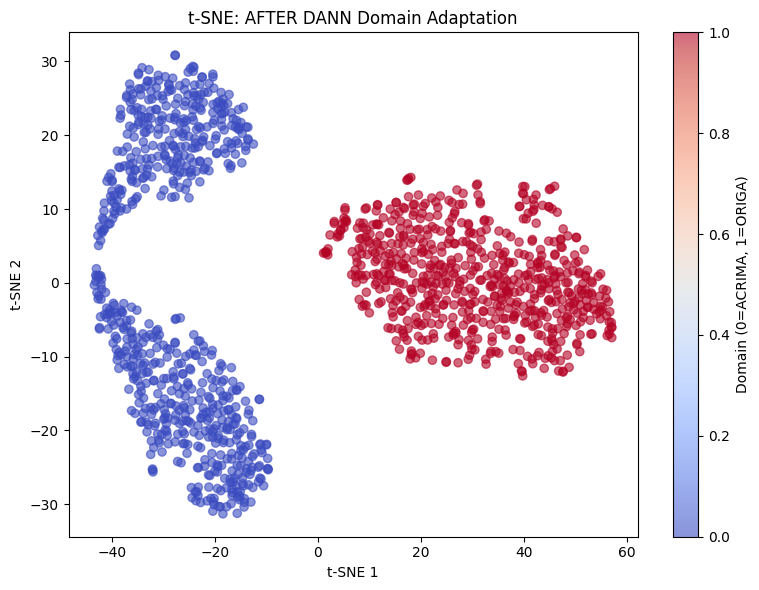

In [187]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

###############################################
# 1. Define Focal Loss for Label Prediction
###############################################
class FocalLoss(nn.Module):
    def __init__(self, alpha=1.5, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        # Compute standard cross entropy loss (without reduction)
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)  # prevents nans when probability 0
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

###############################################
# 2. Define DANN Components (for vector features)
###############################################
# Feature extractor: transforms 2048-D input to 512-D
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim=2048):
        super(FeatureExtractor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.LayerNorm(512),  # LayerNorm works well even with small batches
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
    def forward(self, x):
        return self.net(x)

# Label Predictor: classifies into 2 classes
class LabelPredictor(nn.Module):
    def __init__(self, input_dim=512):
        super(LabelPredictor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
        
    def forward(self, x):
        return self.net(x)

# Gradient reversal function using autograd
class GradientReversal(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)
    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.lambda_, None

# Domain Classifier: predicts domain (source=0, target=1)
class DomainClassifier(nn.Module):
    def __init__(self, input_dim=512):
        super(DomainClassifier, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
        
    def forward(self, x, lambda_):
        x = GradientReversal.apply(x, lambda_)
        return self.net(x)

###############################################
# 3. Prepare Your Data Loaders
###############################################
# Assume acrima_features, y_acrima, origa_features, y_origa are available as NumPy arrays.
# Convert them to tensors:
Xs_tensor = torch.tensor(acrima_features, dtype=torch.float32)
ys_tensor = torch.tensor(y_acrima, dtype=torch.long)
Xt_tensor = torch.tensor(origa_features, dtype=torch.float32)
# (y_origa is used only for evaluation later)

# Create DataLoaders for source (ACRIMA) and target (ORIGA) features.
batch_size = 32
source_dataset = TensorDataset(Xs_tensor, ys_tensor)
target_dataset = TensorDataset(Xt_tensor, torch.zeros(Xt_tensor.shape[0], dtype=torch.long))  # dummy domain labels for target

source_loader = DataLoader(source_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
target_loader = DataLoader(target_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

###############################################
# 4. Initialize Models, Losses, and Optimizer
###############################################
feature_extractor = FeatureExtractor().to(device)
label_predictor = LabelPredictor().to(device)
domain_classifier = DomainClassifier().to(device)

# Use Focal Loss for label prediction
label_criterion = FocalLoss(alpha=1.5, gamma=2, reduction='mean')
domain_criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    list(feature_extractor.parameters()) + 
    list(label_predictor.parameters()) + 
    list(domain_classifier.parameters()), 
    lr=1e-4
)

###############################################
# 5. DANN Training Loop with Focal Loss and λ Schedule
###############################################
num_epochs = 20
for epoch in range(1, num_epochs+1):
    feature_extractor.train()
    label_predictor.train()
    domain_classifier.train()
    
    total_class_loss = 0.0
    total_domain_loss = 0.0
    
    # Compute lambda_ based on progress p (using an S-shaped schedule)
    p = epoch / num_epochs
    lambda_ = 2. / (1. + np.exp(-10 * p)) - 1  # increases from 0 to nearly 2
    
    target_iter = iter(target_loader)
    for (xs_batch, ys_batch), (xt_batch, _) in zip(source_loader, target_iter):
        xs_batch, ys_batch = xs_batch.to(device), ys_batch.to(device)
        xt_batch = xt_batch.to(device)
        
        # Domain labels for source and target
        domain_s = torch.zeros(xs_batch.size(0), dtype=torch.long).to(device)
        domain_t = torch.ones(xt_batch.size(0), dtype=torch.long).to(device)
        
        # Feature extraction for both domains
        feat_s = feature_extractor(xs_batch)  # [batch_size, 512]
        feat_t = feature_extractor(xt_batch)
        
        # Label prediction on source features
        class_output = label_predictor(feat_s)
        loss_label = label_criterion(class_output, ys_batch)
        
        # Domain classification on combined features
        feat_all = torch.cat([feat_s, feat_t], dim=0)
        domain_output = domain_classifier(feat_all, lambda_)
        domain_labels = torch.cat([domain_s, domain_t], dim=0)
        loss_domain = domain_criterion(domain_output, domain_labels)
        
        # Total loss: Focal loss + Domain loss
        total_loss = loss_label + loss_domain
        
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        total_class_loss += loss_label.item()
        total_domain_loss += loss_domain.item()
        
    print(f"[Epoch {epoch}/{num_epochs}] Class Loss: {total_class_loss:.4f} | Domain Loss: {total_domain_loss:.4f}")

###############################################
# 6. Evaluation on ORIGA (Target Domain)
###############################################
feature_extractor.eval()
label_predictor.eval()

with torch.no_grad():
    Xt_tensor = torch.tensor(origa_features, dtype=torch.float32).to(device)
    feats_origa = feature_extractor(Xt_tensor)
    preds_origa = label_predictor(feats_origa)
    y_pred = preds_origa.argmax(dim=1).cpu().numpy()

print("Accuracy on ORIGA:", accuracy_score(y_origa, y_pred))
print("\nClassification Report:\n", classification_report(y_origa, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_origa, y_pred))

###############################################
# 7. t-SNE Visualization: Before vs. After DANN
###############################################
# (A) t-SNE on raw features (concatenating source and target raw features)
Xs_raw = np.array(acrima_features)
Xt_raw = np.array(origa_features)
X_all_raw = np.vstack([Xs_raw, Xt_raw])
domain_labels_raw = np.array([0]*len(Xs_raw) + [1]*len(Xt_raw))  # 0 = ACRIMA, 1 = ORIGA

tsne_raw = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne_raw = tsne_raw.fit_transform(X_all_raw)

plt.figure(figsize=(8,6))
plt.title("t-SNE: BEFORE DANN Domain Adaptation")
plt.scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], c=domain_labels_raw, cmap='coolwarm', alpha=0.6)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.colorbar(label="Domain (0=ACRIMA, 1=ORIGA)")
plt.tight_layout()
plt.show()

# (B) t-SNE on aligned features (from the trained feature_extractor)
feature_extractor.eval()
with torch.no_grad():
    Xs_aligned = feature_extractor(torch.tensor(acrima_features, dtype=torch.float32).to(device)).cpu().numpy()
    Xt_aligned = feature_extractor(torch.tensor(origa_features, dtype=torch.float32).to(device)).cpu().numpy()
    
X_all_aligned = np.vstack([Xs_aligned, Xt_aligned])
domain_labels_aligned = np.array([0]*len(Xs_aligned) + [1]*len(Xt_aligned))

tsne_aligned = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne_aligned = tsne_aligned.fit_transform(X_all_aligned)

plt.figure(figsize=(8,6))
plt.title("t-SNE: AFTER DANN Domain Adaptation")
plt.scatter(X_tsne_aligned[:, 0], X_tsne_aligned[:, 1], c=domain_labels_aligned, cmap='coolwarm', alpha=0.6)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.colorbar(label="Domain (0=ACRIMA, 1=ORIGA)")
plt.tight_layout()
plt.show()


In [3]:
print(origa_df.columns)


Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2039', '2040', '2041', '2042', '2043', '2044', '2045', '2046', '2047',
       'Label'],
      dtype='object', length=2049)


In [4]:
import numpy as np
import pandas as pd
from imblearn.over_sampling import RandomOverSampler

# Load ORIGA features from CSV
origa_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\origa_resnet_features.csv")
print("ORIGA columns:", origa_df.columns)

# Extract features and labels: drop only the "Label" column to get features.
X_origa = origa_df.drop(columns=["Label"]).values  # 2048-dimensional features
y_origa = origa_df["Label"].values  # Labels as NumPy array

# Oversample the ORIGA dataset using RandomOverSampler.
ros = RandomOverSampler(random_state=42)
X_origa_os, y_origa_os = ros.fit_resample(X_origa, y_origa)

print("Original ORIGA distribution:", np.bincount(y_origa))
print("Oversampled ORIGA distribution:", np.bincount(y_origa_os))


ORIGA columns: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2039', '2040', '2041', '2042', '2043', '2044', '2045', '2046', '2047',
       'Label'],
      dtype='object', length=2049)
Original ORIGA distribution: [482 168]
Oversampled ORIGA distribution: [482 482]


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import pandas as pd
import numpy as np
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#############################################
# 1. Define Model Components (if not defined)
#############################################
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim=2048):
        super(FeatureExtractor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.LayerNorm(512),  # LayerNorm works well with small batches
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
    def forward(self, x):
        return self.net(x)

class LabelPredictor(nn.Module):
    def __init__(self, input_dim=512):
        super(LabelPredictor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
        
    def forward(self, x):
        return self.net(x)

# Instantiate models (assume these are already trained via DANN)
feature_extractor = FeatureExtractor().to(device)
label_predictor = LabelPredictor().to(device)

#############################################
# 2. Load ORIGA Features from CSV
#############################################
# Your ORIGA CSV has columns '0', '1', ... '2047', and 'Label'
origa_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\origa_resnet_features.csv")
print("ORIGA columns:", origa_df.columns)

# Extract features and labels
X_origa = origa_df.drop(columns=["Label"]).values  # 2048-dim features
y_origa = origa_df["Label"].values  # Labels as NumPy array

print("Original ORIGA distribution:", np.bincount(y_origa))  # e.g., [482, 168]

#############################################
# 3. Oversample ORIGA Dataset using RandomOverSampler
#############################################
ros = RandomOverSampler(random_state=42)
X_origa_os, y_origa_os = ros.fit_resample(X_origa, y_origa)
print("Oversampled ORIGA distribution:", np.bincount(y_origa_os))  # Should be balanced

# Convert oversampled arrays to tensors
X_origa_os_tensor = torch.tensor(X_origa_os, dtype=torch.float32)
y_origa_os_tensor = torch.tensor(y_origa_os, dtype=torch.long)

# Create DataLoader for oversampled data
batch_size = 32
os_dataset = TensorDataset(X_origa_os_tensor, y_origa_os_tensor)
os_loader = DataLoader(os_dataset, batch_size=batch_size, shuffle=True)

#############################################
# 4. Freeze the Feature Extractor
#############################################
for param in feature_extractor.parameters():
    param.requires_grad = False

#############################################
# 5. Define Focal Loss for Fine-Tuning (Optional)
#############################################
class FocalLoss(nn.Module):
    def __init__(self, alpha=1.5, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)  # prevents nans when probability is 0
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Use Focal Loss for fine-tuning the label predictor
ft_criterion = FocalLoss(alpha=1.5, gamma=2, reduction='mean')
# Alternatively, you could use nn.CrossEntropyLoss()

optimizer_ft = optim.Adam(label_predictor.parameters(), lr=1e-4)

#############################################
# 6. Fine-Tune the Label Predictor on Oversampled ORIGA
#############################################
num_ft_epochs = 5  # Adjust as needed

for epoch in range(1, num_ft_epochs+1):
    label_predictor.train()
    running_loss = 0.0
    
    for X_batch, y_batch in os_loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        
        # Use the frozen feature extractor to get features
        with torch.no_grad():
            features = feature_extractor(X_batch)
        
        # Forward pass through label predictor
        outputs = label_predictor(features)
        loss = ft_criterion(outputs, y_batch)
        
        optimizer_ft.zero_grad()
        loss.backward()
        optimizer_ft.step()
        
        running_loss += loss.item()
    
    avg_loss = running_loss / len(os_loader)
    print(f"[Fine-Tune Epoch {epoch}/{num_ft_epochs}] Loss: {avg_loss:.4f}")

#############################################
# 7. Evaluate on the Original ORIGA Dataset
#############################################
feature_extractor.eval()
label_predictor.eval()

with torch.no_grad():
    X_origa_tensor = torch.tensor(X_origa, dtype=torch.float32).to(device)
    feats_origa = feature_extractor(X_origa_tensor)
    preds_origa = label_predictor(feats_origa)
    y_pred = preds_origa.argmax(dim=1).cpu().numpy()

print("Post-Fine-Tune Accuracy on ORIGA:", accuracy_score(y_origa, y_pred))
print("\nPost-Fine-Tune Classification Report:\n", classification_report(y_origa, y_pred))
print("Post-Fine-Tune Confusion Matrix:\n", confusion_matrix(y_origa, y_pred))


ORIGA columns: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2039', '2040', '2041', '2042', '2043', '2044', '2045', '2046', '2047',
       'Label'],
      dtype='object', length=2049)
Original ORIGA distribution: [482 168]
Oversampled ORIGA distribution: [482 482]
[Fine-Tune Epoch 1/5] Loss: 0.2588
[Fine-Tune Epoch 2/5] Loss: 0.2461
[Fine-Tune Epoch 3/5] Loss: 0.2412
[Fine-Tune Epoch 4/5] Loss: 0.2331
[Fine-Tune Epoch 5/5] Loss: 0.2340
Post-Fine-Tune Accuracy on ORIGA: 0.6323076923076923

Post-Fine-Tune Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.59      0.70       482
           1       0.39      0.76      0.52       168

    accuracy                           0.63       650
   macro avg       0.63      0.67      0.61       650
weighted avg       0.75      0.63      0.66       650

Post-Fine-Tune Confusion Matrix:
 [[283 199]
 [ 40 128]]


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
import copy
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np
from imblearn.over_sampling import RandomOverSampler
from torch.utils.data import TensorDataset, DataLoader

# ======= Assume previous steps have defined: =======
# - feature_extractor: domain-adapted feature extractor (frozen)
# - label_predictor: initial label predictor (trained via DANN)
# - X_origa, y_origa: ORIGA features and labels from CSV (NumPy arrays)
# - os_loader: DataLoader built on oversampled ORIGA data
#
# For example:
# origa_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\origa_resnet_features.csv")
# X_origa = origa_df.drop(columns=["Label"]).values
# y_origa = origa_df["Label"].values
# (Oversampling code already run; os_loader is defined)

#############################################
# Define Focal Loss (if not already defined)
#############################################
class FocalLoss(nn.Module):
    def __init__(self, alpha=1.5, gamma=2, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)  # probability of correct classification
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

#############################################
# Hyperparameter Tuning for Focal Loss
#############################################
# We will fine-tune the label predictor on the oversampled ORIGA data
# using several combinations of alpha and gamma.
# We'll freeze the feature extractor during this fine-tuning.

# Make sure the feature extractor is frozen
for param in feature_extractor.parameters():
    param.requires_grad = False

# Define candidate hyperparameter values
alpha_values = [1.5, 2.0, 2.5]
gamma_values = [2, 3]

# We'll store results in a list
tuning_results = []

# Use a deep copy of the original label_predictor for each setting
import copy
original_label_predictor = copy.deepcopy(label_predictor)

num_ft_epochs = 5  # Fine-tuning epochs per combination
learning_rate = 1e-4

for alpha in alpha_values:
    for gamma in gamma_values:
        # Reset the label predictor for this hyperparameter combo
        model_ft = copy.deepcopy(original_label_predictor).to(device)
        optimizer_ft = optim.Adam(model_ft.parameters(), lr=learning_rate)
        ft_criterion = FocalLoss(alpha=alpha, gamma=gamma, reduction='mean')
        
        # Fine-tuning loop on oversampled ORIGA
        for epoch in range(1, num_ft_epochs + 1):
            model_ft.train()
            running_loss = 0.0
            for X_batch, y_batch in os_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                # Extract features using the frozen feature extractor
                with torch.no_grad():
                    features = feature_extractor(X_batch)
                outputs = model_ft(features)
                loss = ft_criterion(outputs, y_batch)
                
                optimizer_ft.zero_grad()
                loss.backward()
                optimizer_ft.step()
                
                running_loss += loss.item()
            avg_loss = running_loss / len(os_loader)
            print(f"[Tuning: alpha={alpha}, gamma={gamma} | Epoch {epoch}/{num_ft_epochs}] Loss: {avg_loss:.4f}")
        
        # Evaluate fine-tuned label predictor on the original ORIGA set
        model_ft.eval()
        with torch.no_grad():
            X_origa_tensor = torch.tensor(X_origa, dtype=torch.float32).to(device)
            feats_origa = feature_extractor(X_origa_tensor)
            preds_origa = model_ft(feats_origa)
            y_pred = preds_origa.argmax(dim=1).cpu().numpy()
        acc = accuracy_score(y_origa, y_pred)
        print(f"--> Result for (alpha={alpha}, gamma={gamma}): ORIGA Accuracy = {acc:.4f}")
        tuning_results.append((alpha, gamma, acc))

print("\nTuning Results (alpha, gamma, accuracy):")
for res in tuning_results:
    print(res)

#############################################
# Option: Partial Unfreezing of Feature Extractor
#############################################
# If you'd like to allow the feature extractor to be fine-tuned as well,
# you can unfreeze some of its parameters (or all) and then repeat fine-tuning.
#
# For example, to unfreeze the feature extractor entirely:
#
# for param in feature_extractor.parameters():
#     param.requires_grad = True
#
# Then you can fine-tune the combined model (feature_extractor + label_predictor) on oversampled ORIGA.
#
# Here's an example snippet (uncomment to use):

# # Unfreeze the feature extractor completely
# for param in feature_extractor.parameters():
#     param.requires_grad = True
#
# # Combine parameters from both feature_extractor and label_predictor
# optimizer_combined = optim.Adam(
#     list(feature_extractor.parameters()) + list(label_predictor.parameters()),
#     lr=1e-5  # Use a lower learning rate for fine-tuning the entire model
# )
#
# num_combined_epochs = 5
# for epoch in range(1, num_combined_epochs+1):
#     feature_extractor.train()
#     label_predictor.train()
#     running_loss = 0.0
#     for X_batch, y_batch in os_loader:
#         X_batch = X_batch.to(device)
#         y_batch = y_batch.to(device)
#         features = feature_extractor(X_batch)
#         outputs = label_predictor(features)
#         loss = ft_criterion(outputs, y_batch)
#         optimizer_combined.zero_grad()
#         loss.backward()
#         optimizer_combined.step()
#         running_loss += loss.item()
#     avg_loss = running_loss / len(os_loader)
#     print(f"[Combined Fine-Tune Epoch {epoch}/{num_combined_epochs}] Loss: {avg_loss:.4f}")
#
# # Evaluate again on original ORIGA after combined fine-tuning
# feature_extractor.eval()
# label_predictor.eval()
# with torch.no_grad():
#     X_origa_tensor = torch.tensor(X_origa, dtype=torch.float32).to(device)
#     feats_origa = feature_extractor(X_origa_tensor)
#     preds_origa = label_predictor(feats_origa)
#     y_pred = preds_origa.argmax(dim=1).cpu().numpy()
# print("Post-Combined Fine-Tune Accuracy on ORIGA:", accuracy_score(y_origa, y_pred))
# print("\nPost-Combined Fine-Tune Classification Report:\n", classification_report(y_origa, y_pred))
# print("Post-Combined Fine-Tune Confusion Matrix:\n", confusion_matrix(y_origa, y_pred))


[Tuning: alpha=1.5, gamma=2 | Epoch 1/5] Loss: 0.2227
[Tuning: alpha=1.5, gamma=2 | Epoch 2/5] Loss: 0.2171
[Tuning: alpha=1.5, gamma=2 | Epoch 3/5] Loss: 0.2148
[Tuning: alpha=1.5, gamma=2 | Epoch 4/5] Loss: 0.2091
[Tuning: alpha=1.5, gamma=2 | Epoch 5/5] Loss: 0.2070
--> Result for (alpha=1.5, gamma=2): ORIGA Accuracy = 0.7569
[Tuning: alpha=1.5, gamma=3 | Epoch 1/5] Loss: 0.1115
[Tuning: alpha=1.5, gamma=3 | Epoch 2/5] Loss: 0.1082
[Tuning: alpha=1.5, gamma=3 | Epoch 3/5] Loss: 0.1047
[Tuning: alpha=1.5, gamma=3 | Epoch 4/5] Loss: 0.1023
[Tuning: alpha=1.5, gamma=3 | Epoch 5/5] Loss: 0.1030
--> Result for (alpha=1.5, gamma=3): ORIGA Accuracy = 0.7215
[Tuning: alpha=2.0, gamma=2 | Epoch 1/5] Loss: 0.2977
[Tuning: alpha=2.0, gamma=2 | Epoch 2/5] Loss: 0.2904
[Tuning: alpha=2.0, gamma=2 | Epoch 3/5] Loss: 0.2870
[Tuning: alpha=2.0, gamma=2 | Epoch 4/5] Loss: 0.2823
[Tuning: alpha=2.0, gamma=2 | Epoch 5/5] Loss: 0.2830
--> Result for (alpha=2.0, gamma=2): ORIGA Accuracy = 0.7723
[Tuning

## partially unfreeze the feature extractor

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np

# Assume 'device' is already defined, e.g.:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#############################################
# 1. Unfreeze the Feature Extractor
#############################################
# Unfreeze all parameters in feature_extractor so that they can adapt further.
for param in feature_extractor.parameters():
    param.requires_grad = True

#############################################
# 2. Setup the Combined Fine-Tuning
#############################################
# Combine parameters from both feature_extractor and label_predictor.
optimizer_combined = optim.Adam(
    list(feature_extractor.parameters()) + list(label_predictor.parameters()),
    lr=1e-5   # Lower learning rate for fine-tuning the entire network
)

# Define Focal Loss with best hyperparameters from tuning: alpha=2.0, gamma=3.
class FocalLoss(nn.Module):
    def __init__(self, alpha=2.0, gamma=3, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)  # pt is the probability of correct classification
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

ft_criterion = FocalLoss(alpha=2.0, gamma=3, reduction='mean')

#############################################
# 3. Fine-Tune on Oversampled ORIGA Dataset
#############################################
# 'os_loader' is assumed to be your oversampled ORIGA DataLoader.
num_ft_epochs = 5  # Adjust the number of epochs as needed

for epoch in range(1, num_ft_epochs + 1):
    feature_extractor.train()
    label_predictor.train()
    running_loss = 0.0
    
    for X_batch, y_batch in os_loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        
        # Since the feature_extractor is unfrozen, pass the batch through it normally.
        features = feature_extractor(X_batch)
        outputs = label_predictor(features)
        loss = ft_criterion(outputs, y_batch)
        
        optimizer_combined.zero_grad()
        loss.backward()
        optimizer_combined.step()
        
        running_loss += loss.item()
        
    avg_loss = running_loss / len(os_loader)
    print(f"[Combined Fine-Tune Epoch {epoch}/{num_ft_epochs}] Loss: {avg_loss:.4f}")

#############################################
# 4. Evaluate on the Original ORIGA Dataset
#############################################
feature_extractor.eval()
label_predictor.eval()

with torch.no_grad():
    X_origa_tensor = torch.tensor(X_origa, dtype=torch.float32).to(device)
    feats_origa = feature_extractor(X_origa_tensor)
    preds_origa = label_predictor(feats_origa)
    y_pred = preds_origa.argmax(dim=1).cpu().numpy()

print("Post-Combined Fine-Tune Accuracy on ORIGA:", accuracy_score(y_origa, y_pred))
print("\nPost-Combined Fine-Tune Classification Report:\n", classification_report(y_origa, y_pred))
print("Post-Combined Fine-Tune Confusion Matrix:\n", confusion_matrix(y_origa, y_pred))


[Combined Fine-Tune Epoch 1/5] Loss: 0.1515
[Combined Fine-Tune Epoch 2/5] Loss: 0.1456
[Combined Fine-Tune Epoch 3/5] Loss: 0.1448
[Combined Fine-Tune Epoch 4/5] Loss: 0.1438
[Combined Fine-Tune Epoch 5/5] Loss: 0.1383
Post-Combined Fine-Tune Accuracy on ORIGA: 0.7646153846153846

Post-Combined Fine-Tune Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.78      0.83       482
           1       0.53      0.73      0.62       168

    accuracy                           0.76       650
   macro avg       0.71      0.75      0.72       650
weighted avg       0.80      0.76      0.77       650

Post-Combined Fine-Tune Confusion Matrix:
 [[374 108]
 [ 45 123]]


##  training an ensemble of 3 fine‑tuned label predictors using the best focal loss hyperparameters (alpha=2.0, gamma=3)

ORIGA columns: Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '2039', '2040', '2041', '2042', '2043', '2044', '2045', '2046', '2047',
       'Label'],
      dtype='object', length=2049)
Original ORIGA distribution: [482 168]
Oversampled ORIGA distribution: [482 482]

--- Ensemble Fine-Tuning ---

--- Fine-Tuning Model 1/3 ---
[Model 1 Epoch 1/5] Loss: 0.1710
[Model 1 Epoch 2/5] Loss: 0.1568
[Model 1 Epoch 3/5] Loss: 0.1581
[Model 1 Epoch 4/5] Loss: 0.1588
[Model 1 Epoch 5/5] Loss: 0.1513

--- Fine-Tuning Model 2/3 ---
[Model 2 Epoch 1/5] Loss: 0.1720
[Model 2 Epoch 2/5] Loss: 0.1636
[Model 2 Epoch 3/5] Loss: 0.1601
[Model 2 Epoch 4/5] Loss: 0.1547
[Model 2 Epoch 5/5] Loss: 0.1524

--- Fine-Tuning Model 3/3 ---
[Model 3 Epoch 1/5] Loss: 0.1702
[Model 3 Epoch 2/5] Loss: 0.1625
[Model 3 Epoch 3/5] Loss: 0.1559
[Model 3 Epoch 4/5] Loss: 0.1540
[Model 3 Epoch 5/5] Loss: 0.1525
Ensemble ORIGA Accuracy: 0.7246153846153847

Ensemble Classification Report:
          

  0%|          | 0/50 [00:00<?, ?it/s]

D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\sklearn\linear_model\_least_angle.py:723: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 4 iterations, i.e. alpha=1.652e-02, with an active set of 4 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
  warnings.warn(
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\shap\explainers\_kernel.py:708: UserWarning: Linear regression equation is singular, a least squares solutions is used instead.
To avoid this situation and get a regular matrix do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be explained.
  warnings.warn(
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\sklearn\linear_model\_least_angle.py:723: ConvergenceWarning: Regresso

SHAP values type: <class 'numpy.ndarray'>
SHAP values shape: (50, 2048, 2)
SHAP values length (number of classes): 2
SHAP values shape for class 0: (50, 2048)
SHAP values shape for class 1: (50, 2048)


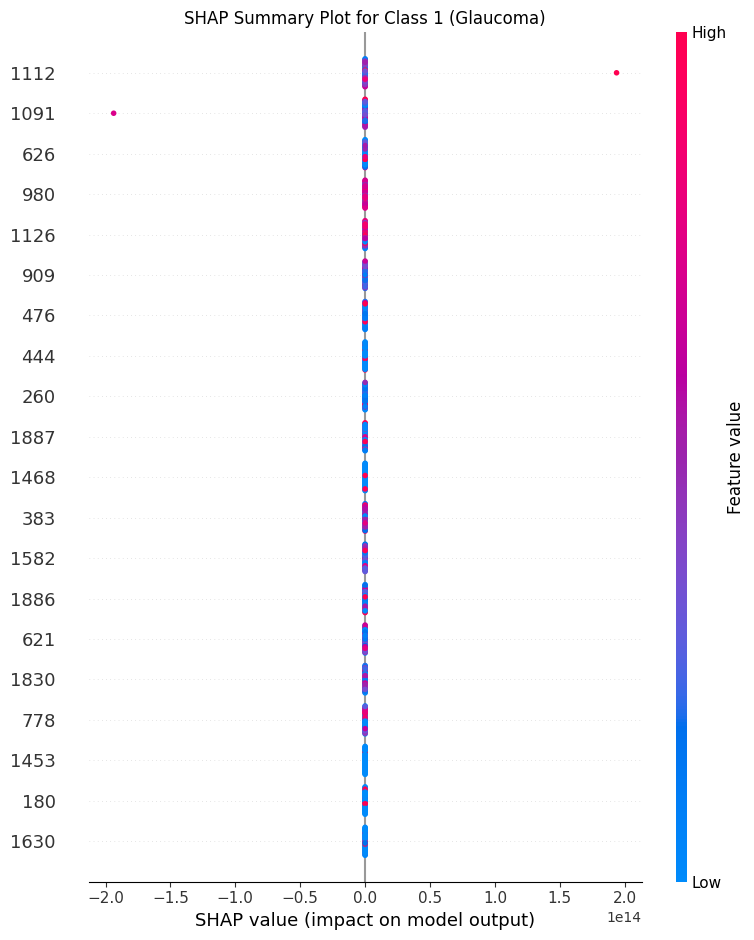

In [16]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import pandas as pd
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import shap
import copy

# -----------------------------
# 1. Load ORIGA Features and Oversample
# -----------------------------
# Load ORIGA CSV; it should have columns '0', '1', ... '2047', 'Label'
origa_df = pd.read_csv("D:\\ProjectML2 - Glaucoma\\origa_resnet_features.csv")
print("ORIGA columns:", origa_df.columns)

X_origa = origa_df.drop(columns=["Label"]).values   # shape: (num_samples, 2048)
y_origa = origa_df["Label"].values                  # shape: (num_samples,)

print("Original ORIGA distribution:", np.bincount(y_origa))  # e.g., [482, 168]

# Oversample using RandomOverSampler
ros = RandomOverSampler(random_state=42)
X_origa_os, y_origa_os = ros.fit_resample(X_origa, y_origa)
print("Oversampled ORIGA distribution:", np.bincount(y_origa_os))  # Should be balanced, e.g., [482, 482]

# Convert oversampled arrays to tensors
X_origa_os_tensor = torch.tensor(X_origa_os, dtype=torch.float32)
y_origa_os_tensor = torch.tensor(y_origa_os, dtype=torch.long)

# Create DataLoader for oversampled data
batch_size = 32
os_dataset = TensorDataset(X_origa_os_tensor, y_origa_os_tensor)
os_loader = DataLoader(os_dataset, batch_size=batch_size, shuffle=True)

# Also prepare a tensor for the original ORIGA set (for evaluation)
X_origa_tensor = torch.tensor(X_origa, dtype=torch.float32)

# -----------------------------
# 2. Define Model Components
# -----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Feature Extractor: maps 2048-D to 512-D
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim=2048):
        super(FeatureExtractor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.LayerNorm(512),  # Better with small batches
            nn.ReLU(),
            nn.Dropout(0.2)
        )
    def forward(self, x):
        return self.net(x)

# Label Predictor: maps 512-D to 2 classes
class LabelPredictor(nn.Module):
    def __init__(self, input_dim=512):
        super(LabelPredictor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
    def forward(self, x):
        return self.net(x)

# Instantiate models
feature_extractor = FeatureExtractor().to(device)
label_predictor = LabelPredictor().to(device)

# -----------------------------
# 3. Freeze the Feature Extractor
# -----------------------------
for param in feature_extractor.parameters():
    param.requires_grad = False

# -----------------------------
# 4. Define Focal Loss (Best Hyperparameters: alpha=2.0, gamma=3)
# -----------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=2.0, gamma=3, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
    def forward(self, inputs, targets):
        ce_loss = nn.CrossEntropyLoss(reduction='none')(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * ((1 - pt) ** self.gamma) * ce_loss
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

ft_criterion = FocalLoss(alpha=2.0, gamma=3, reduction='mean')

# -----------------------------
# 5. Ensemble Fine-Tuning on Oversampled ORIGA
# -----------------------------
num_ft_epochs = 5
num_models = 3  # Ensemble size
ensemble_models = []
original_label_predictor = copy.deepcopy(label_predictor)

print("\n--- Ensemble Fine-Tuning ---")
for model_idx in range(num_models):
    torch.manual_seed(42 + model_idx)
    model_ft = copy.deepcopy(original_label_predictor).to(device)
    optimizer_ft = optim.Adam(model_ft.parameters(), lr=1e-4)
    
    print(f"\n--- Fine-Tuning Model {model_idx+1}/{num_models} ---")
    for epoch in range(1, num_ft_epochs + 1):
        model_ft.train()
        running_loss = 0.0
        for X_batch, y_batch in os_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            with torch.no_grad():
                features = feature_extractor(X_batch)
            outputs = model_ft(features)
            loss = ft_criterion(outputs, y_batch)
            
            optimizer_ft.zero_grad()
            loss.backward()
            optimizer_ft.step()
            running_loss += loss.item()
        avg_loss = running_loss / len(os_loader)
        print(f"[Model {model_idx+1} Epoch {epoch}/{num_ft_epochs}] Loss: {avg_loss:.4f}")
    ensemble_models.append(model_ft)

# -----------------------------
# 6. Ensemble Prediction on Original ORIGA
# -----------------------------
def ensemble_predict(models, feature_extractor, X_tensor):
    feature_extractor.eval()
    for model in models:
        model.eval()
    with torch.no_grad():
        feats = feature_extractor(X_tensor.to(device))
        all_probs = []
        for model in models:
            logits = model(feats)
            probs = torch.softmax(logits, dim=1)
            all_probs.append(probs)
        avg_probs = torch.stack(all_probs, dim=0).mean(dim=0)
        preds = avg_probs.argmax(dim=1)
    return preds.cpu().numpy()

ensemble_preds = ensemble_predict(ensemble_models, feature_extractor, X_origa_tensor)
print("Ensemble ORIGA Accuracy:", accuracy_score(y_origa, ensemble_preds))
print("\nEnsemble Classification Report:\n", classification_report(y_origa, ensemble_preds))
print("Ensemble Confusion Matrix:\n", confusion_matrix(y_origa, ensemble_preds))

# -----------------------------
# 7. SHAP Error Analysis on Misclassified Examples (Using KernelExplainer)
# -----------------------------
# We'll use one of the ensemble models (e.g., ensemble_models[1]) as our best model.
best_model = ensemble_models[1]
best_model.eval()
feature_extractor.eval()

# For SHAP, summarize the background data using k-means to improve numerical stability
background_idx = np.random.choice(len(X_origa_os_tensor), size=200, replace=False)
background = X_origa_os_tensor[background_idx].cpu().numpy()  # Shape: (200, 2048)
background_summary = shap.kmeans(background, 10)  # Summarize into 10 clusters

# Define a prediction function that takes a NumPy array of raw ORIGA features,
# passes them through the frozen feature_extractor and the best model,
# and returns class probabilities.
def predict_fn(x):
    x_tensor = torch.tensor(x, dtype=torch.float32).to(device)
    with torch.no_grad():
        feats = feature_extractor(x_tensor)
        logits = best_model(feats)
        probs = torch.softmax(logits, dim=1)
    return probs.cpu().numpy()

# Debug: Test the predict_fn with the background data
background_probs = predict_fn(background)
print("Background prediction shape:", background_probs.shape)  # Should be (200, 2)

# Create a KernelExplainer using the summarized background
explainer = shap.KernelExplainer(predict_fn, background_summary)

# Select a subset of ORIGA data for SHAP analysis (e.g., 50 samples)
test_idx = np.random.choice(len(X_origa), size=50, replace=False)
X_shap = X_origa[test_idx]  # Shape: (50, 2048)
print("X_shap shape:", X_shap.shape)

# Debug: Test the predict_fn with X_shap
X_shap_probs = predict_fn(X_shap)
print("X_shap prediction shape:", X_shap_probs.shape)  # Should be (50, 2)

# Compute SHAP values on this subset
# For binary classification, shap_values should be a list: [shap_values_class0, shap_values_class1]
# Since KernelExplainer might return a 3D array, we'll handle it explicitly
shap_values = explainer.shap_values(X_shap, nsamples=100)

# Debug: Check the structure of SHAP values
print("SHAP values type:", type(shap_values))
if isinstance(shap_values, np.ndarray):
    print("SHAP values shape:", shap_values.shape)  # Expected: (50, 2048, 2)
    # Convert to the expected list format: [shap_values_class0, shap_values_class1]
    shap_values = [shap_values[:, :, 0], shap_values[:, :, 1]]
else:
    print("SHAP values length (number of classes):", len(shap_values))

# Debug: Check the shapes after conversion
print("SHAP values length (number of classes):", len(shap_values))  # Should be 2
print("SHAP values shape for class 0:", shap_values[0].shape)  # Should be (50, 2048)
print("SHAP values shape for class 1:", shap_values[1].shape)  # Should be (50, 2048)

# Extract SHAP values for class 1 (glaucoma)
shap_values_class1 = shap_values[1]  # Shape should be (50, 2048)

# Verify that the number of samples matches
assert X_shap.shape[0] == shap_values_class1.shape[0], \
    f"Number of samples in X_shap ({X_shap.shape[0]}) and SHAP values ({shap_values_class1.shape[0]}) must match!"

# Dynamically create feature names based on the number of features
num_features = X_shap.shape[1]  # Should be 2048
feature_names = [str(i) for i in range(num_features)]

# Plot the SHAP summary plot for class 1 (glaucoma)
shap.summary_plot(shap_values_class1, X_shap, feature_names=feature_names, show=False)
plt.title("SHAP Summary Plot for Class 1 (Glaucoma)")
plt.tight_layout()
plt.show()

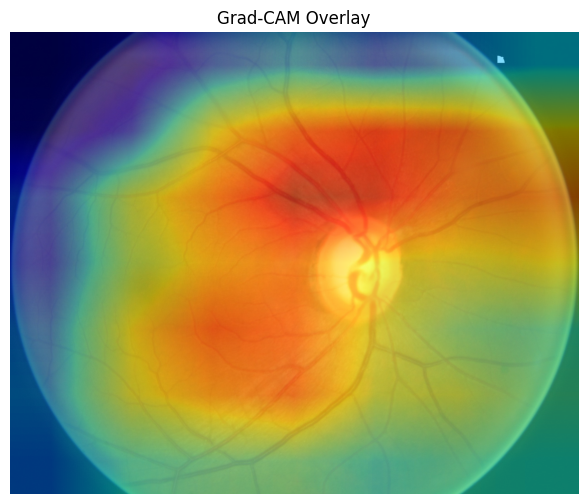

In [19]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

# Ensure device is defined
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load a pre-trained ResNet50 (with pretrained weights) for Grad-CAM demonstration.
# (This is separate from your extracted features used in DANN.)
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1).to(device)
resnet.eval()

# Choose a target convolutional layer for Grad-CAM.
target_layer = resnet.layer4[-1]

# Register hooks to extract features and gradients.
activations = {}
gradients = {}

def forward_hook(module, input, output):
    activations["value"] = output

def full_backward_hook(module, grad_input, grad_output):
    # We capture the gradient w.r.t. the module's output
    gradients["value"] = grad_output[0]

hook_handle_forward = target_layer.register_forward_hook(forward_hook)
hook_handle_backward = target_layer.register_full_backward_hook(full_backward_hook)


# Define image transformation.
transform_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Use your provided image path:
img_path = r"D:\ProjectML2 - Glaucoma\Dataset\ORIGA-1\Images\001.jpg"
img = Image.open(img_path).convert("RGB")
input_tensor = transform_img(img).unsqueeze(0).to(device)

# Forward pass.
output = resnet(input_tensor)
pred_class = output.argmax(dim=1).item()

# Backward pass: Compute gradient for the predicted class.
resnet.zero_grad()
score = output[0, pred_class]
score.backward()

# Compute Grad-CAM.
act = activations["value"].detach().cpu().squeeze(0)
grad = gradients["value"].detach().cpu().squeeze(0)
weights = grad.mean(dim=(1, 2), keepdim=True)
cam = (weights * act).sum(0)
cam = F.relu(cam)
cam = cam - cam.min()
cam = cam / (cam.max() + 1e-8)
cam = cv2.resize(cam.numpy(), (img.width, img.height))

plt.figure(figsize=(8,6))
plt.imshow(img)
plt.imshow(cam, cmap='jet', alpha=0.5)
plt.title("Grad-CAM Overlay")
plt.axis("off")
plt.show()

# Remove hooks when done.
hook_handle_forward.remove()
hook_handle_backward.remove()


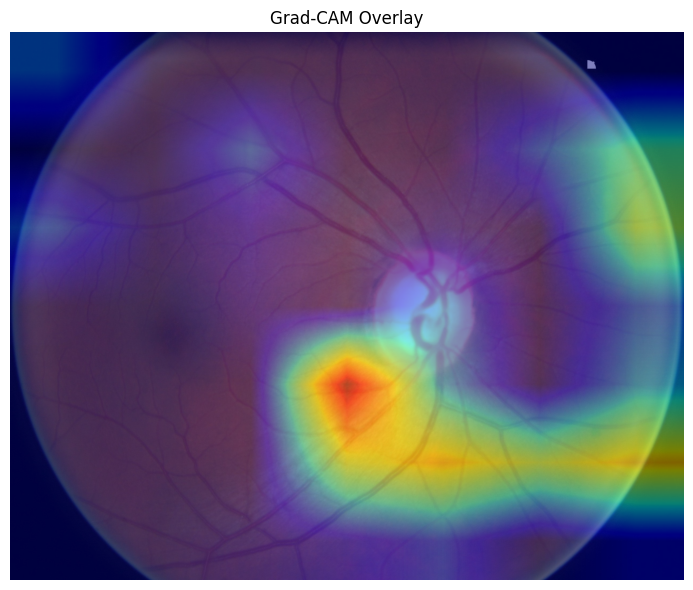

In [25]:
# Rewriting the full Grad-CAM code using ResNet50 + ORIGA image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 1. Feature Extractor that returns both conv maps and 512D vector
class FullFeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
        self.backbone = nn.Sequential(
            resnet.conv1,
            resnet.bn1,
            resnet.relu,
            resnet.maxpool,
            resnet.layer1,
            resnet.layer2,
            resnet.layer3,
            resnet.layer4
        )
        self.pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(2048, 512)
        self.relu = nn.ReLU()

    def forward(self, x):
        conv_feat = self.backbone(x)
        pooled = self.pool(conv_feat).view(conv_feat.size(0), -1)
        final_feat = self.relu(self.fc(pooled))
        return conv_feat, final_feat

# 2. Label Predictor for classification
class LabelPredictor(nn.Module):
    def __init__(self):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.Linear(512, 100),
            nn.ReLU(),
            nn.Linear(100, 2)
        )
    def forward(self, x):
        return self.classifier(x)

# 3. Grad-CAM extractor with hooks
class GradCAMExtractor:
    def __init__(self, feature_extractor, label_predictor, target_layer):
        self.feature_extractor = feature_extractor
        self.label_predictor = label_predictor
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()

    def forward(self, x):
        feats_4d, feats_2d = self.feature_extractor(x)
        logits = self.label_predictor(feats_2d)
        return feats_4d, logits

    def generate_cam(self, x, class_idx=None):
        _, logits = self.forward(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        score = logits[:, class_idx]
        self.feature_extractor.zero_grad()
        self.label_predictor.zero_grad()
        score.backward(retain_graph=True)
        pooled_grads = self.gradients.mean(dim=(2, 3), keepdim=True)
        weighted_feats = pooled_grads * self.activations
        cam = weighted_feats.sum(dim=1).squeeze()
        cam = F.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam.cpu().numpy()

# 4. Image transform for ResNet
transform_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# 5. Load ORIGA sample image
img_path = "D:/ProjectML2 - Glaucoma/Dataset/ORIGA-1/Images/001.jpg"
img = Image.open(img_path).convert("RGB")
input_tensor = transform_img(img).unsqueeze(0).to(device)

# 6. Initialize models and GradCAM
feature_extractor_cam = FullFeatureExtractor().to(device)
label_predictor_cam = LabelPredictor().to(device)
target_layer = feature_extractor_cam.backbone[-1][-1]
gradcam = GradCAMExtractor(feature_extractor_cam, label_predictor_cam, target_layer)

# 7. Generate and plot Grad-CAM
_ = gradcam.forward(input_tensor)
cam = gradcam.generate_cam(input_tensor)
cam_resized = cv2.resize(cam, (img.width, img.height))

plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.imshow(cam_resized, cmap='jet', alpha=0.5)
plt.title("Grad-CAM Overlay")
plt.axis("off")
plt.tight_layout()
plt.show()


## ACRIMA

In [30]:
import os

acrima_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima"
print("Contents of Acrima folder:")
print(os.listdir(acrima_path)[:10])  # show only first 10 items


Contents of Acrima folder:
['acrima_metadata.csv', 'acrima_metadata_updated.csv', 'images', 'test', 'train']


In [31]:
import pandas as pd

meta_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
df = pd.read_csv(meta_path)
print(df.head())
print(df.columns)


             Filename     Label  Split  \
0  Im310_g_ACRIMA.jpg  Glaucoma  train   
1  Im311_g_ACRIMA.jpg  Glaucoma  train   
2  Im312_g_ACRIMA.jpg  Glaucoma  train   
3  Im313_g_ACRIMA.jpg  Glaucoma  train   
4  Im314_g_ACRIMA.jpg  Glaucoma  train   

                                           ImagePath  
0  D:\ProjectML2 - Glaucoma\Dataset\Acrima\train\...  
1  D:\ProjectML2 - Glaucoma\Dataset\Acrima\train\...  
2  D:\ProjectML2 - Glaucoma\Dataset\Acrima\train\...  
3  D:\ProjectML2 - Glaucoma\Dataset\Acrima\train\...  
4  D:\ProjectML2 - Glaucoma\Dataset\Acrima\train\...  
Index(['Filename', 'Label', 'Split', 'ImagePath'], dtype='object')


In [32]:
import pandas as pd

# Step 1: Load your ResNet features
features = pd.read_csv("acrima_resnet_features.csv")  # shape (N, 2048)

# Step 2: Load metadata
meta_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
meta = pd.read_csv(meta_path)

# Step 3: Encode labels
meta["LabelEncoded"] = meta["Label"].apply(lambda x: 1 if x.lower() == "glaucoma" else 0)

# Step 4: Sort both files by filename to align rows
meta_sorted = meta.sort_values("Filename").reset_index(drop=True)
features_sorted = features.sort_values(by=features.columns[0]).reset_index(drop=True)  # sort by first feature column

# Step 5: Check shape consistency
assert len(features_sorted) == len(meta_sorted), "Mismatch between features and metadata!"

# Step 6: Add labels to features
features_sorted["Label"] = meta_sorted["LabelEncoded"]

# Step 7: Save final file
features_sorted.to_csv("acrima_fused_features.csv", index=False)
print("✅ Saved: acrima_fused_features.csv")


✅ Saved: acrima_fused_features.csv


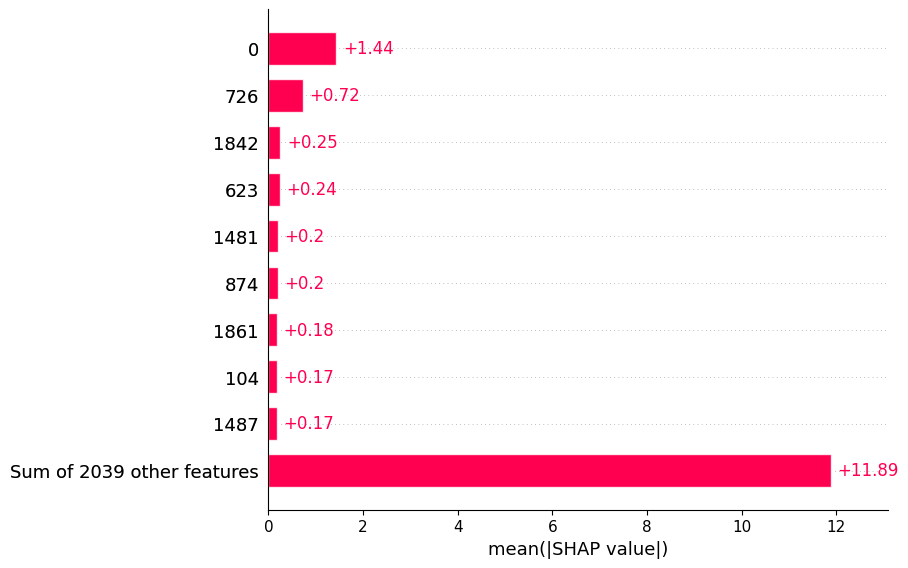

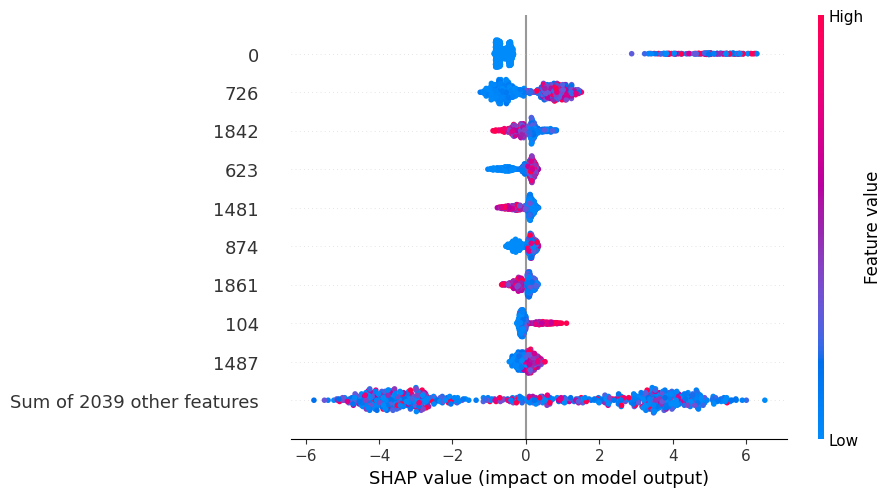

In [33]:
import shap
import pandas as pd
import xgboost

# Load features with labels
df = pd.read_csv("acrima_fused_features.csv")
X = df.drop(columns=["Label"])
y = df["Label"]

# Train model
model = xgboost.XGBClassifier()
model.fit(X, y)

# SHAP Explainability
explainer = shap.Explainer(model)
shap_values = explainer(X)

# SHAP Plots
shap.plots.bar(shap_values, max_display=10)
shap.plots.beeswarm(shap_values, max_display=10)


## drishti

In [35]:
import pandas as pd

meta_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_metadata.csv"
df = pd.read_csv(meta_path)
print("Columns:", df.columns)
print("Sample rows:")
print(df.head())


Columns: Index(['Filename', 'Label', 'ImagePath', 'CupMaskPath', 'DiscMaskPath', 'CDR',
       'CDR_Filled', 'CDR_Norm'],
      dtype='object')
Sample rows:
            Filename     Label  \
0  drishtiGS_001.png  Glaucoma   
1  drishtiGS_003.png  Glaucoma   
2  drishtiGS_005.png  Glaucoma   
3  drishtiGS_006.png  Glaucoma   
4  drishtiGS_011.png  Glaucoma   

                                           ImagePath  \
0  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
1  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
2  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
3  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
4  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   

                                         CupMaskPath  \
0  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
1  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
2  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
3  D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\Te...   
4  D:\ProjectML2 - Gl

In [36]:
import os
import pandas as pd
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from tqdm import tqdm

# Load metadata
metadata_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_metadata.csv"
df = pd.read_csv(metadata_path)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define ResNet50 model
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet.fc = nn.Identity()  # Remove final classification layer
resnet = resnet.to(device)
resnet.eval()

# Define image preprocessing
transform_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Store extracted features
all_features = []
all_labels = []
all_cdr = []
all_files = []

# Loop through rows
for _, row in tqdm(df.iterrows(), total=len(df)):
    image_path = row['ImagePath']
    label_str = row['Label']
    cdr_norm = row['CDR_Norm']
    filename = row['Filename']

    if not os.path.exists(image_path):
        continue

    try:
        # Load and preprocess image
        img = Image.open(image_path).convert("RGB")
        input_tensor = transform_img(img).unsqueeze(0).to(device)

        # Extract 2048D ResNet feature
        with torch.no_grad():
            feat = resnet(input_tensor).squeeze().cpu().numpy()

        # Append results
        all_features.append(feat)
        all_labels.append(1 if label_str.lower() == "glaucoma" else 0)
        all_cdr.append(cdr_norm)
        all_files.append(filename)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue

# Convert to DataFrame
features_df = pd.DataFrame(all_features)
features_df['CDR_Norm'] = all_cdr
features_df['Label'] = all_labels
features_df['Filename'] = all_files

# Save
output_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv"
features_df.to_csv(output_path, index=False)
print(f"\n✅ Saved to {output_path}")


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:07<00:00,  6.93it/s]



✅ Saved to D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:12:06] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Accuracy: 0.7272727272727273
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.33      0.40         3
           1       0.78      0.88      0.82         8

    accuracy                           0.73        11
   macro avg       0.64      0.60      0.61        11
weighted avg       0.70      0.73      0.71        11



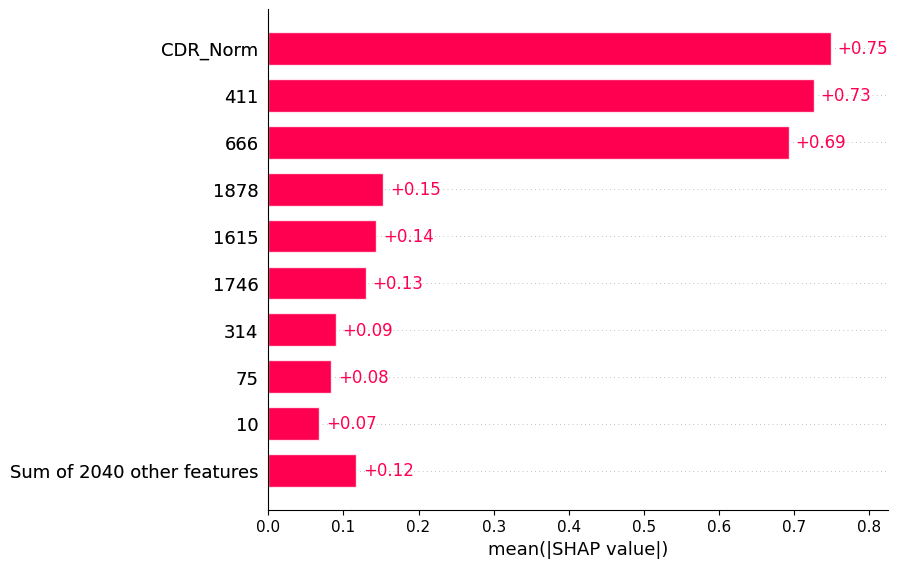

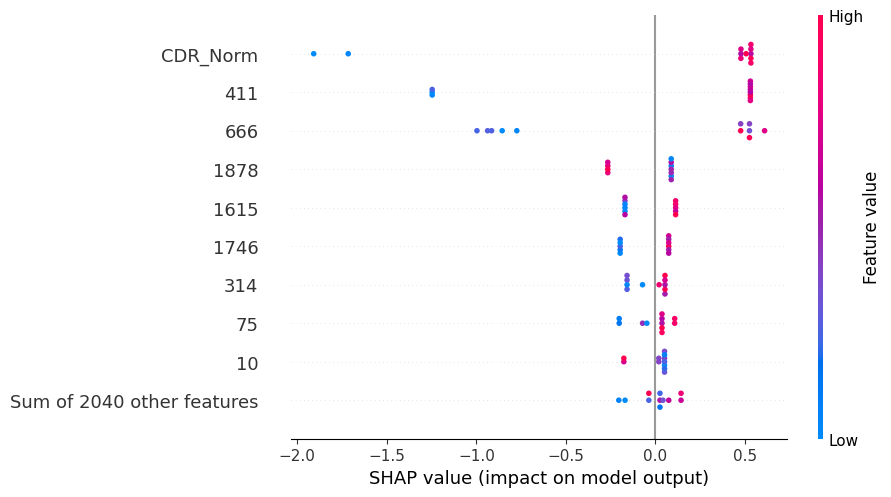

✅ SHAP plots saved: drishti_shap_bar.png, drishti_shap_beeswarm.png


In [38]:
import pandas as pd
import xgboost as xgb
import shap
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

# Load fused features
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv")

# Prepare data
X = df.drop(columns=["Label", "Filename"])  # includes 2048 ResNet + CDR_Norm
y = df["Label"]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
model.fit(X_train, y_train)

# Evaluate
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# SHAP Explainability
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot bar (top 10 features)
shap.plots.bar(shap_values, max_display=10)
plt.tight_layout()
plt.savefig("drishti_shap_bar.png")
plt.close()

# Plot beeswarm
shap.plots.beeswarm(shap_values, max_display=10)
plt.tight_layout()
plt.savefig("drishti_shap_beeswarm.png")
plt.close()

print("✅ SHAP plots saved: drishti_shap_bar.png, drishti_shap_beeswarm.png")


In [41]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb

# Load fused features
df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv")

X = df.drop(columns=["Label", "Filename"])
y = df["Label"]

# Convert to numpy
X = X.to_numpy()
y = y.to_numpy()

# Set up Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

accuracies = []
all_reports = []

print("📊 Stratified K-Fold Cross-Validation Results:\n")

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss")
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)

    print(f"Fold {fold} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, zero_division=0))

    accuracies.append(acc)
    all_reports.append(report)

# Summary
print("✅ Average Accuracy:", np.mean(accuracies))


📊 Stratified K-Fold Cross-Validation Results:

Fold 1 Accuracy: 0.8182
              precision    recall  f1-score   support

           0       0.67      0.67      0.67         3
           1       0.88      0.88      0.88         8

    accuracy                           0.82        11
   macro avg       0.77      0.77      0.77        11
weighted avg       0.82      0.82      0.82        11



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2 Accuracy: 0.7000
              precision    recall  f1-score   support

           0       0.40      1.00      0.57         2
           1       1.00      0.62      0.77         8

    accuracy                           0.70        10
   macro avg       0.70      0.81      0.67        10
weighted avg       0.88      0.70      0.73        10

Fold 3 Accuracy: 0.9000
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         2
           1       0.89      1.00      0.94         8

    accuracy                           0.90        10
   macro avg       0.94      0.75      0.80        10
weighted avg       0.91      0.90      0.89        10



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4 Accuracy: 0.8000
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.78      1.00      0.88         7

    accuracy                           0.80        10
   macro avg       0.89      0.67      0.69        10
weighted avg       0.84      0.80      0.76        10

Fold 5 Accuracy: 0.7000
              precision    recall  f1-score   support

           0       0.50      0.33      0.40         3
           1       0.75      0.86      0.80         7

    accuracy                           0.70        10
   macro avg       0.62      0.60      0.60        10
weighted avg       0.68      0.70      0.68        10

✅ Average Accuracy: 0.7836363636363636


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:17:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [42]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score
import xgboost as xgb

# Prepare Data
X = df.drop(columns=["Label", "Filename"]).values
y = df["Label"].values

# Define XGBoost model
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss")

# Define grid
param_grid = {
    'max_depth': [2, 3, 4],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100, 150],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Grid Search with 5-fold Stratified CV
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring=make_scorer(accuracy_score),
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Fit
grid_search.fit(X, y)

# Best Params & Accuracy
print("✅ Best Parameters:", grid_search.best_params_)
print("✅ Best Accuracy:", grid_search.best_score_)


Fitting 5 folds for each of 108 candidates, totalling 540 fits


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:18:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 2, 'n_estimators': 100, 'subsample': 0.8}
✅ Best Accuracy: 0.8436363636363635


In [43]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np

# Use best model
best_model = xgb.XGBClassifier(
    use_label_encoder=False,
    eval_metric="logloss",
    colsample_bytree=0.8,
    learning_rate=0.05,
    max_depth=2,
    n_estimators=100,
    subsample=0.8
)

# Stratified K-Fold Evaluation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
accuracies = []

for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    best_model.fit(X_train, y_train)
    y_pred = best_model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

    print(f"\n📊 Fold {fold} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred))

print(f"\n✅ Final Average Accuracy: {np.mean(accuracies):.4f}")


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:20:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



📊 Fold 1 Accuracy: 0.9091
              precision    recall  f1-score   support

           0       1.00      0.67      0.80         3
           1       0.89      1.00      0.94         8

    accuracy                           0.91        11
   macro avg       0.94      0.83      0.87        11
weighted avg       0.92      0.91      0.90        11


📊 Fold 2 Accuracy: 0.9000
              precision    recall  f1-score   support

           0       0.67      1.00      0.80         2
           1       1.00      0.88      0.93         8

    accuracy                           0.90        10
   macro avg       0.83      0.94      0.87        10
weighted avg       0.93      0.90      0.91        10



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:20:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:20:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



📊 Fold 3 Accuracy: 0.9000
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         2
           1       0.89      1.00      0.94         8

    accuracy                           0.90        10
   macro avg       0.94      0.75      0.80        10
weighted avg       0.91      0.90      0.89        10


📊 Fold 4 Accuracy: 0.8000
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.78      1.00      0.88         7

    accuracy                           0.80        10
   macro avg       0.89      0.67      0.69        10
weighted avg       0.84      0.80      0.76        10



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:20:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:20:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



📊 Fold 5 Accuracy: 0.8000
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.78      1.00      0.88         7

    accuracy                           0.80        10
   macro avg       0.89      0.67      0.69        10
weighted avg       0.84      0.80      0.76        10


✅ Final Average Accuracy: 0.8618


In [44]:
import joblib
joblib.dump(best_model, "drishti_final_xgboost.pkl")


['drishti_final_xgboost.pkl']

In [45]:
import joblib

# Save model
model_path = r"D:\ProjectML2 - Glaucoma\models\xgboost_drishti_model.pkl"
joblib.dump(best_model, model_path)
print(f"✅ XGBoost model saved to: {model_path}")


✅ XGBoost model saved to: D:\ProjectML2 - Glaucoma\models\xgboost_drishti_model.pkl


In [48]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# ✅ Make sure X is a NumPy array and y is a 1D array
# X = your input features (already used in training best_model)
# y = corresponding labels

# Explainer setup
explainer = shap.Explainer(best_model, X)
shap_values = explainer(X)

# Pick indices to visualize
example_indices = [0, 5, 10]  # change these as needed

# Save SHAP waterfall plots
output_dir = r"D:/ProjectML2 - Glaucoma/outputs/"
os.makedirs(output_dir, exist_ok=True)

for idx in example_indices:
    plt.figure()
    shap.plots.waterfall(shap_values[idx], max_display=10, show=False)
    plt.title(f"SHAP Waterfall Plot - Index {idx}")
    plt.savefig(f"{output_dir}/drishti_shap_waterfall_{idx}.png")
    plt.close()

print("✅ SHAP waterfall plots saved.")



✅ SHAP waterfall plots saved.


In [47]:
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay

# Predict probabilities
y_proba = best_model.predict_proba(X)[:, 1]

# ROC-AUC
fpr, tpr, _ = roc_curve(y, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure()
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name="XGBoost").plot()
plt.savefig(r"D:/ProjectML2 - Glaucoma/outputs/drishti_roc_curve.png")
plt.close()

# Confusion Matrix
y_pred = best_model.predict(X)
cm = confusion_matrix(y, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix - Drishti-GS")
plt.savefig(r"D:/ProjectML2 - Glaucoma/outputs/drishti_confusion_matrix.png")
plt.close()

print("✅ ROC curve and Confusion Matrix saved.")


✅ ROC curve and Confusion Matrix saved.


<Figure size 640x480 with 0 Axes>

In [50]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay

# ✅ Define true labels and predictions
y_true = y
y_pred = best_model.predict(X)
y_proba = best_model.predict_proba(X)[:, 1]

# 1️⃣ ROC Curve
fpr, tpr, _ = roc_curve(y_true, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.savefig("D:/ProjectML2 - Glaucoma/outputs/drishti_roc_curve.png")
plt.close()

# 2️⃣ Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.savefig("D:/ProjectML2 - Glaucoma/outputs/drishti_confusion_matrix.png")
plt.close()

print("✅ ROC Curve and Confusion Matrix saved successfully.")


✅ ROC Curve and Confusion Matrix saved successfully.


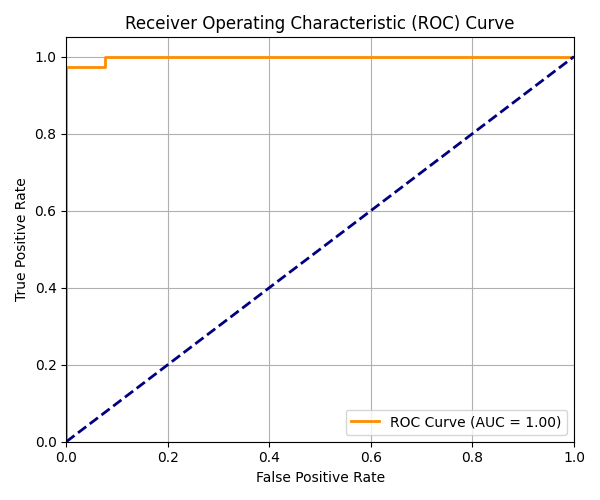

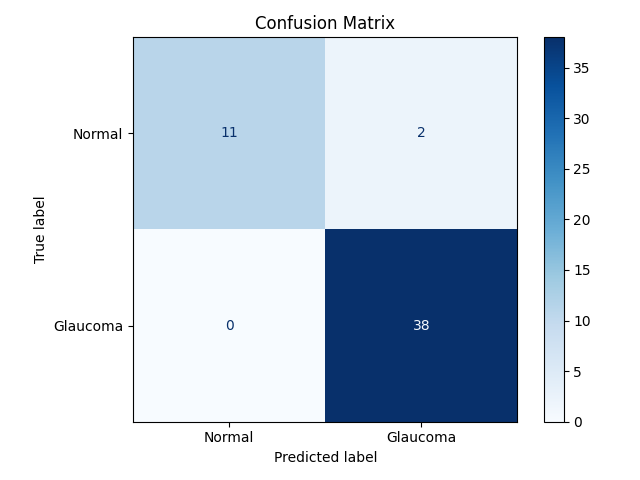

In [51]:
from IPython.display import Image, display

# Display saved ROC and Confusion Matrix
display(Image("D:/ProjectML2 - Glaucoma/outputs/drishti_roc_curve.png"))
display(Image("D:/ProjectML2 - Glaucoma/outputs/drishti_confusion_matrix.png"))


In [53]:
import os
import pandas as pd
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
from tqdm import tqdm

# Load metadata
acrima_metadata_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
df = pd.read_csv(acrima_metadata_path)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load pretrained ResNet50 model (remove final layer)
resnet = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
resnet.fc = nn.Identity()
resnet = resnet.to(device)
resnet.eval()

# Image preprocessing
transform_img = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Feature storage
all_features = []
all_labels = []
all_files = []

# Iterate through dataset
for _, row in tqdm(df.iterrows(), total=len(df)):
    image_path = row['ImagePath']
    label_str = row['Label']
    filename = row['Filename']

    if not os.path.exists(image_path):
        continue

    try:
        # Load and transform image
        img = Image.open(image_path).convert("RGB")
        input_tensor = transform_img(img).unsqueeze(0).to(device)

        # Extract features
        with torch.no_grad():
            feat = resnet(input_tensor).squeeze().cpu().numpy()

        # Store
        all_features.append(feat)
        all_labels.append(1 if label_str.lower() == "glaucoma" else 0)
        all_files.append(filename)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        continue

# Convert to DataFrame
features_df = pd.DataFrame(all_features)
features_df['Label'] = all_labels
features_df['Filename'] = all_files

# Save to CSV
output_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_resnet_features.csv"
features_df.to_csv(output_path, index=False)
print(f"\n✅ Saved to {output_path}")


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 705/705 [00:10<00:00, 64.92it/s]



✅ Saved to D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_resnet_features.csv


In [59]:
print(meta_df.columns.tolist())


['Filename', 'Label', 'Split', 'ImagePath']


In [70]:
import pandas as pd
import numpy as np

# Paths
resnet_feat_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_resnet_features.csv"
metadata_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
output_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"

# Load ResNet features
resnet_df = pd.read_csv(resnet_feat_path)
print("✅ Loaded ResNet features:", resnet_df.shape)

# Load metadata and clean column names
meta_df = pd.read_csv(metadata_path)
meta_df.columns = meta_df.columns.str.strip()
print("✅ Loaded Metadata:", meta_df.shape)

# Drop rows with missing labels in metadata
meta_df = meta_df.dropna(subset=["Label"])
print("✅ Metadata after dropping missing labels:", meta_df.shape)

# Merge features and metadata on 'Filename'
fused_df = pd.merge(resnet_df, meta_df[["Filename", "Label"]], on="Filename", how="inner")
print("✅ Fused Data Shape:", fused_df.shape)
print("Columns in fused_df:", fused_df.columns.tolist())  # Debug column names
print("Sample of fused_df:\n", fused_df.head())  # Debug data

# Convert labels from 'Label_y': 'glaucoma' -> 1, 'normal' -> 0
fused_df["Label"] = fused_df["Label_y"].str.strip().str.lower().map({"glaucoma": 1, "normal": 0})
fused_df = fused_df.dropna(subset=["Label"])  # Drop rows where conversion failed
fused_df["Label"] = fused_df["Label"].astype(int)

# Optionally drop unnecessary columns
fused_df = fused_df.drop(columns=["Label_x", "Label_y"])  # Remove original label columns

# Save fused features
fused_df.to_csv(output_path, index=False)
print(f"✅ Saved fused features to: {output_path}")

✅ Loaded ResNet features: (396, 2050)
✅ Loaded Metadata: (705, 4)
✅ Metadata after dropping missing labels: (705, 4)
✅ Fused Data Shape: (396, 2051)
Columns in fused_df: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '

In [69]:
print("Final columns:", fused_df.columns.tolist())
print("Final sample:\n", fused_df.head())
print("Final shape:", fused_df.shape)

Final columns: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '1

In [74]:
meta_df = pd.read_csv(r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv")
meta_df.columns = meta_df.columns.str.strip()
print("Original metadata class distribution:", meta_df["Label"].value_counts(dropna=False))

Original metadata class distribution: Label
Glaucoma       396
NonGlaucoma    309
Name: count, dtype: int64


In [82]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import pandas as pd
import os

# Paths
image_dir = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\Images"  # Adjust to your image folder
metadata_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
resnet_feat_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_resnet_features.csv"

# Load ResNet50
model = models.resnet50(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])  # Remove final FC layer
model.eval()

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load metadata
meta_df = pd.read_csv(metadata_path)
meta_df.columns = meta_df.columns.str.strip()

# Extract features
features_list = []
for filename in meta_df["Filename"]:
    img_path = os.path.join(image_dir, filename)
    if not os.path.exists(img_path):
        print(f"Warning: {img_path} not found")
        continue
    img = Image.open(img_path).convert("RGB")
    img_t = transform(img).unsqueeze(0)
    
    with torch.no_grad():
        features = model(img_t).flatten().numpy()  # 2048 features
    features_list.append([filename] + features.tolist())

# Save to CSV
columns = ["Filename"] + [str(i) for i in range(2048)]
resnet_df = pd.DataFrame(features_list, columns=columns)
resnet_df.to_csv(resnet_feat_path, index=False)
print("✅ New ResNet features saved:", resnet_df.shape)

D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ New ResNet features saved: (705, 2049)


In [83]:
import pandas as pd
import numpy as np

# Paths
resnet_feat_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_resnet_features.csv"
metadata_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_metadata_updated.csv"
output_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"

# Load ResNet features
resnet_df = pd.read_csv(resnet_feat_path)
print("✅ Loaded ResNet features:", resnet_df.shape)
print("ResNet filenames sample:", resnet_df["Filename"].head())

# Load metadata and clean column names
meta_df = pd.read_csv(metadata_path)
meta_df.columns = meta_df.columns.str.strip()
print("✅ Loaded Metadata:", meta_df.shape)
print("Original metadata labels:", meta_df["Label"].value_counts(dropna=False))
print("Metadata filenames sample:", meta_df["Filename"].head())

# Drop rows with missing labels in metadata
meta_df = meta_df.dropna(subset=["Label"])
print("✅ Metadata after dropping missing labels:", meta_df.shape)

# Check filename overlap
common_filenames = set(resnet_df["Filename"]).intersection(set(meta_df["Filename"]))
print("Number of common filenames:", len(common_filenames))

# Identify missing filenames
resnet_filenames = set(resnet_df["Filename"])
meta_filenames = set(meta_df["Filename"])
missing_in_resnet = meta_filenames - resnet_filenames
print("Filenames in meta_df but not in resnet_df:", len(missing_in_resnet))
print("Sample missing filenames:", list(missing_in_resnet)[:5])

# Merge features and metadata on 'Filename'
fused_df = pd.merge(resnet_df, meta_df[["Filename", "Label"]], on="Filename", how="inner")
print("✅ Fused Data Shape:", fused_df.shape)
print("Columns in fused_df:", fused_df.columns.tolist())
print("Sample of fused_df:\n", fused_df.head())

# Rename 'Label' column (no 'Label_x' or 'Label_y' since resnet_df has no 'Label')
if "Label_x" in fused_df.columns:
    fused_df = fused_df.drop(columns=["Label_x"])
if "Label_y" in fused_df.columns:
    fused_df = fused_df.rename(columns={"Label_y": "Label"})
# Note: If 'Label' is already correct from meta_df, no renaming needed

# Convert labels: 'Glaucoma' -> 1, 'NonGlaucoma' -> 0
print("Unique labels before mapping:", fused_df["Label"].unique())
fused_df["Label"] = fused_df["Label"].str.strip().map({"Glaucoma": 1, "NonGlaucoma": 0})
print("Labels after mapping (before dropna):", fused_df["Label"].value_counts(dropna=False))
fused_df = fused_df.dropna(subset=["Label"])  # Drop rows where conversion failed
fused_df["Label"] = fused_df["Label"].astype(int)

# Check final distribution
print("Final class distribution:", fused_df["Label"].value_counts())

# Save fused features
fused_df.to_csv(output_path, index=False)
print(f"✅ Saved fused features to: {output_path}")

✅ Loaded ResNet features: (705, 2049)
ResNet filenames sample: 0    Im310_g_ACRIMA.jpg
1    Im311_g_ACRIMA.jpg
2    Im312_g_ACRIMA.jpg
3    Im313_g_ACRIMA.jpg
4    Im314_g_ACRIMA.jpg
Name: Filename, dtype: object
✅ Loaded Metadata: (705, 4)
Original metadata labels: Label
Glaucoma       396
NonGlaucoma    309
Name: count, dtype: int64
Metadata filenames sample: 0    Im310_g_ACRIMA.jpg
1    Im311_g_ACRIMA.jpg
2    Im312_g_ACRIMA.jpg
3    Im313_g_ACRIMA.jpg
4    Im314_g_ACRIMA.jpg
Name: Filename, dtype: object
✅ Metadata after dropping missing labels: (705, 4)
Number of common filenames: 705
Filenames in meta_df but not in resnet_df: 0
Sample missing filenames: []
✅ Fused Data Shape: (705, 2050)
Columns in fused_df: ['Filename', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45

In [ ]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold, GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import shap
import joblib

# ----- Step 1: Load Fused Features for ACRIMA -----
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)

# Create a clean DataFrame:
# Assuming the first 2048 columns are ResNet features and 'Label' & 'Filename' follow.
# Check the fused_df shape: should be (n_samples, 2050) where 2050 = 2048 features + Filename + Label.
print("Fused Data Shape:", df.shape)

# Prepare feature matrix X and target vector y.
# Drop 'Filename' and 'Label' columns from X.
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# ----- Step 2: Stratified K-Fold Cross-Validation with XGBoost -----
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
accuracies = []

print("\n📊 Stratified K-Fold Evaluation for ACRIMA:")
for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
    
    model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss")
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)
    
    print(f"\nFold {fold} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred, zero_division=0))
    
avg_acc = np.mean(accuracies)
print(f"\n✅ Final Average Accuracy (CV): {avg_acc:.4f}")

# ----- Step 3: Hyperparameter Tuning with GridSearchCV -----
param_grid = {
    'max_depth': [2, 3, 4],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100, 150],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss")
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring="accuracy",
    cv=5,
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X, y)
print("\n✅ Best Hyperparameters:", grid_search.best_params_)
print("✅ Best CV Accuracy from Grid Search:", grid_search.best_score_)

# Save the best model
best_model = grid_search.best_estimator_
model_save_path = r"D:\ProjectML2 - Glaucoma\models\acrima_best_xgboost.pkl"
joblib.dump(best_model, model_save_path)
print("✅ Best model saved to:", model_save_path)

# ----- Step 4: SHAP Explainability -----
# Split data for SHAP visualization
X_train_shap, X_test_shap, y_train_shap, y_test_shap = train_test_split(X, y, test_size=0.2, random_state=42)
best_model.fit(X_train_shap, y_train_shap)

# Create SHAP explainer
explainer = shap.Explainer(best_model, X_train_shap.values)
shap_values = explainer(X_test_shap.values)

# Generate and save SHAP summary plots
plt.figure()
shap.summary_plot(shap_values, X_test_shap, max_display=10, show=False)
plt.tight_layout()
shap_summary_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png"
plt.savefig(shap_summary_path)
plt.close()

plt.figure()
shap.plots.beeswarm(shap_values, max_display=10, show=False)
plt.tight_layout()
shap_beeswarm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm.png"
plt.savefig(shap_beeswarm_path)
plt.close()

print("✅ SHAP plots saved at:")
print("   ", shap_summary_path)
print("   ", shap_beeswarm_path)

# ----- Step 5: ROC Curve and Confusion Matrix -----
y_true = y
y_pred = best_model.predict(X)
y_proba = best_model.predict_proba(X)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_true, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve")
plt.legend(loc="lower right")
plt.tight_layout()
roc_curve_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_roc_curve.png"
plt.savefig(roc_curve_path)
plt.close()

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix")
plt.tight_layout()
cm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_confusion_matrix.png"
plt.savefig(cm_path)
plt.close()

print("✅ ROC Curve and Confusion Matrix saved at:")
print("   ", roc_curve_path)
print("   ", cm_path)


Fused Data Shape: (705, 2050)

📊 Stratified K-Fold Evaluation for ACRIMA:


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:57:05] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Fold 1 Accuracy: 0.9078
              precision    recall  f1-score   support

           0       0.93      0.85      0.89        61
           1       0.89      0.95      0.92        80

    accuracy                           0.91       141
   macro avg       0.91      0.90      0.91       141
weighted avg       0.91      0.91      0.91       141



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:57:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Fold 2 Accuracy: 0.9007
              precision    recall  f1-score   support

           0       0.94      0.82      0.88        62
           1       0.87      0.96      0.92        79

    accuracy                           0.90       141
   macro avg       0.91      0.89      0.90       141
weighted avg       0.90      0.90      0.90       141



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:57:12] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



Fold 3 Accuracy: 0.9078
              precision    recall  f1-score   support

           0       0.90      0.89      0.89        62
           1       0.91      0.92      0.92        79

    accuracy                           0.91       141
   macro avg       0.91      0.91      0.91       141
weighted avg       0.91      0.91      0.91       141



D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [04:57:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [2]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import shap
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
print("Fused Data Shape:", df.shape)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split for early stopping
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define model with modern GPU support
xgb_model = xgb.XGBClassifier(
    tree_method="hist",       # Updated to 'hist'
    device="cuda",            # Explicitly use CUDA
    eval_metric="logloss",    # Keep logloss for binary classification
    early_stopping_rounds=10  # Early stopping
)

# Parameter grid for RandomizedSearchCV
param_dist = {
    'max_depth': [2, 3, 4],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [50, 100, 150],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_dist,
    n_iter=20,
    scoring="accuracy",
    cv=3,
    verbose=1,
    n_jobs=1  # Single job to avoid overloading
)

# Fit with evaluation set
random_search.fit(X_train, y_train, eval_set=[(X_val, y_val)], verbose=False)
best_model = random_search.best_estimator_
print("\n✅ Best Hyperparameters:", random_search.best_params_)
print("✅ Best CV Accuracy:", random_search.best_score_)

# Save model
model_save_path = r"D:\ProjectML2 - Glaucoma\models\acrima_best_xgboost.pkl"
joblib.dump(best_model, model_save_path)
print("✅ Best model saved to:", model_save_path)

# SHAP (subset for speed)
X_train_shap, X_test_shap, _, _ = train_test_split(X, y, test_size=0.2, random_state=42)
explainer = shap.Explainer(best_model, X_train_shap.values)
shap_values = explainer(X_test_shap.values[:50])  # Smaller batch
shap.summary_plot(shap_values, X_test_shap[:50], max_display=10, show=False)
plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png")
plt.close()

# ROC and Confusion Matrix
y_pred = best_model.predict(X)
y_proba = best_model.predict_proba(X)[:, 1]
fpr, tpr, _ = roc_curve(y, y_proba)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], linestyle='--')
plt.legend()
plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\acrima_roc_curve.png")
plt.close()

cm = confusion_matrix(y, y_pred)
disp = ConfusionMatrixDisplay(cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\acrima_confusion_matrix.png")
plt.close()

Fused Data Shape: (705, 2050)
Fitting 3 folds for each of 20 candidates, totalling 60 fits

✅ Best Hyperparameters: {'subsample': 0.8, 'n_estimators': 100, 'max_depth': 2, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
✅ Best CV Accuracy: 0.9095744680851064
✅ Best model saved to: D:\ProjectML2 - Glaucoma\models\acrima_best_xgboost.pkl


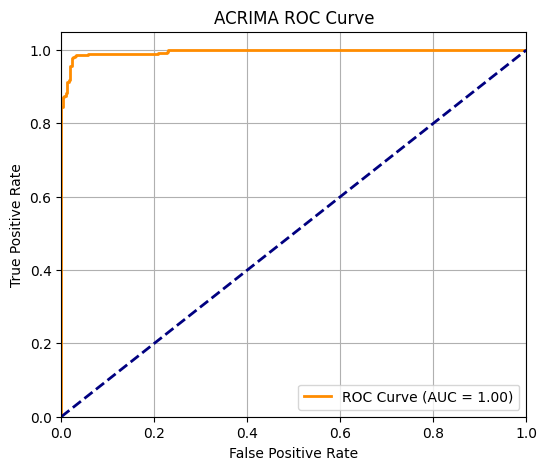

In [3]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Predict probabilities and compute ROC
y_proba = best_model.predict_proba(X)[:, 1]
fpr, tpr, _ = roc_curve(y, y_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

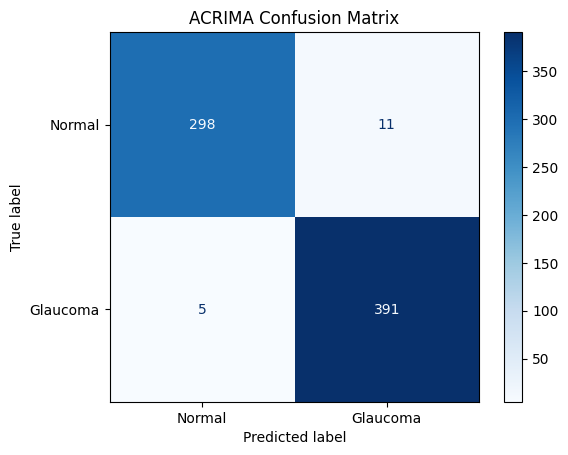

In [4]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict labels and compute confusion matrix
y_pred = best_model.predict(X)
cm = confusion_matrix(y, y_pred)

# Plot Confusion Matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix")
plt.show()

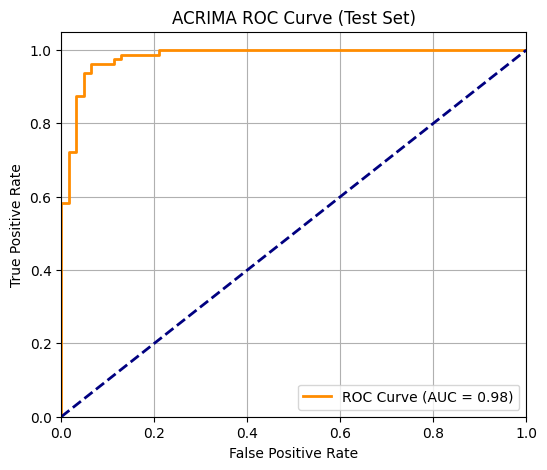

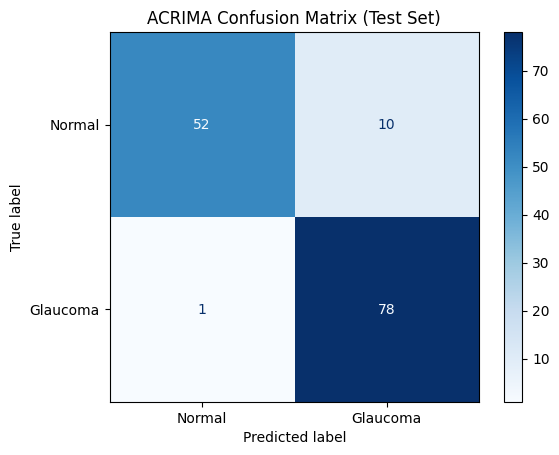

Test Set Accuracy: 0.9219858156028369

Classification Report:
               precision    recall  f1-score   support

      Normal       0.98      0.84      0.90        62
    Glaucoma       0.89      0.99      0.93        79

    accuracy                           0.92       141
   macro avg       0.93      0.91      0.92       141
weighted avg       0.93      0.92      0.92       141



In [5]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Define the model with the best hyperparameters
best_params = {
    'subsample': 0.8,
    'n_estimators': 100,
    'max_depth': 2,
    'learning_rate': 0.1,
    'colsample_bytree': 1.0,
    'tree_method': 'hist',
    'device': 'cuda',
    'eval_metric': 'logloss'
}

model = xgb.XGBClassifier(**best_params)

# Train the model on the training set
model.fit(X_train, y_train)

# Evaluate on the test set
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve (Test Set)")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix (Test Set)")
plt.show()

# Print additional metrics
from sklearn.metrics import accuracy_score, classification_report
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=["Normal", "Glaucoma"]))

Scale Pos Weight: 0.7791798107255521


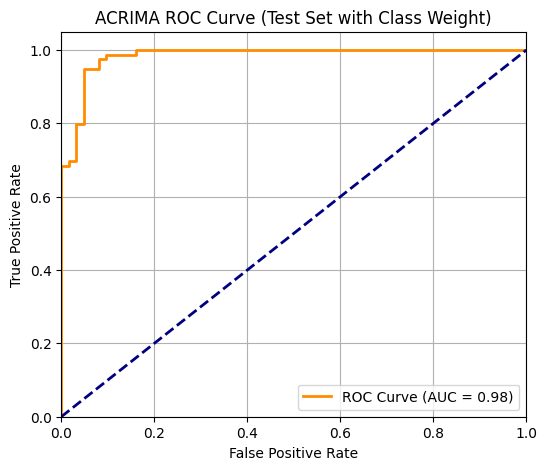

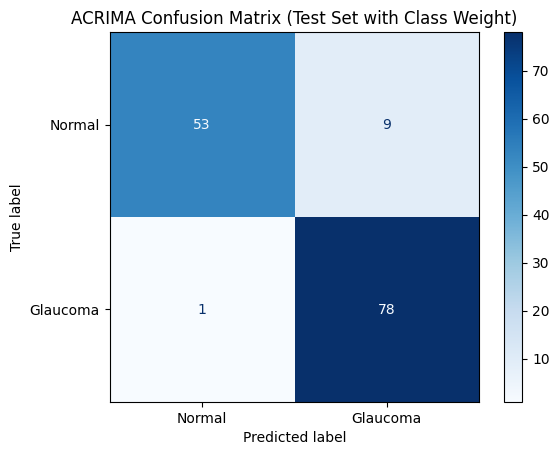

Test Set Accuracy: 0.9290780141843972

Classification Report:
               precision    recall  f1-score   support

      Normal       0.98      0.85      0.91        62
    Glaucoma       0.90      0.99      0.94        79

    accuracy                           0.93       141
   macro avg       0.94      0.92      0.93       141
weighted avg       0.93      0.93      0.93       141



In [6]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
import matplotlib.pyplot as plt
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Calculate scale_pos_weight to handle class imbalance
# scale_pos_weight = number of negative samples / number of positive samples
scale_pos_weight = sum(y_train == 0) / sum(y_train == 1)  # Normal / Glaucoma
print(f"Scale Pos Weight: {scale_pos_weight}")

# Define the model with the best hyperparameters and scale_pos_weight
best_params = {
    'subsample': 0.8,
    'n_estimators': 100,
    'max_depth': 2,
    'learning_rate': 0.1,
    'colsample_bytree': 1.0,
    'tree_method': 'hist',
    'device': 'cuda',
    'eval_metric': 'logloss',
    'scale_pos_weight': scale_pos_weight  # Add class weight
}

model = xgb.XGBClassifier(**best_params)

# Train the model on the training set
model.fit(X_train, y_train)

# Evaluate on the test set
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve (Test Set with Class Weight)")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix (Test Set with Class Weight)")
plt.show()

# Print metrics
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=["Normal", "Glaucoma"]))

Class distribution before SMOTE: [247 317]
Class distribution after SMOTE: [317 317]


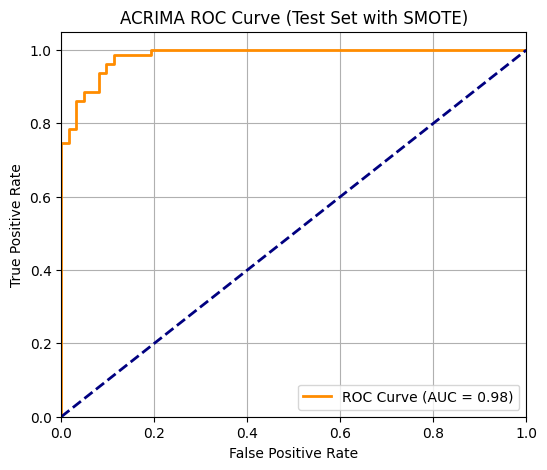

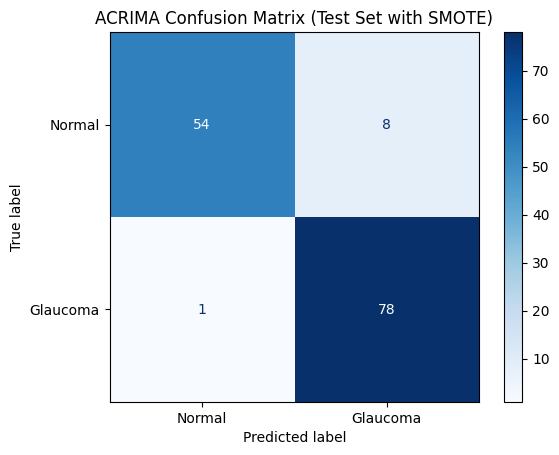

Test Set Accuracy: 0.9361702127659575

Classification Report:
               precision    recall  f1-score   support

      Normal       0.98      0.87      0.92        62
    Glaucoma       0.91      0.99      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.93      0.93       141
weighted avg       0.94      0.94      0.94       141



In [7]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the new class distribution after SMOTE
print("Class distribution before SMOTE:", np.bincount(y_train))
print("Class distribution after SMOTE:", np.bincount(y_train_resampled))

# Define the model with the best hyperparameters
best_params = {
    'subsample': 0.8,
    'n_estimators': 100,
    'max_depth': 2,
    'learning_rate': 0.1,
    'colsample_bytree': 1.0,
    'tree_method': 'hist',
    'device': 'cuda',
    'eval_metric': 'logloss'
}

model = xgb.XGBClassifier(**best_params)

# Train the model on the resampled training set
model.fit(X_train_resampled, y_train_resampled)

# Evaluate on the test set (unchanged)
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve (Test Set with SMOTE)")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix (Test Set with SMOTE)")
plt.show()

# Print metrics
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=["Normal", "Glaucoma"]))

In [9]:
import matplotlib.pyplot as plt
import shap
import joblib
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the best model if not already loaded
model_save_path = r"D:\ProjectML2 - Glaucoma\models\acrima_best_xgboost.pkl"
best_model = joblib.load(model_save_path)

# Prepare the data for SHAP visualization using the fused features
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split data for SHAP visualization (e.g., 80-20 train-test split)
X_train_shap, X_test_shap, y_train_shap, y_test_shap = train_test_split(X, y, test_size=0.2, random_state=42)

# Retrain best model on the SHAP training split with an eval_set
best_model.fit(X_train_shap, y_train_shap, eval_set=[(X_test_shap, y_test_shap)], verbose=False)

# Create a SHAP explainer using the training data
explainer = shap.Explainer(best_model, X_train_shap.values)
shap_values = explainer(X_test_shap.values)

# Generate and save a SHAP summary plot (bar plot of mean absolute SHAP values)
plt.figure()
shap.summary_plot(shap_values, X_test_shap, max_display=10, show=False)
plt.tight_layout()
shap_summary_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png"
plt.savefig(shap_summary_path)
plt.close()

# Generate and save a SHAP beeswarm plot
plt.figure()
shap.plots.beeswarm(shap_values, max_display=10, show=False)
plt.tight_layout()
shap_beeswarm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm.png"
plt.savefig(shap_beeswarm_path)
plt.close()

print("✅ SHAP plots saved:")
print("   Summary plot:", shap_summary_path)
print("   Beeswarm plot:", shap_beeswarm_path)


✅ SHAP plots saved:
   Summary plot: D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png
   Beeswarm plot: D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm.png


Class distribution before SMOTE: [247 317]
Class distribution after SMOTE: [317 317]


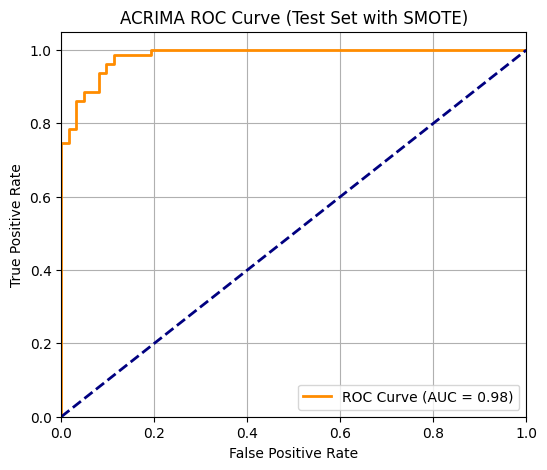

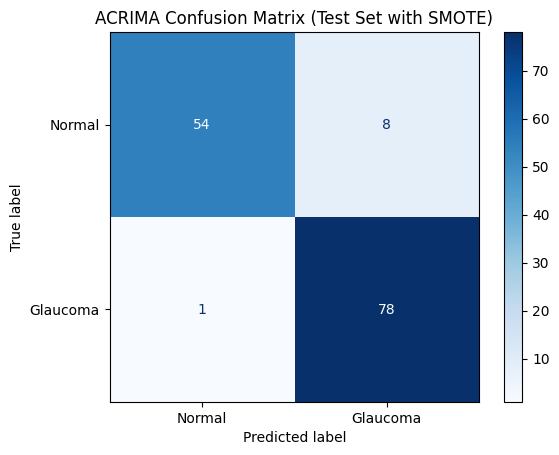

Test Set Accuracy: 0.9361702127659575

Classification Report:
               precision    recall  f1-score   support

      Normal       0.98      0.87      0.92        62
    Glaucoma       0.91      0.99      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.93      0.93       141
weighted avg       0.94      0.94      0.94       141



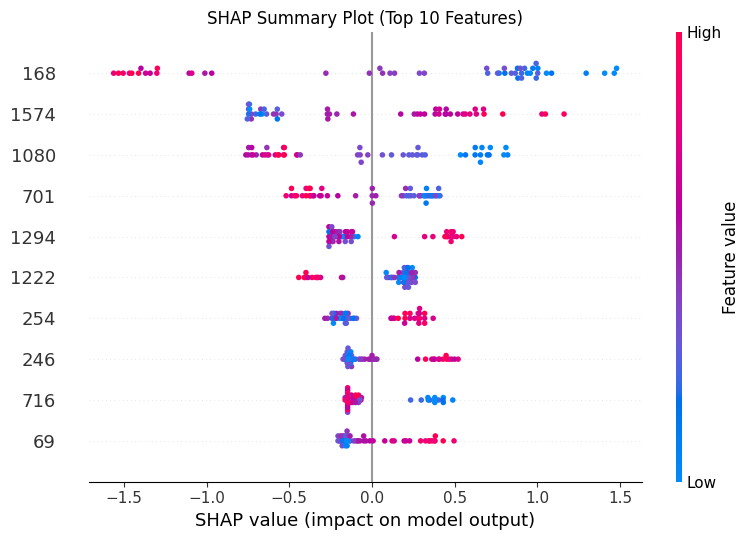

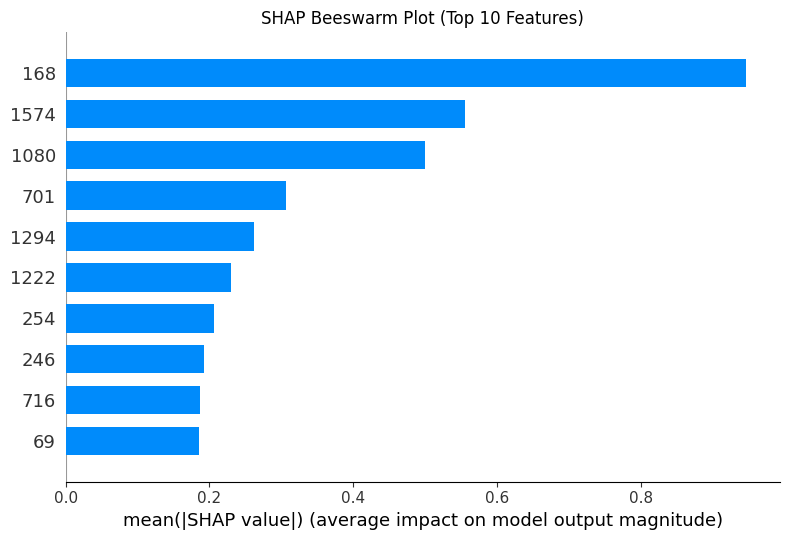

In [11]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import shap
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check class distribution
print("Class distribution before SMOTE:", np.bincount(y_train))
print("Class distribution after SMOTE:", np.bincount(y_train_resampled))

# Define the model with the best hyperparameters
best_params = {
    'subsample': 0.8,
    'n_estimators': 100,
    'max_depth': 2,
    'learning_rate': 0.1,
    'colsample_bytree': 1.0,
    'tree_method': 'hist',
    'device': 'cuda',
    'eval_metric': 'logloss'
}

model = xgb.XGBClassifier(**best_params)

# Train the model on the resampled training set
model.fit(X_train_resampled, y_train_resampled)

# Evaluate on the test set
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve (Test Set with SMOTE)")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix (Test Set with SMOTE)")
plt.show()

# Print metrics
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=["Normal", "Glaucoma"]))

# -------------------------------
# SHAP Analysis
# -------------------------------

# Create SHAP explainer using the trained model
# Use a subset of the training data for the explainer to speed up computation
explainer = shap.Explainer(model, X_train_resampled)

# Compute SHAP values for the test set
# Use a subset of the test set to speed up computation (e.g., first 50 samples)
shap_values = explainer(X_test.values[:50])

# SHAP Summary Plot (Feature Importance)
plt.figure()
shap.summary_plot(shap_values, X_test.iloc[:50], max_display=10, show=False)
plt.title("SHAP Summary Plot (Top 10 Features)")
plt.tight_layout()
plt.show()

# SHAP Beeswarm Plot
plt.figure()
shap.summary_plot(shap_values, X_test.iloc[:50], plot_type="bar", max_display=10, show=False)
plt.title("SHAP Beeswarm Plot (Top 10 Features)")
plt.tight_layout()
plt.show()

# Optional: Save the plots
# shap.summary_plot(shap_values, X_test.iloc[:50], max_display=10, show=False)
# plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary_smote.png")
# plt.close()
#
# shap.summary_plot(shap_values, X_test.iloc[:50], plot_type="bar", max_display=10, show=False)
# plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm_smote.png")
# plt.close()

In [12]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import shap
import joblib

# Load data
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Apply SMOTE to the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check class distribution
print("Class distribution before SMOTE:", np.bincount(y_train))
print("Class distribution after SMOTE:", np.bincount(y_train_resampled))

# Define the model with the best hyperparameters
best_params = {
    'subsample': 0.8,
    'n_estimators': 100,
    'max_depth': 2,
    'learning_rate': 0.1,
    'colsample_bytree': 1.0,
    'tree_method': 'hist',
    'device': 'cuda',
    'eval_metric': 'logloss'
}

model = xgb.XGBClassifier(**best_params)

# Train the model on the resampled training set
model.fit(X_train_resampled, y_train_resampled)

# Evaluate on the test set
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ACRIMA ROC Curve (Test Set with SMOTE)")
plt.legend(loc="lower right")
plt.grid(True)
roc_curve_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_roc_curve_smote.png"
plt.savefig(roc_curve_path)
plt.close()

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap=plt.cm.Blues)
plt.title("ACRIMA Confusion Matrix (Test Set with SMOTE)")
cm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_confusion_matrix_smote.png"
plt.savefig(cm_path)
plt.close()

# Print ROC and Confusion Matrix file paths
print("✅ ROC Curve and Confusion Matrix saved:")
print("    ", roc_curve_path)
print("    ", cm_path)

# Print metrics
print("Test Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=["Normal", "Glaucoma"]))

# SHAP Analysis
explainer = shap.Explainer(model, X_train_resampled)
shap_values = explainer(X_test.values[:50])

# SHAP Summary Plot
shap.summary_plot(shap_values, X_test.iloc[:50], max_display=10, show=False)
shap_summary_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary_smote.png"
plt.savefig(shap_summary_path)
plt.close()

# SHAP Beeswarm Plot
shap.summary_plot(shap_values, X_test.iloc[:50], plot_type="bar", max_display=10, show=False)
shap_beeswarm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm_smote.png"
plt.savefig(shap_beeswarm_path)
plt.close()

# Print SHAP file paths
print("✅ SHAP plots saved:")
print("    ", shap_summary_path)
print("    ", shap_beeswarm_path)

Class distribution before SMOTE: [247 317]
Class distribution after SMOTE: [317 317]
✅ ROC Curve and Confusion Matrix saved:
     D:\ProjectML2 - Glaucoma\outputs\acrima_roc_curve_smote.png
     D:\ProjectML2 - Glaucoma\outputs\acrima_confusion_matrix_smote.png
Test Set Accuracy: 0.9361702127659575

Classification Report:
               precision    recall  f1-score   support

      Normal       0.98      0.87      0.92        62
    Glaucoma       0.91      0.99      0.95        79

    accuracy                           0.94       141
   macro avg       0.94      0.93      0.93       141
weighted avg       0.94      0.94      0.94       141

✅ SHAP plots saved:
     D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary_smote.png
     D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm_smote.png


In [14]:
import matplotlib.pyplot as plt
import shap
import joblib
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the best model if not already loaded
model_save_path = r"D:\ProjectML2 - Glaucoma\models\acrima_best_xgboost.pkl"
best_model = joblib.load(model_save_path)

# Prepare the data for SHAP visualization using the fused features
fused_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
df = pd.read_csv(fused_path)

# Ensure only numeric features: drop 'Label' and 'Filename'
X = df.drop(columns=["Label", "Filename"])
y = df["Label"].astype(int)

# Convert X to numeric explicitly (this will drop non-numeric columns if any remain)
X = X.apply(pd.to_numeric, errors='raise')
print("✅ Feature dtypes after conversion:\n", X.dtypes)

# Split data for SHAP visualization (e.g., 80-20 train-test split)
X_train_shap, X_test_shap, y_train_shap, y_test_shap = train_test_split(X, y, test_size=0.2, random_state=42)

# Ensure the splits are numeric
X_train_shap = X_train_shap.astype(float)
X_test_shap = X_test_shap.astype(float)

# Retrain best model on the SHAP training split with an evaluation set
best_model.fit(X_train_shap, y_train_shap, eval_set=[(X_test_shap, y_test_shap)], verbose=False)

# Create a SHAP explainer using the training data
explainer = shap.Explainer(best_model, X_train_shap.values)
shap_values = explainer(X_test_shap.values)

# Generate and save a SHAP summary plot (bar plot of mean absolute SHAP values)
plt.figure()
shap.summary_plot(shap_values, X_test_shap, max_display=10, show=False)
plt.tight_layout()
shap_summary_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png"
plt.savefig(shap_summary_path)
plt.close()

# Generate and save a SHAP beeswarm plot
plt.figure()
shap.plots.beeswarm(shap_values, max_display=10, show=False)
plt.tight_layout()
shap_beeswarm_path = r"D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm.png"
plt.savefig(shap_beeswarm_path)
plt.close()

print("✅ SHAP plots saved:")
print("   Summary plot:", shap_summary_path)
print("   Beeswarm plot:", shap_beeswarm_path)


✅ Feature dtypes after conversion:
 0       float64
1       float64
2       float64
3       float64
4       float64
         ...   
2043    float64
2044    float64
2045    float64
2046    float64
2047    float64
Length: 2048, dtype: object
✅ SHAP plots saved:
   Summary plot: D:\ProjectML2 - Glaucoma\outputs\acrima_shap_summary.png
   Beeswarm plot: D:\ProjectML2 - Glaucoma\outputs\acrima_shap_beeswarm.png


In [18]:
import pandas as pd
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay

# ===== Step 1: Load Fused Feature CSVs =====
acrima_path = r"D:\ProjectML2 - Glaucoma\Dataset\Acrima\acrima_fused_features.csv"
drishti_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv"

df_A = pd.read_csv(acrima_path)
df_D = pd.read_csv(drishti_path)

# ===== Step 2: Preprocess (Drop non-numeric/object columns) =====
features_A = df_A.drop(columns=["Filename", "Label"], errors="ignore").iloc[:, :2048].astype("float32")
labels_A = df_A["Label"].astype(int)

features_D = df_D.drop(columns=["Filename", "Label", "CDR_Norm"], errors="ignore").iloc[:, :2048].astype("float32")
labels_D = df_D["Label"].astype(int)

# ===== Step 3: Train XGBoost on ACRIMA =====
model = xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42)
model.fit(features_A, labels_A)

# ===== Step 4: Predict and Evaluate on Drishti =====
pred_D = model.predict(features_D)
probs_D = model.predict_proba(features_D)[:, 1]

acc_cross = accuracy_score(labels_D, pred_D)
roc_cross = roc_auc_score(labels_D, probs_D)

print("✅ Cross-Dataset Evaluation")
print(f"Accuracy (Train ACRIMA → Test Drishti): {acc_cross * 100:.2f}%")
print(f"ROC-AUC Score: {roc_cross:.4f}")

# ===== Step 5: Plot ROC-AUC and Confusion Matrix =====
plt.figure()
RocCurveDisplay.from_predictions(labels_D, probs_D)
plt.title("ROC Curve (Train ACRIMA → Test Drishti)")
plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\roc_acrima_to_drishti.png")
plt.close()

cm = confusion_matrix(labels_D, pred_D)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Normal", "Glaucoma"])
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix (ACRIMA → Drishti)")
plt.savefig(r"D:\ProjectML2 - Glaucoma\outputs\cm_acrima_to_drishti.png")
plt.close()


D:\ProjectML2 - Glaucoma\pytorchGlaucoma\Lib\site-packages\xgboost\training.py:183: UserWarning: [14:05:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ Cross-Dataset Evaluation
Accuracy (Train ACRIMA → Test Drishti): 72.55%
ROC-AUC Score: 0.6559


<Figure size 640x480 with 0 Axes>

In [31]:
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split

# Paths
image_dir = "D:/ProjectML2 - Glaucoma/Dataset/Acrima/images"
metadata_path = "D:/ProjectML2 - Glaucoma/Dataset/Acrima/acrima_metadata_updated.csv"
model_save_path = "D:/ProjectML2 - Glaucoma/models/resnet50_acrima.pth"

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Image Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Custom Dataset
class ACRIMADataset(torch.utils.data.Dataset):
    def __init__(self, df, image_dir, transform=None):
        self.df = df
        self.image_dir = image_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image_path = os.path.join(self.image_dir, row["Filename"])
        image = Image.open(image_path).convert("RGB")
        label = int(row["Label"])
        if self.transform:
            image = self.transform(image)
        return image, label

# Load metadata
# Load metadata and fix labels
df = pd.read_csv(metadata_path)

# Convert string labels to numeric
df["Label"] = df["Label"].map({"Glaucoma": 1, "Normal": 0})

# Drop any rows where label is NaN (unmapped or missing)
df = df.dropna(subset=["Label"])
df["Label"] = df["Label"].astype(int)  # Ensure integer type


train_df, val_df = train_test_split(df, test_size=0.2, stratify=df["Label"], random_state=42)

# Dataset and Dataloader
train_dataset = ACRIMADataset(train_df, image_dir, transform)
val_dataset = ACRIMADataset(val_df, image_dir, transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Model
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, 2)
model = model.to(device)

# Loss and Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# Training Loop
epochs = 5
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    print(f"Epoch [{epoch+1}/{epochs}], Loss: {total_loss:.4f}")

# Save the model
torch.save(model.state_dict(), model_save_path)
print(f"\n✅ Model saved to: {model_save_path}")


Epoch [1/5], Loss: 1.9248
Epoch [2/5], Loss: 0.0373
Epoch [3/5], Loss: 0.0087
Epoch [4/5], Loss: 0.0044
Epoch [5/5], Loss: 0.0033

✅ Model saved to: D:/ProjectML2 - Glaucoma/models/resnet50_acrima.pth


In [33]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torch.nn import functional as F
from PIL import Image

# --- Configurations ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "D:/ProjectML2 - Glaucoma/models/resnet50_acrima.pth"
glaucoma_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/glaucoma"
normal_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/normal"
output_dir = "D:/ProjectML2 - Glaucoma/Drishti-GS/gradcam_outputs_subset"
os.makedirs(output_dir, exist_ok=True)

# --- Preprocessing ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# --- Load Model ---
model = models.resnet50(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(model_path, map_location=device))
model = model.to(device).eval()

# --- Hook for Grad-CAM ---
gradients = []

def backward_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

target_layer = model.layer4[2].conv3
target_layer.register_full_backward_hook(backward_hook)

# --- Grad-CAM Logic ---
def generate_gradcam(image_tensor, label):
    gradients.clear()
    image_tensor = image_tensor.unsqueeze(0).to(device)
    output = model(image_tensor)
    class_score = output[0, label]
    model.zero_grad()
    class_score.backward()

    grad_val = gradients[0].detach().cpu().numpy()[0]
    fmap = target_layer_output.detach().cpu().numpy()[0]
    weights = np.mean(grad_val, axis=(1, 2))
    cam = np.zeros(fmap.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * fmap[i]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    return cam

def overlay_cam_on_image(img, cam):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    overlayed = heatmap + np.float32(img) / 255
    overlayed = overlayed / np.max(overlayed)
    return np.uint8(255 * overlayed)

# --- Forward Hook to capture activation ---
target_layer_output = None
def forward_hook(module, input, output):
    global target_layer_output
    target_layer_output = output

target_layer.register_forward_hook(forward_hook)

# --- Process Folder Subset ---
def process_folder(folder_path, label, class_name, count=10):
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png'))][:count]
    for img_name in image_files:
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert("RGB")
        img_tensor = transform(img)

        cam = generate_gradcam(img_tensor, label)
        img_np = np.array(img.resize((224, 224)))
        overlayed = overlay_cam_on_image(img_np, cam)

        out_path = os.path.join(output_dir, f"{class_name}_{img_name}")
        cv2.imwrite(out_path, overlayed[:, :, ::-1])  # RGB to BGR

# --- RUN ---
process_folder(glaucoma_folder, label=1, class_name="glaucoma")
process_folder(normal_folder, label=0, class_name="normal")

print(f"✅ Grad-CAM visualizations saved to: {output_dir}")


✅ Grad-CAM visualizations saved to: D:/ProjectML2 - Glaucoma/Drishti-GS/gradcam_outputs_subset


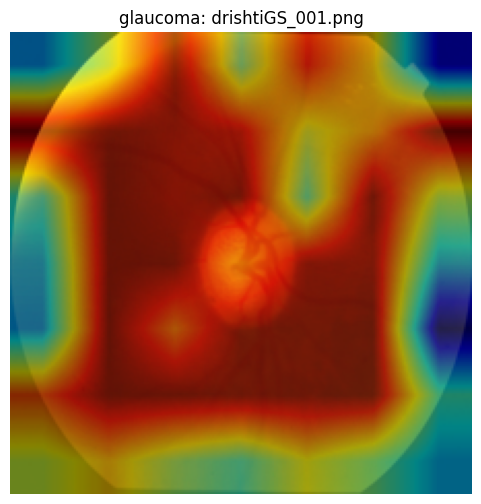

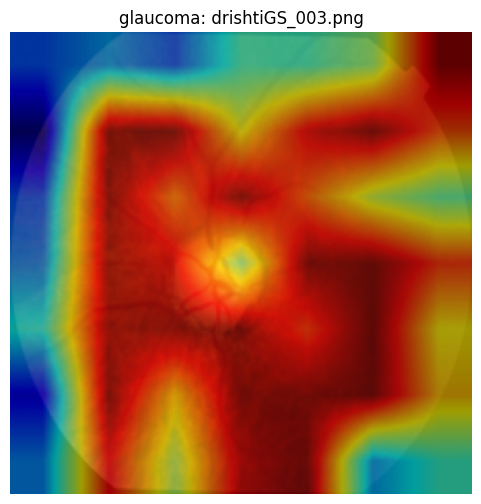

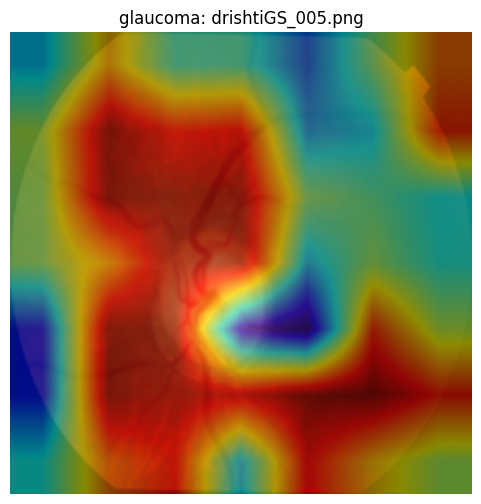

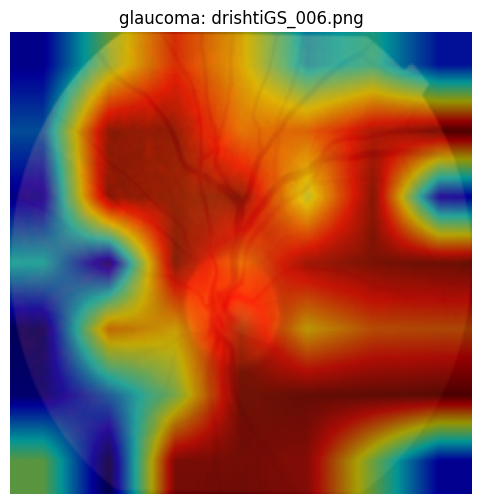

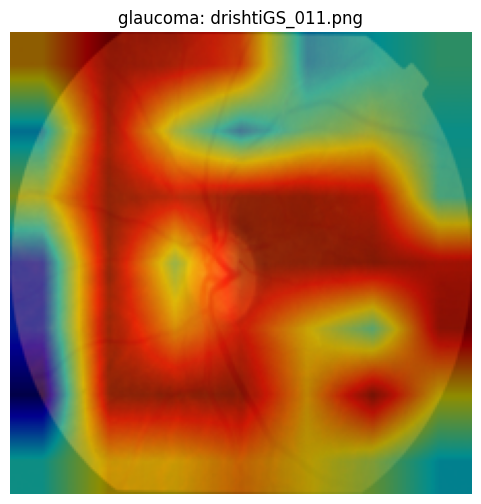

...

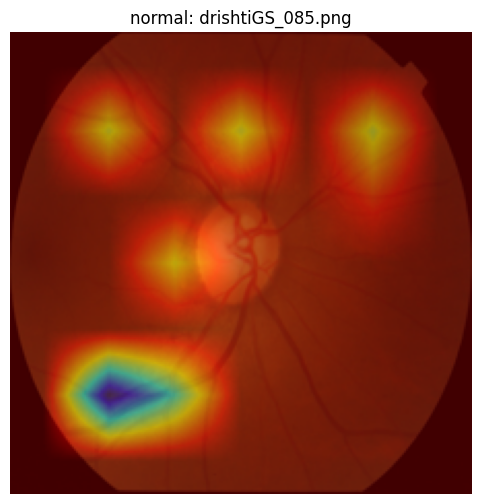

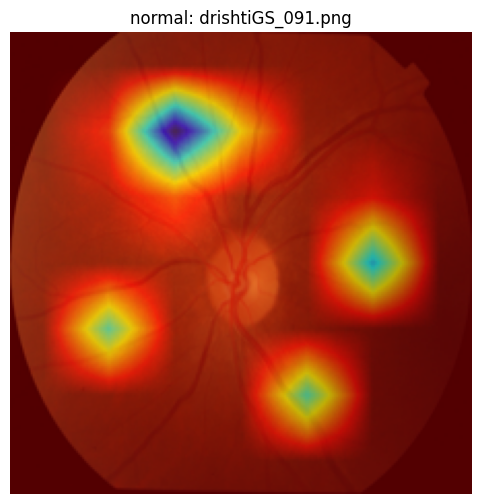

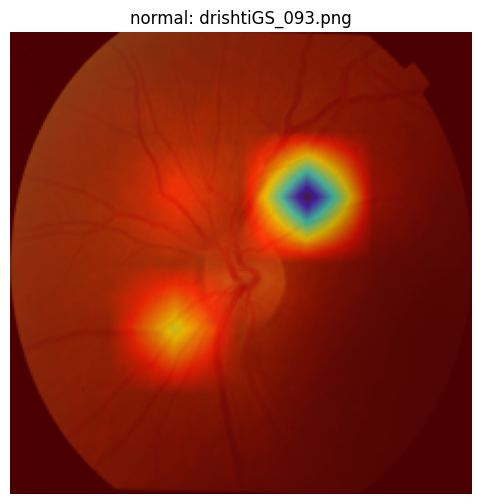

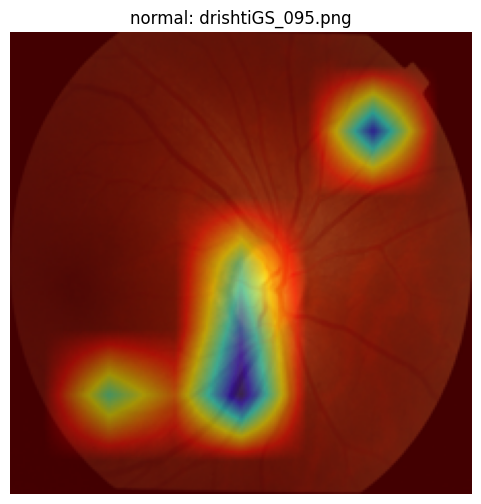

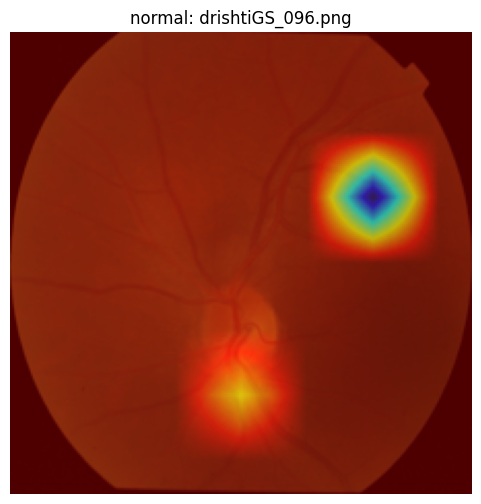

In [34]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torch.nn import functional as F
from PIL import Image

# --- Configurations ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "D:/ProjectML2 - Glaucoma/models/resnet50_acrima.pth"
glaucoma_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/glaucoma"
normal_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/normal"

# --- Preprocessing ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# --- Load Model ---
model = models.resnet50(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(model_path, map_location=device))
model = model.to(device).eval()

# --- Hook for Grad-CAM ---
gradients = []

def backward_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

target_layer = model.layer4[2].conv3
target_layer.register_full_backward_hook(backward_hook)

# --- Grad-CAM Logic ---
def generate_gradcam(image_tensor, label):
    gradients.clear()
    image_tensor = image_tensor.unsqueeze(0).to(device)
    output = model(image_tensor)
    class_score = output[0, label]
    model.zero_grad()
    class_score.backward()

    grad_val = gradients[0].detach().cpu().numpy()[0]
    fmap = target_layer_output.detach().cpu().numpy()[0]
    weights = np.mean(grad_val, axis=(1, 2))
    cam = np.zeros(fmap.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * fmap[i]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    return cam

def overlay_cam_on_image(img, cam):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    overlayed = heatmap + np.float32(img) / 255
    overlayed = overlayed / np.max(overlayed)
    return np.uint8(255 * overlayed)

# --- Forward Hook to capture activation ---
target_layer_output = None
def forward_hook(module, input, output):
    global target_layer_output
    target_layer_output = output

target_layer.register_forward_hook(forward_hook)

# --- Process Folder and Display ---
def process_folder(folder_path, label, class_name, count=10):
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png'))][:count]
    for img_name in image_files:
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert("RGB")
        img_tensor = transform(img)

        cam = generate_gradcam(img_tensor, label)
        img_np = np.array(img.resize((224, 224)))
        overlayed = overlay_cam_on_image(img_np, cam)

        # Display the image
        plt.figure(figsize=(6, 6))
        plt.imshow(overlayed)
        plt.title(f"{class_name}: {img_name}")
        plt.axis("off")
        plt.show()

# --- RUN ---
process_folder(glaucoma_folder, label=1, class_name="glaucoma")
process_folder(normal_folder, label=0, class_name="normal")

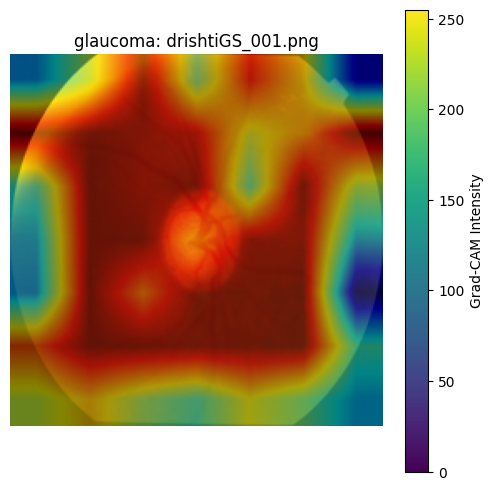

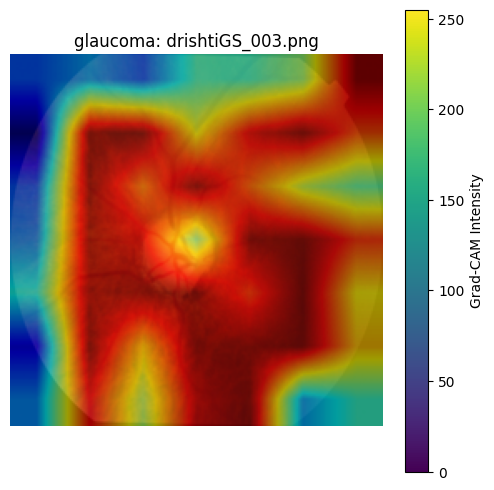

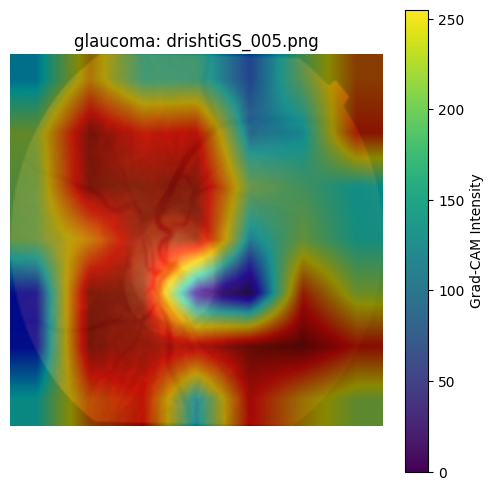

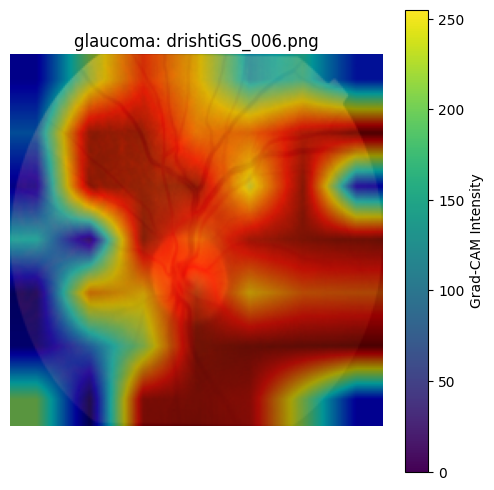

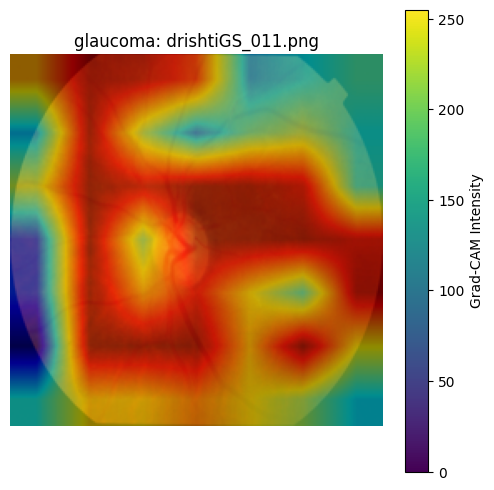

...

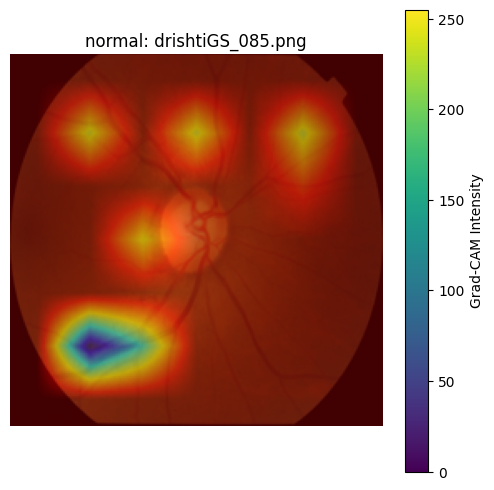

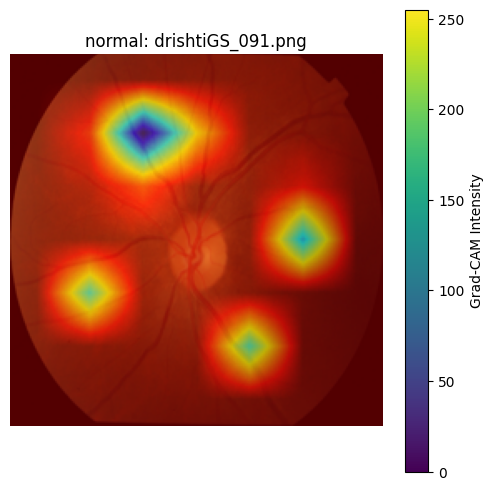

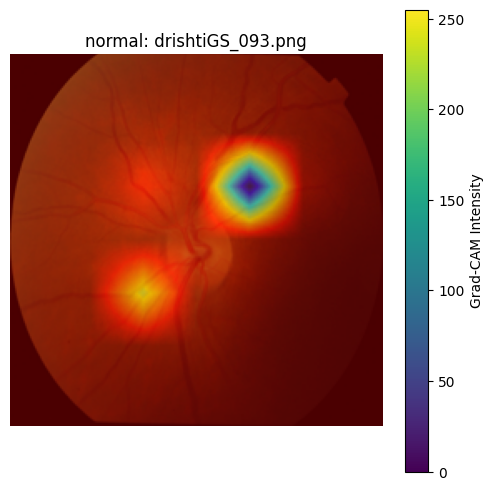

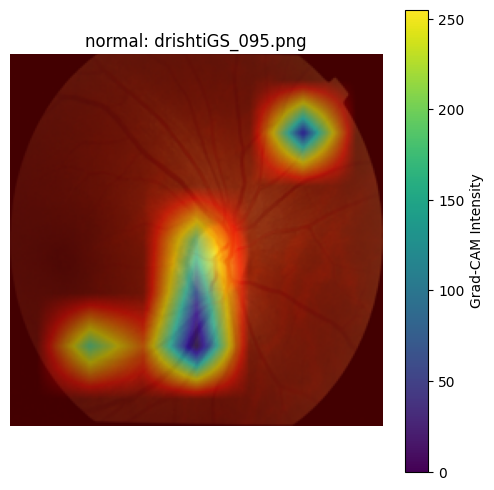

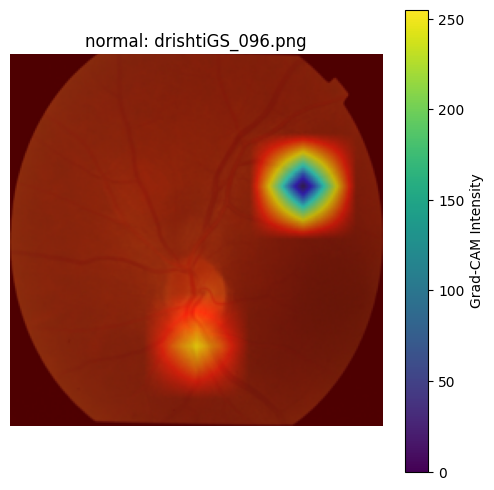

In [36]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from torch.nn import functional as F
from PIL import Image

# --- Configurations ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = "D:/ProjectML2 - Glaucoma/models/resnet50_acrima.pth"
glaucoma_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/glaucoma"
normal_folder = "D:/ProjectML2 - Glaucoma/Dataset/Drishti-GS/Test-20211018T060000Z-001/Test/Images/normal"

# --- Preprocessing ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# --- Load Model ---
model = models.resnet50(weights=None)
model.fc = torch.nn.Linear(model.fc.in_features, 2)
model.load_state_dict(torch.load(model_path, map_location=device))
model = model.to(device).eval()

# --- Hook for Grad-CAM ---
gradients = []

def backward_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

target_layer = model.layer4[2].conv3
target_layer.register_full_backward_hook(backward_hook)

# --- Grad-CAM Logic ---
def generate_gradcam(image_tensor, label):
    gradients.clear()
    image_tensor = image_tensor.unsqueeze(0).to(device)
    output = model(image_tensor)
    class_score = output[0, label]
    model.zero_grad()
    class_score.backward()

    grad_val = gradients[0].detach().cpu().numpy()[0]
    fmap = target_layer_output.detach().cpu().numpy()[0]
    weights = np.mean(grad_val, axis=(1, 2))
    cam = np.zeros(fmap.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * fmap[i]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = (cam - cam.min()) / (cam.max() - cam.min())
    return cam

def overlay_cam_on_image(img, cam, alpha=0.5):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    overlayed = alpha * heatmap + (1 - alpha) * np.float32(img) / 255
    overlayed = overlayed / np.max(overlayed)
    return np.uint8(255 * overlayed)

# --- Forward Hook to capture activation ---
target_layer_output = None
def forward_hook(module, input, output):
    global target_layer_output
    target_layer_output = output

target_layer.register_forward_hook(forward_hook)

# --- Process Folder and Display ---
def process_folder(folder_path, label, class_name, count=10):
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.png'))][:count]
    for img_name in image_files:
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert("RGB")
        img_tensor = transform(img)

        cam = generate_gradcam(img_tensor, label)
        img_np = np.array(img.resize((224, 224)))
        overlayed = overlay_cam_on_image(img_np, cam, alpha=0.5)  # Added alpha for better visibility

        # Display the image with a colorbar
        plt.figure(figsize=(6, 6))
        plt.imshow(overlayed)
        plt.title(f"{class_name}: {img_name}")
        plt.colorbar(label="Grad-CAM Intensity")
        plt.axis("off")
        plt.show()

# --- RUN ---
process_folder(glaucoma_folder, label=1, class_name="glaucoma")
process_folder(normal_folder, label=0, class_name="normal")

In [37]:
import shap
import joblib
import pandas as pd
import matplotlib.pyplot as plt

# Paths
csv_path = r"D:\ProjectML2 - Glaucoma\Dataset\Drishti-GS\drishti_fused_features.csv"
model_path = r"D:\ProjectML2 - Glaucoma\models\xgboost_drishti_model.pkl"

# Load data
df = pd.read_csv(csv_path)
X = df.drop(columns=["Filename", "Label"], errors="ignore")
y = df["Label"]

# Load trained XGBoost model
model = joblib.load(model_path)

# Create SHAP explainer
explainer = shap.Explainer(model)
shap_values = explainer(X)

# SHAP Summary Plot
shap.summary_plot(shap_values, X, show=False)
plt.tight_layout()
plt.savefig("drishti_shap_summary.png")
plt.close()

# SHAP Bar Plot
shap.plots.bar(shap_values, show=False)
plt.tight_layout()
plt.savefig("drishti_shap_bar.png")
plt.close()

print("✅ SHAP summary and bar plots saved as 'drishti_shap_summary.png' and 'drishti_shap_bar.png'")


✅ SHAP summary and bar plots saved as 'drishti_shap_summary.png' and 'drishti_shap_bar.png'


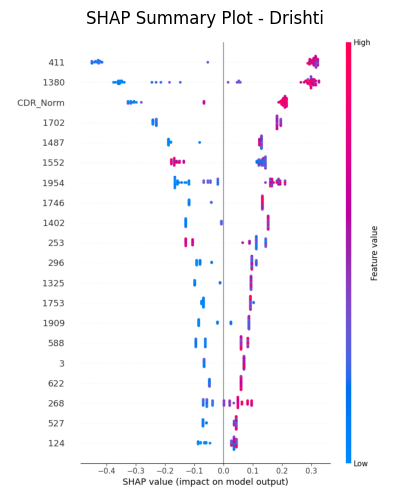

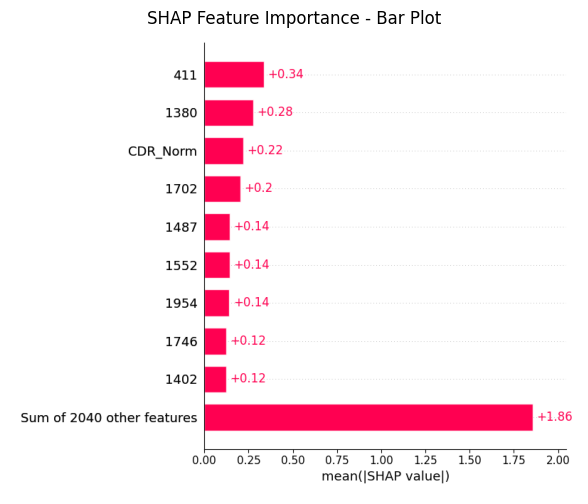

In [38]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load and display SHAP summary plot
img1 = mpimg.imread("drishti_shap_summary.png")
plt.figure(figsize=(10, 6))
plt.imshow(img1)
plt.axis('off')
plt.title("SHAP Summary Plot - Drishti")
plt.show()

# Load and display SHAP bar plot
img2 = mpimg.imread("drishti_shap_bar.png")
plt.figure(figsize=(10, 6))
plt.imshow(img2)
plt.axis('off')
plt.title("SHAP Feature Importance - Bar Plot")
plt.show()


Columns in X_acrima: ['Filename', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153'

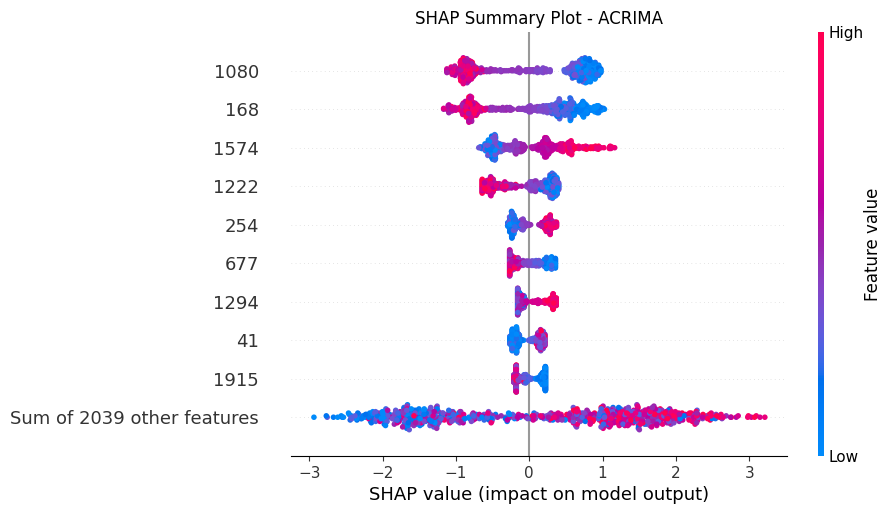

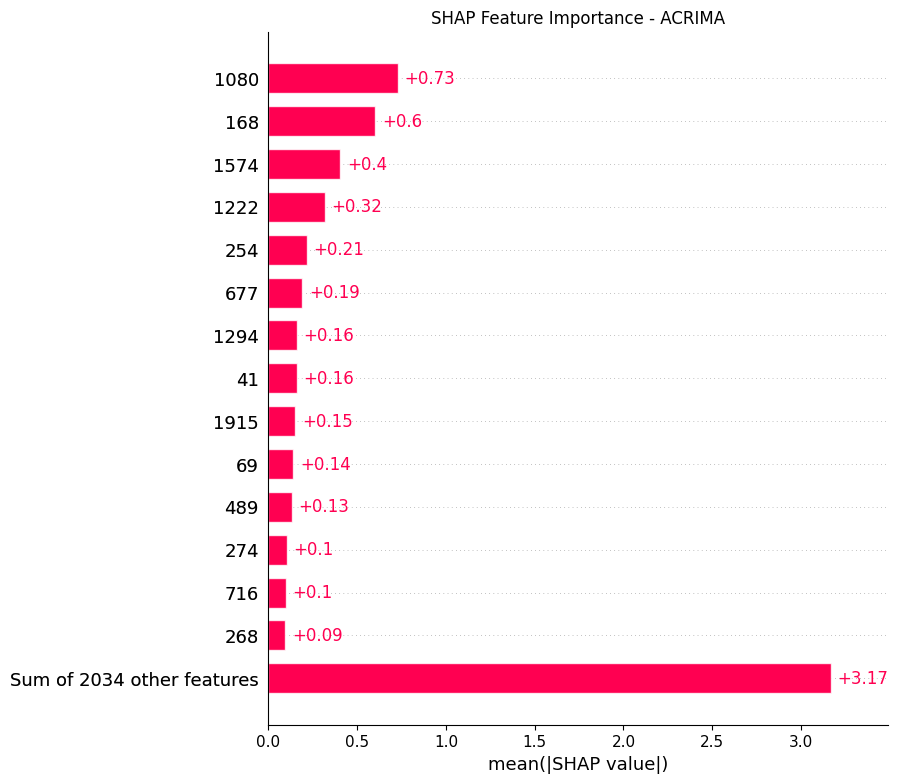

In [42]:
import pandas as pd
import shap
import pickle
import matplotlib.pyplot as plt
import os

# Load ACRIMA fused features
acrima_path = "D:/ProjectML2 - Glaucoma/Dataset/Acrima/acrima_fused_features.csv"
try:
    acrima_df = pd.read_csv(acrima_path)
except FileNotFoundError:
    print(f"Error: The file {acrima_path} was not found. Please check the path.")
    exit(1)

# Separate features and labels
# Drop the 'Label' column to create X_acrima
X_acrima = acrima_df.drop(columns=["Label"])
y_acrima = acrima_df["Label"]

# Inspect the DataFrame to identify non-numeric columns
print("Columns in X_acrima:", X_acrima.columns.tolist())
print("Data types in X_acrima:\n", X_acrima.dtypes)

# Drop the 'Filename' column (and any other non-numeric columns) from X_acrima
if "Filename" in X_acrima.columns:
    X_acrima = X_acrima.drop(columns=["Filename"])
    print("Dropped 'Filename' column from X_acrima.")

# Verify that all remaining columns are numeric
non_numeric_cols = X_acrima.select_dtypes(include=["object"]).columns
if len(non_numeric_cols) > 0:
    print(f"Warning: The following columns are still non-numeric: {non_numeric_cols.tolist()}")
    print("Dropping non-numeric columns...")
    X_acrima = X_acrima.drop(columns=non_numeric_cols)

# Load ACRIMA-trained XGBoost model
model_path = "D:/ProjectML2 - Glaucoma/models/acrima_best_xgboost.pkl"
if not os.path.exists(model_path):
    print(f"Error: The file {model_path} does not exist. Please verify the path and file name.")
    exit(1)

try:
    with open(model_path, "rb") as f:
        model_acrima = pickle.load(f)
except Exception as e:
    print(f"Error loading the model: {e}")
    exit(1)

# SHAP Explainer
explainer_acrima = shap.Explainer(model_acrima)
shap_values_acrima = explainer_acrima(X_acrima)

# SHAP Summary Plot (Beeswarm)
plt.figure(figsize=(10, 6))
plt.title("SHAP Summary Plot - ACRIMA")
shap.plots.beeswarm(shap_values_acrima, show=False)
plt.show()

# SHAP Bar Plot
plt.figure(figsize=(10, 6))
plt.title("SHAP Feature Importance - ACRIMA")
shap.plots.bar(shap_values_acrima, max_display=15, show=False)
plt.show()